
## Avant de commencer le TP, 
- vérifiez que vous êtes sur un environnement GPU et python 3 : 
  
  Éxecution -> Modifier le type d'éxecution -> Type d'éxecution = python2, Accélerateur matériel = GPU

- Fichier -> Sauvegarder une copie dans mon drive

In [2]:
!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git

Cloning into 'deep-learning-polytech-tp6-7'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 19 (delta 2), reused 7 (delta 1), pack-reused 8
Unpacking objects: 100% (19/19), done.


In [1]:
cd deep-learning-polytech-tp6-7


/content/deep-learning-polytech-tp6-7


In [2]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets

from tme6 import *

PRINT_INTERVAL = 200
PATH="datasets"
datasets.CIFAR10.url = "http://webia.lip6.fr/~robert/cours/rdfia/cifar-10-python.tar.gz"

In [ ]:
class  AlexNet(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNet, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.407s (0.407s)	Loss 2.3044 (2.3044)	Prec@1   6.2 (  6.2)	Prec@5  43.0 ( 43.0)


<Figure size 432x288 with 0 Axes>

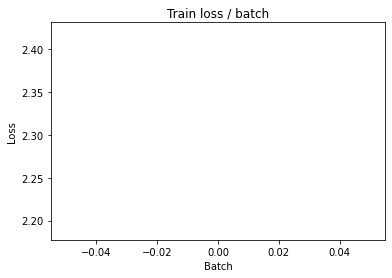

[TRAIN Batch 200/391]	Time 0.024s (0.020s)	Loss 1.9133 (2.1996)	Prec@1  35.2 ( 18.3)	Prec@5  82.0 ( 65.5)


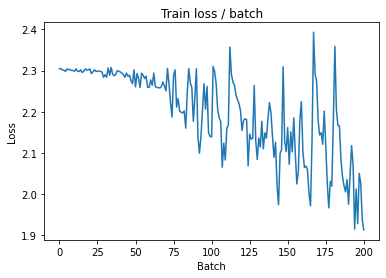


===============> Total time 7s	Avg loss 2.0532	Avg Prec@1 24.72 %	Avg Prec@5 73.60 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.7049 (1.7049)	Prec@1  42.2 ( 42.2)	Prec@5  88.3 ( 88.3)

===============> Total time 1s	Avg loss 1.7779	Avg Prec@1 35.49 %	Avg Prec@5 86.27 %



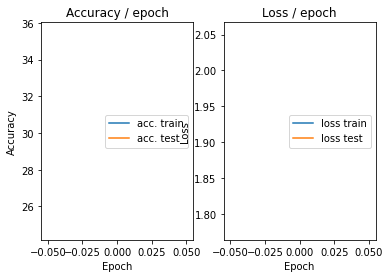

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 1.6757 (1.6757)	Prec@1  37.5 ( 37.5)	Prec@5  88.3 ( 88.3)


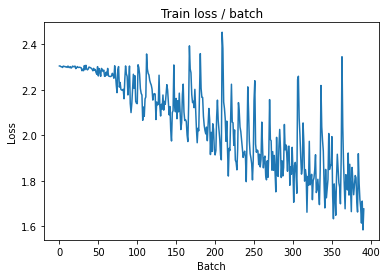

[TRAIN Batch 200/391]	Time 0.013s (0.019s)	Loss 1.5537 (1.6852)	Prec@1  50.0 ( 39.7)	Prec@5  92.2 ( 87.9)


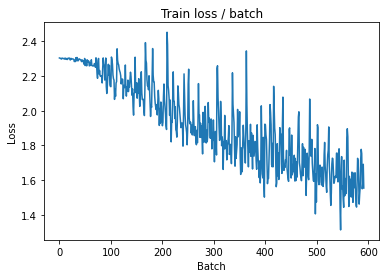


===============> Total time 7s	Avg loss 1.6010	Avg Prec@1 42.67 %	Avg Prec@5 89.62 %

[EVAL Batch 000/079]	Time 0.118s (0.118s)	Loss 1.5424 (1.5424)	Prec@1  45.3 ( 45.3)	Prec@5  92.2 ( 92.2)

===============> Total time 1s	Avg loss 1.5563	Avg Prec@1 44.21 %	Avg Prec@5 90.58 %



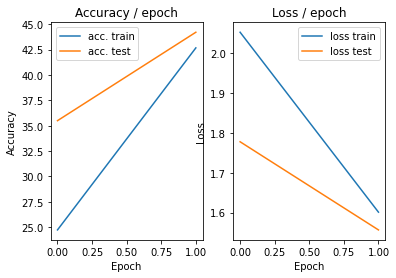

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.128s (0.128s)	Loss 1.5162 (1.5162)	Prec@1  49.2 ( 49.2)	Prec@5  89.1 ( 89.1)


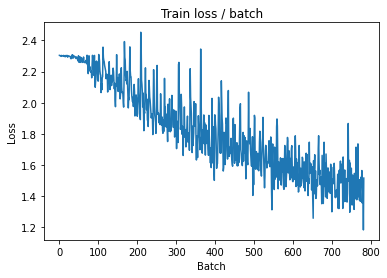

[TRAIN Batch 200/391]	Time 0.013s (0.019s)	Loss 1.3548 (1.4111)	Prec@1  46.1 ( 49.4)	Prec@5  96.1 ( 92.7)


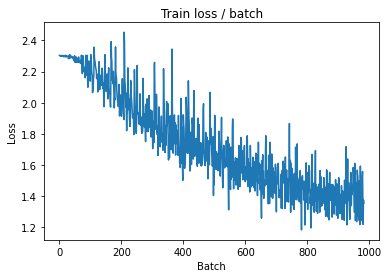


===============> Total time 7s	Avg loss 1.3711	Avg Prec@1 51.00 %	Avg Prec@5 93.21 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.2662 (1.2662)	Prec@1  56.2 ( 56.2)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.3503	Avg Prec@1 51.76 %	Avg Prec@5 93.88 %



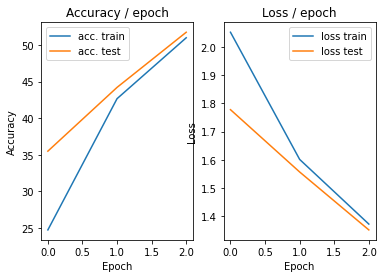

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.130s (0.130s)	Loss 1.1807 (1.1807)	Prec@1  57.0 ( 57.0)	Prec@5  95.3 ( 95.3)


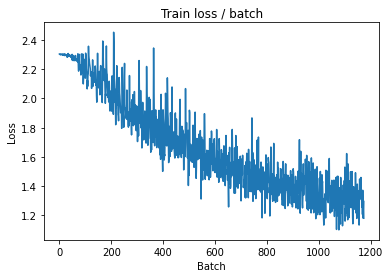

[TRAIN Batch 200/391]	Time 0.024s (0.019s)	Loss 1.1260 (1.2443)	Prec@1  65.6 ( 56.1)	Prec@5  96.1 ( 94.8)


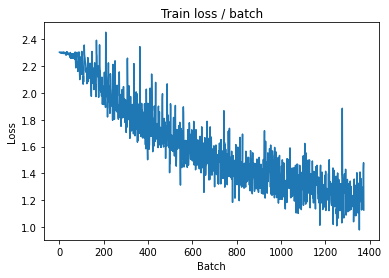


===============> Total time 7s	Avg loss 1.2105	Avg Prec@1 57.25 %	Avg Prec@5 95.13 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 0.9819 (0.9819)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1680	Avg Prec@1 58.63 %	Avg Prec@5 95.39 %



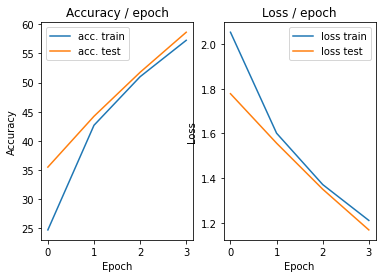

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.9617 (0.9617)	Prec@1  66.4 ( 66.4)	Prec@5  96.9 ( 96.9)


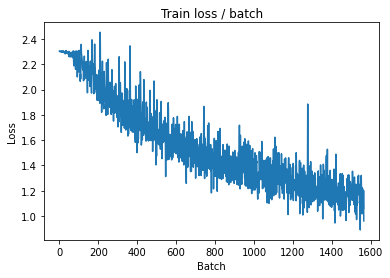

[TRAIN Batch 200/391]	Time 0.011s (0.020s)	Loss 0.9660 (1.0913)	Prec@1  60.2 ( 61.2)	Prec@5  96.9 ( 96.3)


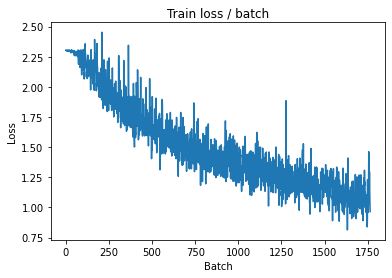


===============> Total time 7s	Avg loss 1.0775	Avg Prec@1 61.94 %	Avg Prec@5 96.29 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.0563 (1.0563)	Prec@1  64.8 ( 64.8)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1412	Avg Prec@1 59.50 %	Avg Prec@5 95.87 %



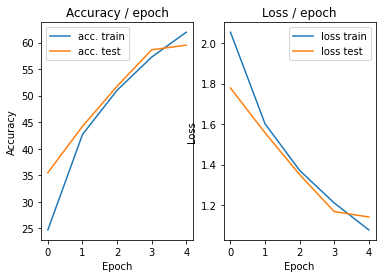

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.130s (0.130s)	Loss 1.1037 (1.1037)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)


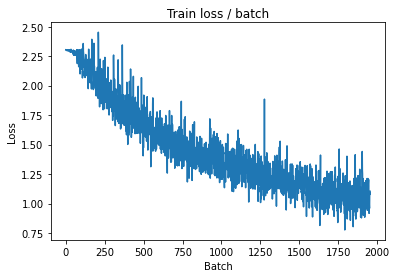

[TRAIN Batch 200/391]	Time 0.027s (0.021s)	Loss 0.9770 (0.9702)	Prec@1  66.4 ( 65.9)	Prec@5  96.9 ( 96.9)


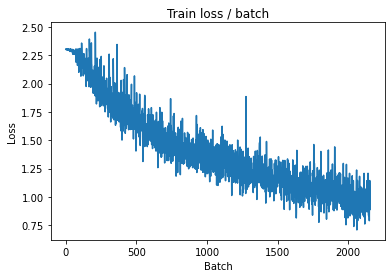


===============> Total time 7s	Avg loss 0.9554	Avg Prec@1 66.39 %	Avg Prec@5 97.01 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 0.9479 (0.9479)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.0493	Avg Prec@1 64.06 %	Avg Prec@5 96.83 %



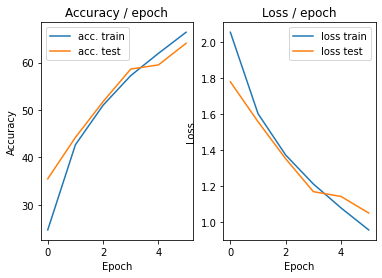

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.145s (0.145s)	Loss 0.7982 (0.7982)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)


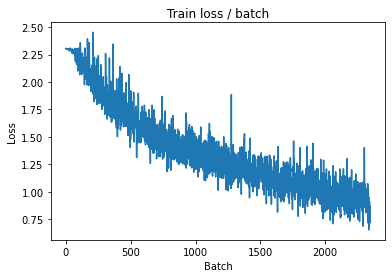

[TRAIN Batch 200/391]	Time 0.020s (0.019s)	Loss 0.5711 (0.8542)	Prec@1  78.1 ( 69.8)	Prec@5 100.0 ( 97.8)


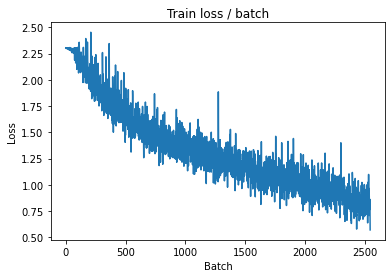


===============> Total time 7s	Avg loss 0.8456	Avg Prec@1 70.30 %	Avg Prec@5 97.85 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 0.9002 (0.9002)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 0.9551	Avg Prec@1 67.07 %	Avg Prec@5 96.95 %



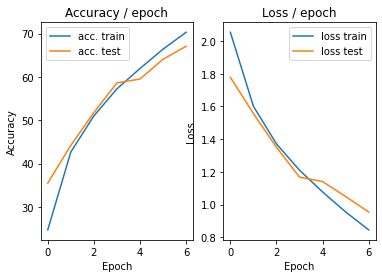

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.7479 (0.7479)	Prec@1  70.3 ( 70.3)	Prec@5  99.2 ( 99.2)


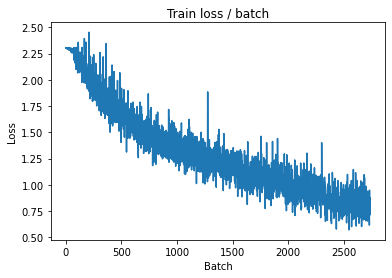

[TRAIN Batch 200/391]	Time 0.022s (0.019s)	Loss 0.5741 (0.7512)	Prec@1  80.5 ( 73.7)	Prec@5  99.2 ( 98.4)


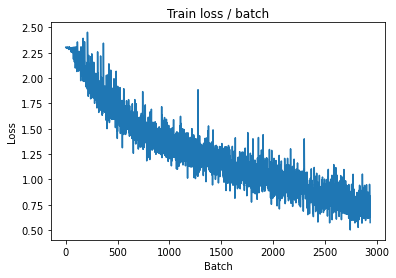


===============> Total time 7s	Avg loss 0.7424	Avg Prec@1 74.13 %	Avg Prec@5 98.43 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 0.9088 (0.9088)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 0.9524	Avg Prec@1 67.63 %	Avg Prec@5 96.86 %



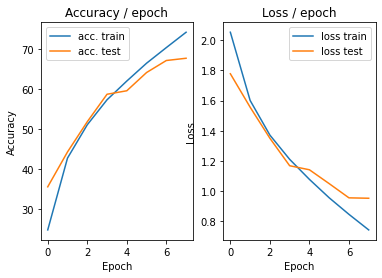

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.135s (0.135s)	Loss 0.6617 (0.6617)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)


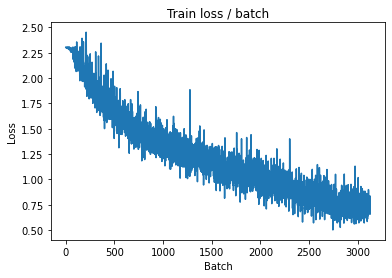

[TRAIN Batch 200/391]	Time 0.028s (0.019s)	Loss 0.6695 (0.6394)	Prec@1  78.1 ( 77.8)	Prec@5  99.2 ( 98.8)


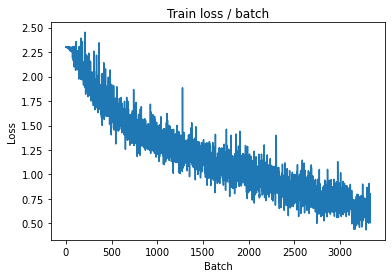


===============> Total time 7s	Avg loss 0.6444	Avg Prec@1 77.61 %	Avg Prec@5 98.84 %

[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.9371 (0.9371)	Prec@1  70.3 ( 70.3)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.9515	Avg Prec@1 67.74 %	Avg Prec@5 97.29 %



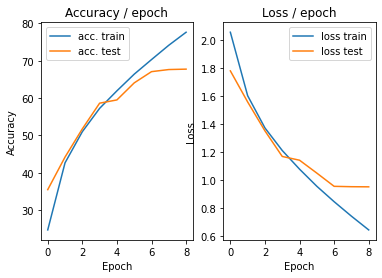

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.142s (0.142s)	Loss 0.5309 (0.5309)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


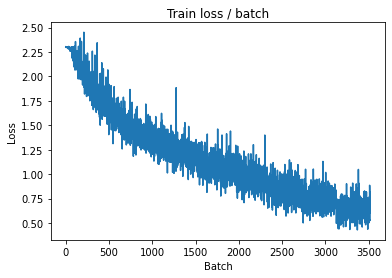

[TRAIN Batch 200/391]	Time 0.022s (0.019s)	Loss 0.6750 (0.5398)	Prec@1  75.0 ( 81.0)	Prec@5  99.2 ( 99.4)


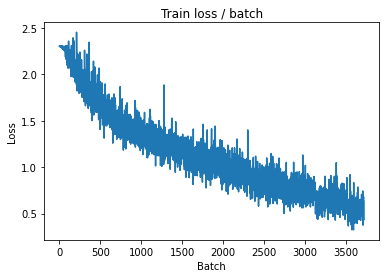


===============> Total time 7s	Avg loss 0.5514	Avg Prec@1 80.68 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 0.9312 (0.9312)	Prec@1  70.3 ( 70.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 0.9480	Avg Prec@1 69.26 %	Avg Prec@5 97.23 %



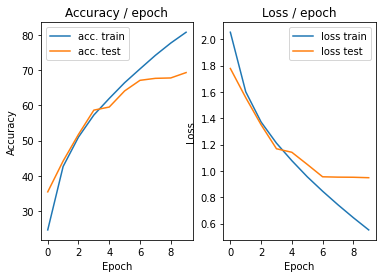

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.4521 (0.4521)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


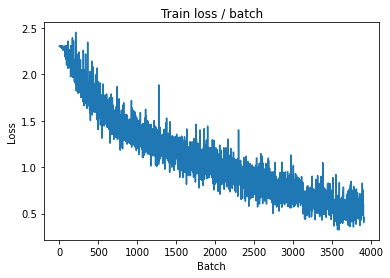

[TRAIN Batch 200/391]	Time 0.020s (0.019s)	Loss 0.6084 (0.4373)	Prec@1  78.9 ( 84.7)	Prec@5 100.0 ( 99.6)


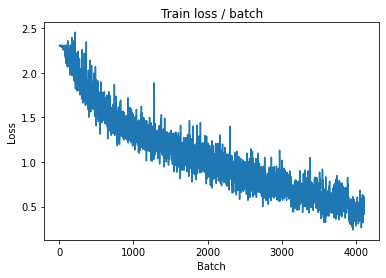


===============> Total time 7s	Avg loss 0.4526	Avg Prec@1 84.19 %	Avg Prec@5 99.56 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 1.0044 (1.0044)	Prec@1  71.9 ( 71.9)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.0377	Avg Prec@1 67.69 %	Avg Prec@5 97.20 %



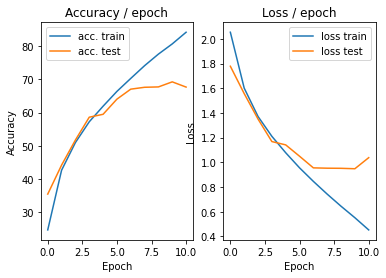

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.4107 (0.4107)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


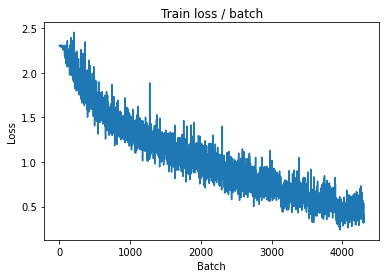

[TRAIN Batch 200/391]	Time 0.024s (0.019s)	Loss 0.3177 (0.3384)	Prec@1  87.5 ( 88.3)	Prec@5 100.0 ( 99.8)


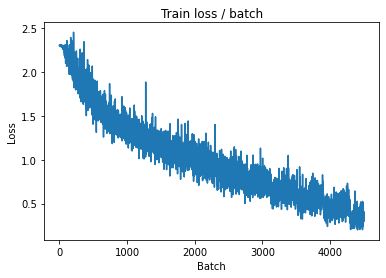


===============> Total time 7s	Avg loss 0.3588	Avg Prec@1 87.48 %	Avg Prec@5 99.77 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 1.1499 (1.1499)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1134	Avg Prec@1 68.16 %	Avg Prec@5 97.17 %



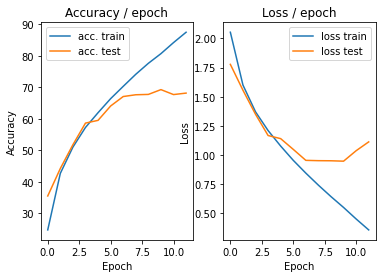

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.146s (0.146s)	Loss 0.3538 (0.3538)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)


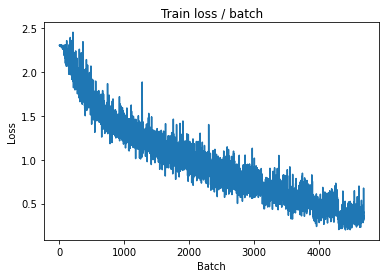

[TRAIN Batch 200/391]	Time 0.007s (0.019s)	Loss 0.2511 (0.2506)	Prec@1  92.2 ( 91.4)	Prec@5 100.0 ( 99.9)


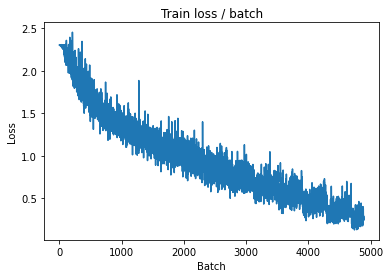


===============> Total time 7s	Avg loss 0.2753	Avg Prec@1 90.44 %	Avg Prec@5 99.89 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.1816 (1.1816)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.2237	Avg Prec@1 67.27 %	Avg Prec@5 97.43 %



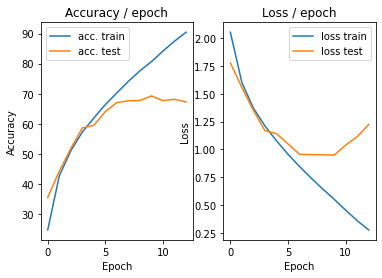

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.3372 (0.3372)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


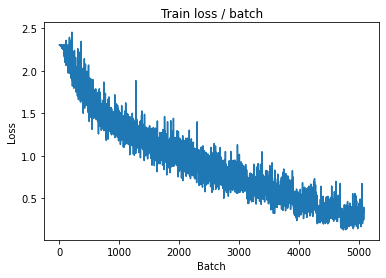

[TRAIN Batch 200/391]	Time 0.024s (0.019s)	Loss 0.3208 (0.1930)	Prec@1  89.8 ( 93.6)	Prec@5 100.0 (100.0)


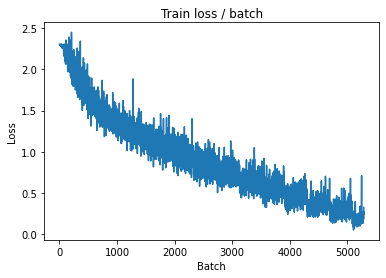


===============> Total time 7s	Avg loss 0.2074	Avg Prec@1 92.94 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.2280 (1.2280)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.2093	Avg Prec@1 70.44 %	Avg Prec@5 97.35 %



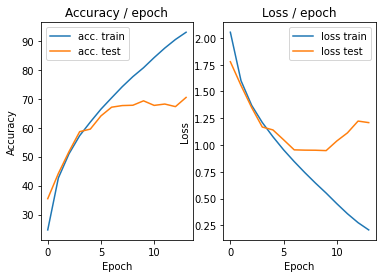

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 0.0684 (0.0684)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


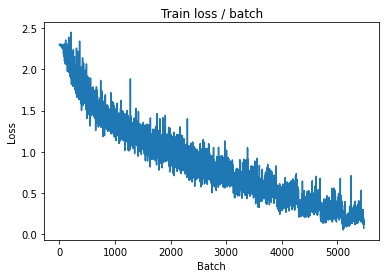

[TRAIN Batch 200/391]	Time 0.028s (0.019s)	Loss 0.2564 (0.1185)	Prec@1  89.1 ( 96.2)	Prec@5 100.0 (100.0)


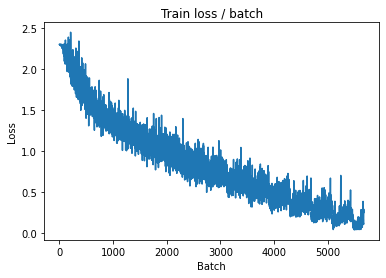


===============> Total time 7s	Avg loss 0.1431	Avg Prec@1 95.21 %	Avg Prec@5 99.97 %

[EVAL Batch 000/079]	Time 0.113s (0.113s)	Loss 1.3189 (1.3189)	Prec@1  68.8 ( 68.8)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.2948	Avg Prec@1 70.34 %	Avg Prec@5 97.40 %



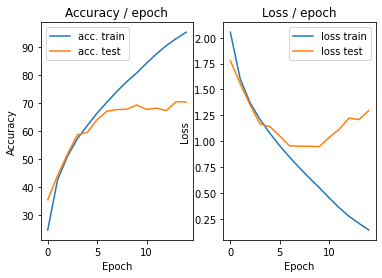

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.138s (0.138s)	Loss 0.1172 (0.1172)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


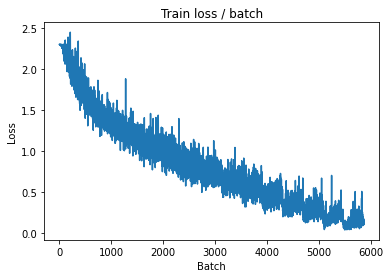

[TRAIN Batch 200/391]	Time 0.030s (0.019s)	Loss 0.0349 (0.0819)	Prec@1 100.0 ( 97.4)	Prec@5 100.0 (100.0)


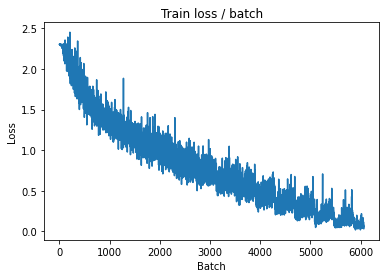


===============> Total time 7s	Avg loss 0.0982	Avg Prec@1 96.77 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.5823 (1.5823)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.3887	Avg Prec@1 69.93 %	Avg Prec@5 97.05 %



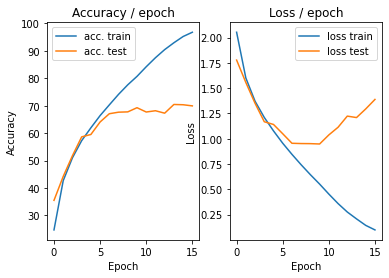

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.157s (0.157s)	Loss 0.0844 (0.0844)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


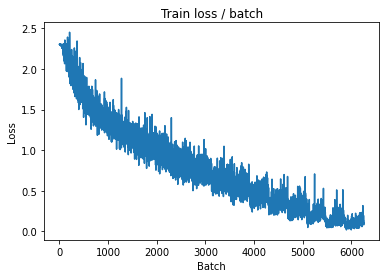

[TRAIN Batch 200/391]	Time 0.020s (0.020s)	Loss 0.0351 (0.0489)	Prec@1  99.2 ( 98.6)	Prec@5 100.0 (100.0)


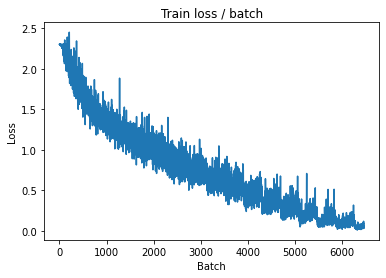


===============> Total time 7s	Avg loss 0.0941	Avg Prec@1 97.12 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 1.7086 (1.7086)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.4260	Avg Prec@1 70.75 %	Avg Prec@5 97.13 %



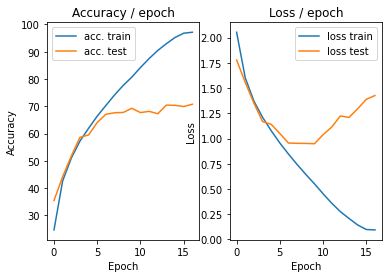

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 0.0572 (0.0572)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


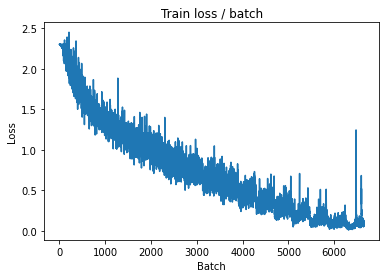

[TRAIN Batch 200/391]	Time 0.011s (0.019s)	Loss 0.0636 (0.0521)	Prec@1  97.7 ( 98.5)	Prec@5 100.0 (100.0)


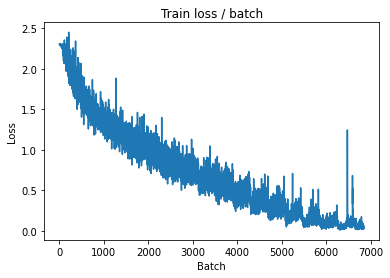


===============> Total time 7s	Avg loss 0.0540	Avg Prec@1 98.36 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.9658 (1.9658)	Prec@1  73.4 ( 73.4)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.7584	Avg Prec@1 69.38 %	Avg Prec@5 97.08 %



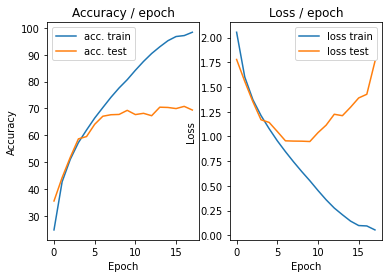

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.0841 (0.0841)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


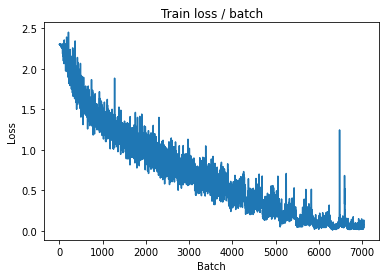

[TRAIN Batch 200/391]	Time 0.014s (0.019s)	Loss 0.0381 (0.0543)	Prec@1  98.4 ( 98.3)	Prec@5 100.0 (100.0)


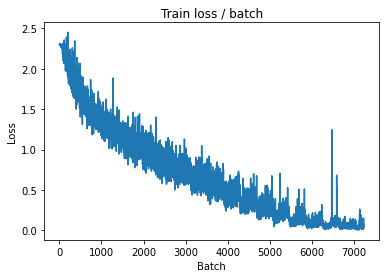


===============> Total time 7s	Avg loss 0.0529	Avg Prec@1 98.35 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.136s (0.136s)	Loss 1.7951 (1.7951)	Prec@1  71.1 ( 71.1)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.8036	Avg Prec@1 68.26 %	Avg Prec@5 97.20 %



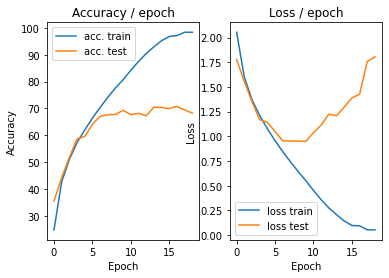

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.141s (0.141s)	Loss 0.1403 (0.1403)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


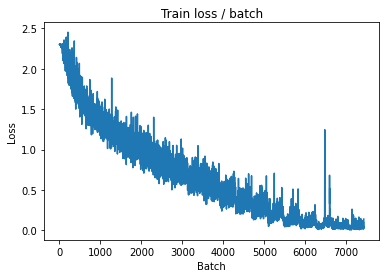

[TRAIN Batch 200/391]	Time 0.013s (0.019s)	Loss 0.0037 (0.0205)	Prec@1 100.0 ( 99.5)	Prec@5 100.0 (100.0)


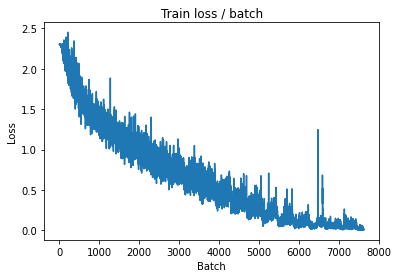


===============> Total time 7s	Avg loss 0.0935	Avg Prec@1 97.87 %	Avg Prec@5 99.76 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.3613 (1.3613)	Prec@1  65.6 ( 65.6)	Prec@5  92.2 ( 92.2)

===============> Total time 1s	Avg loss 1.2330	Avg Prec@1 64.26 %	Avg Prec@5 95.27 %



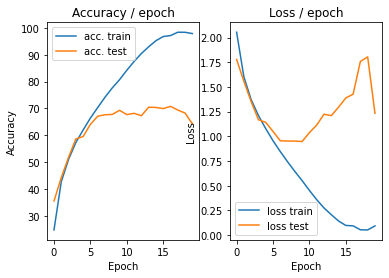

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.137s (0.137s)	Loss 0.3489 (0.3489)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)


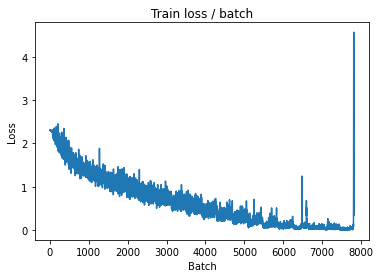

[TRAIN Batch 200/391]	Time 0.022s (0.019s)	Loss 0.0465 (0.0920)	Prec@1  97.7 ( 97.1)	Prec@5 100.0 (100.0)


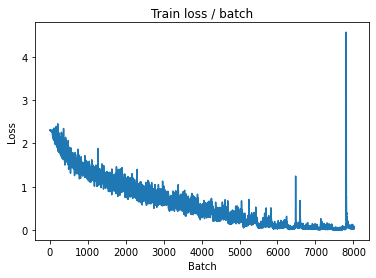


===============> Total time 7s	Avg loss 0.0777	Avg Prec@1 97.55 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.127s (0.127s)	Loss 1.9800 (1.9800)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.6958	Avg Prec@1 70.62 %	Avg Prec@5 97.05 %



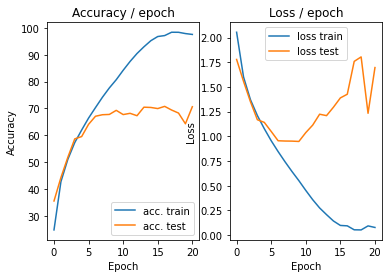

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.136s (0.136s)	Loss 0.0586 (0.0586)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


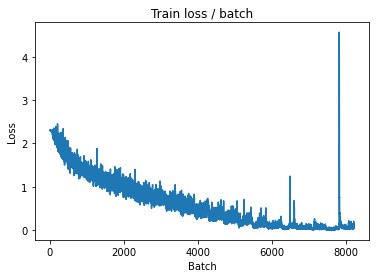

[TRAIN Batch 200/391]	Time 0.007s (0.018s)	Loss 0.0180 (0.0177)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


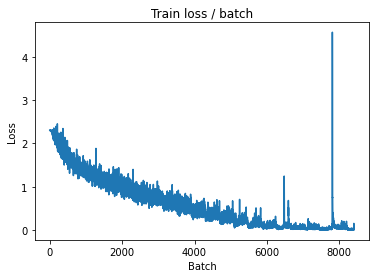


===============> Total time 7s	Avg loss 0.0231	Avg Prec@1 99.32 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 2.0080 (2.0080)	Prec@1  73.4 ( 73.4)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 2.0124	Avg Prec@1 69.12 %	Avg Prec@5 96.78 %



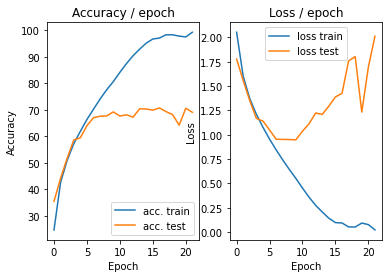

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 0.0677 (0.0677)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


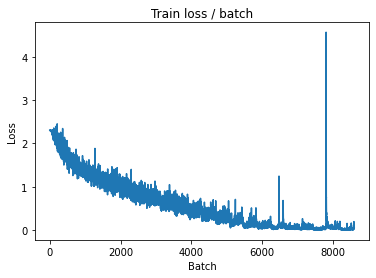

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0234 (0.0232)	Prec@1  99.2 ( 99.3)	Prec@5 100.0 (100.0)


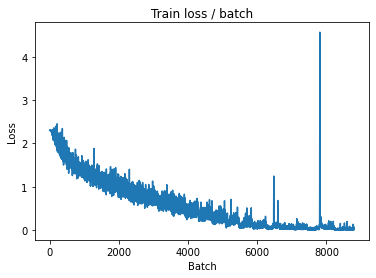


===============> Total time 7s	Avg loss 0.0261	Avg Prec@1 99.26 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.9999 (1.9999)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.8263	Avg Prec@1 71.06 %	Avg Prec@5 97.40 %



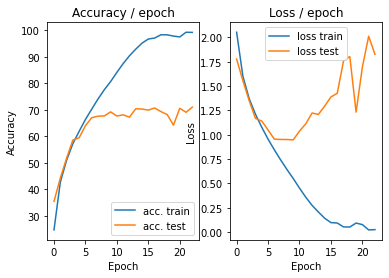

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.0249 (0.0249)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


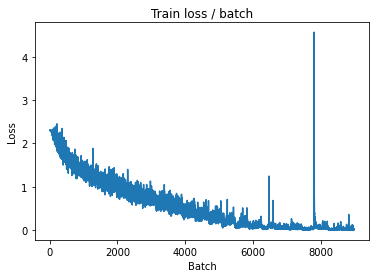

[TRAIN Batch 200/391]	Time 0.021s (0.019s)	Loss 0.0024 (0.0118)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


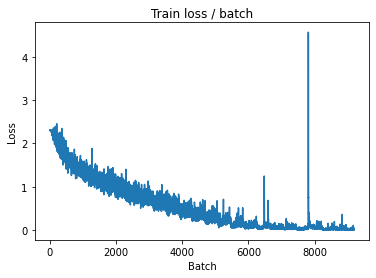


===============> Total time 7s	Avg loss 0.0123	Avg Prec@1 99.70 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 2.3191 (2.3191)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.9609	Avg Prec@1 71.36 %	Avg Prec@5 97.17 %



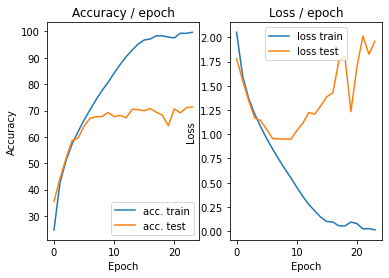

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 0.0092 (0.0092)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


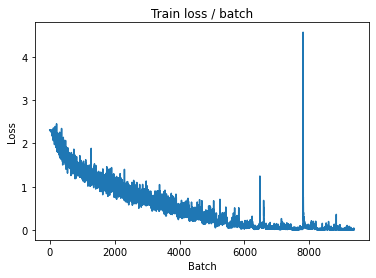

[TRAIN Batch 200/391]	Time 0.015s (0.018s)	Loss 0.0093 (0.0044)	Prec@1  99.2 ( 99.9)	Prec@5 100.0 (100.0)


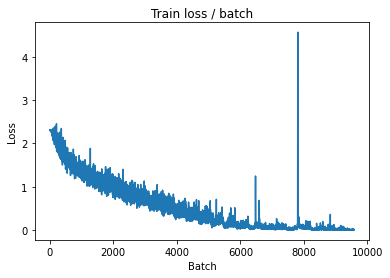


===============> Total time 6s	Avg loss 0.0037	Avg Prec@1 99.92 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 2.2768 (2.2768)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 2.0007	Avg Prec@1 71.50 %	Avg Prec@5 97.40 %



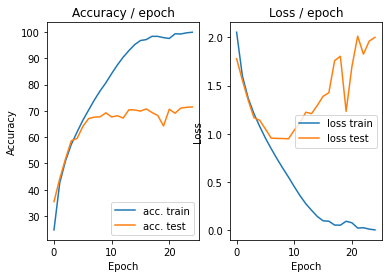

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.121s (0.121s)	Loss 0.0030 (0.0030)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


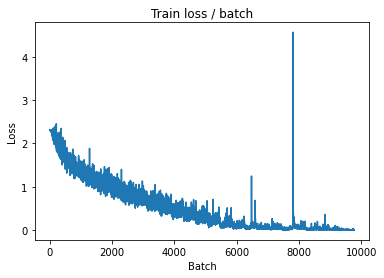

[TRAIN Batch 200/391]	Time 0.011s (0.018s)	Loss 0.0004 (0.0014)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


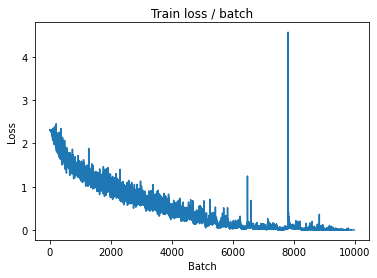


===============> Total time 6s	Avg loss 0.0010	Avg Prec@1 99.99 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.122s (0.122s)	Loss 2.3828 (2.3828)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 2.0597	Avg Prec@1 72.13 %	Avg Prec@5 97.41 %



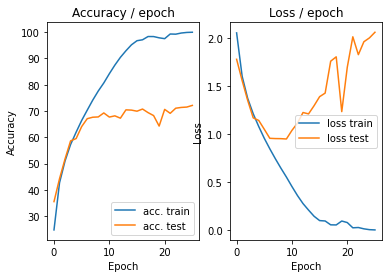

In [ ]:
main(128, 0.1, cuda=True)




# Normalisation

In [ ]:
class  AlexNetnormalisation(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetnormalisation, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def mainnormal(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetnormalisation()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.173s (0.173s)	Loss 2.3071 (2.3071)	Prec@1  10.9 ( 10.9)	Prec@5  42.2 ( 42.2)


<Figure size 432x288 with 0 Axes>

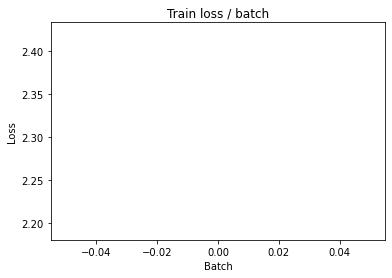

[TRAIN Batch 200/391]	Time 0.024s (0.032s)	Loss 1.7059 (1.9226)	Prec@1  28.9 ( 29.7)	Prec@5  87.5 ( 80.2)


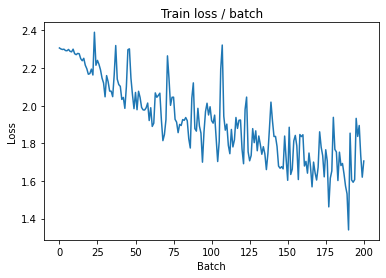


===============> Total time 12s	Avg loss 1.7306	Avg Prec@1 37.07 %	Avg Prec@5 85.57 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.5393 (1.5393)	Prec@1  43.0 ( 43.0)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.4653	Avg Prec@1 46.56 %	Avg Prec@5 92.48 %



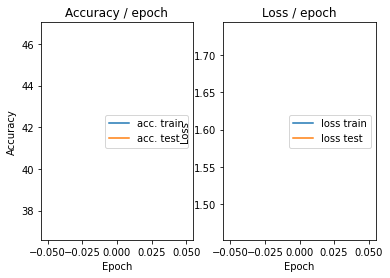

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.165s (0.165s)	Loss 1.6453 (1.6453)	Prec@1  44.5 ( 44.5)	Prec@5  85.2 ( 85.2)


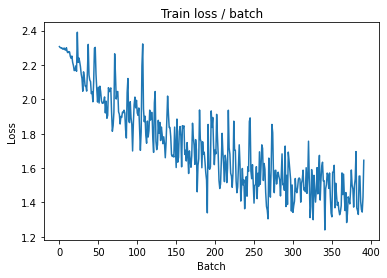

[TRAIN Batch 200/391]	Time 0.039s (0.031s)	Loss 1.3324 (1.3430)	Prec@1  57.8 ( 52.3)	Prec@5  92.2 ( 93.8)


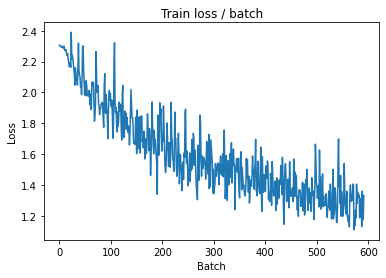


===============> Total time 12s	Avg loss 1.2751	Avg Prec@1 54.79 %	Avg Prec@5 94.53 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 1.2249 (1.2249)	Prec@1  57.8 ( 57.8)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.2394	Avg Prec@1 56.38 %	Avg Prec@5 95.31 %



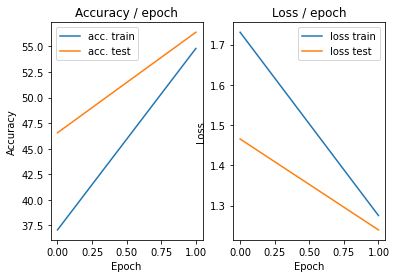

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.173s (0.173s)	Loss 1.2025 (1.2025)	Prec@1  57.8 ( 57.8)	Prec@5  95.3 ( 95.3)


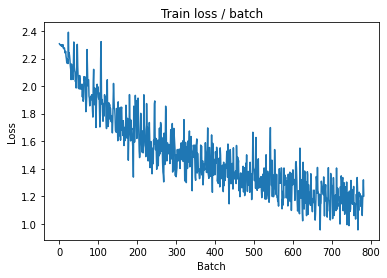

[TRAIN Batch 200/391]	Time 0.038s (0.031s)	Loss 1.0758 (1.0713)	Prec@1  64.8 ( 62.6)	Prec@5  95.3 ( 96.4)


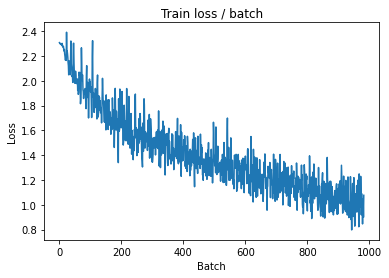


===============> Total time 12s	Avg loss 1.0354	Avg Prec@1 63.83 %	Avg Prec@5 96.62 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.9206 (0.9206)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9969	Avg Prec@1 65.26 %	Avg Prec@5 96.76 %



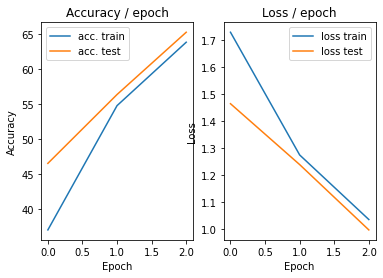

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 0.8109 (0.8109)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


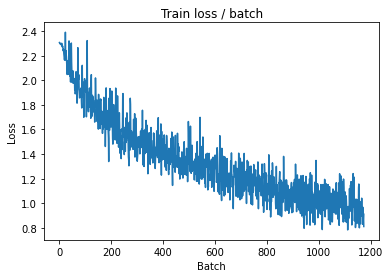

[TRAIN Batch 200/391]	Time 0.021s (0.032s)	Loss 1.0736 (0.8729)	Prec@1  65.6 ( 69.6)	Prec@5  96.1 ( 97.6)


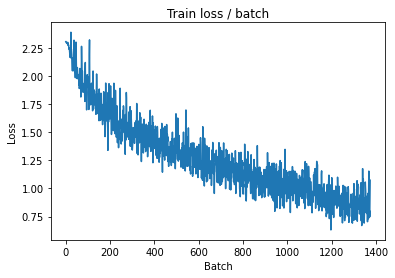


===============> Total time 12s	Avg loss 0.8627	Avg Prec@1 69.86 %	Avg Prec@5 97.63 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.7924 (0.7924)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8814	Avg Prec@1 69.38 %	Avg Prec@5 97.33 %



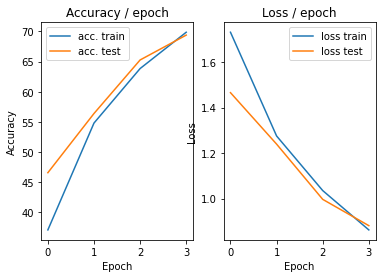

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.167s (0.167s)	Loss 0.6180 (0.6180)	Prec@1  74.2 ( 74.2)	Prec@5 100.0 (100.0)


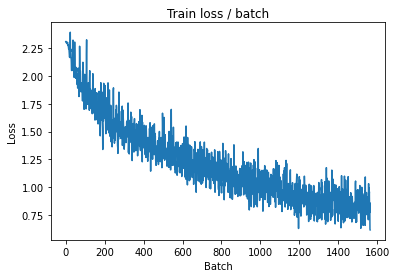

[TRAIN Batch 200/391]	Time 0.036s (0.032s)	Loss 0.6959 (0.7360)	Prec@1  75.8 ( 74.4)	Prec@5  97.7 ( 98.5)


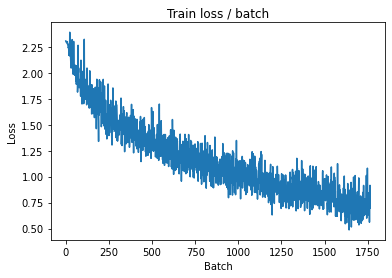


===============> Total time 12s	Avg loss 0.7267	Avg Prec@1 74.63 %	Avg Prec@5 98.49 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.9200 (0.9200)	Prec@1  69.5 ( 69.5)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9429	Avg Prec@1 68.94 %	Avg Prec@5 96.82 %



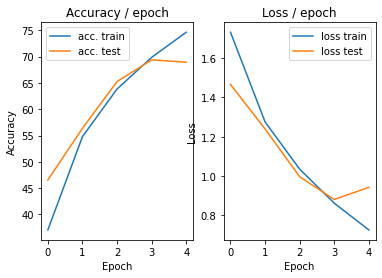

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.162s (0.162s)	Loss 0.5832 (0.5832)	Prec@1  79.7 ( 79.7)	Prec@5 100.0 (100.0)


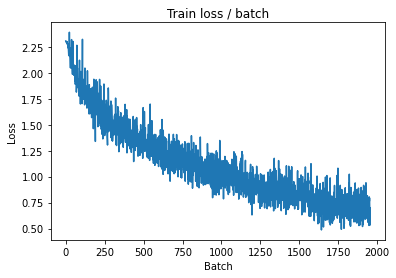

[TRAIN Batch 200/391]	Time 0.016s (0.031s)	Loss 0.5197 (0.5949)	Prec@1  83.6 ( 79.3)	Prec@5  99.2 ( 99.0)


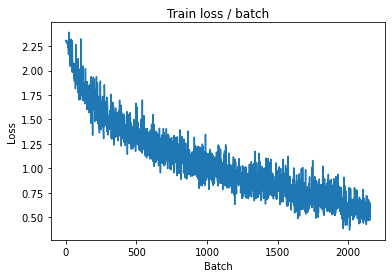


===============> Total time 12s	Avg loss 0.6034	Avg Prec@1 78.85 %	Avg Prec@5 98.94 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.7292 (0.7292)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8410	Avg Prec@1 71.88 %	Avg Prec@5 97.92 %



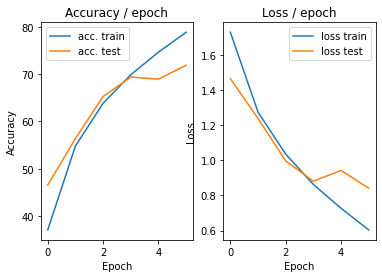

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.165s (0.165s)	Loss 0.4113 (0.4113)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


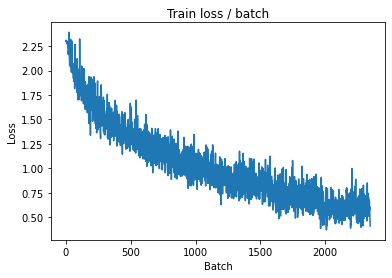

[TRAIN Batch 200/391]	Time 0.020s (0.031s)	Loss 0.3947 (0.4768)	Prec@1  85.9 ( 83.2)	Prec@5 100.0 ( 99.4)


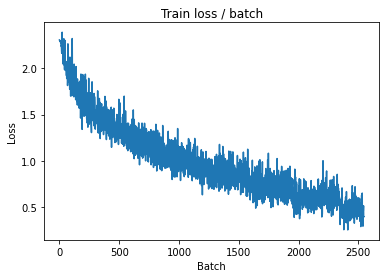


===============> Total time 12s	Avg loss 0.4966	Avg Prec@1 82.62 %	Avg Prec@5 99.38 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.7501 (0.7501)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8388	Avg Prec@1 72.35 %	Avg Prec@5 97.83 %



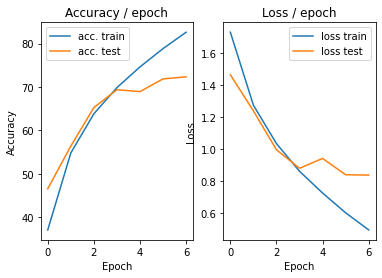

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.2915 (0.2915)	Prec@1  91.4 ( 91.4)	Prec@5 100.0 (100.0)


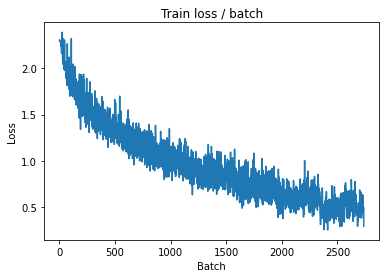

[TRAIN Batch 200/391]	Time 0.018s (0.030s)	Loss 0.5187 (0.3671)	Prec@1  83.6 ( 87.2)	Prec@5 100.0 ( 99.7)


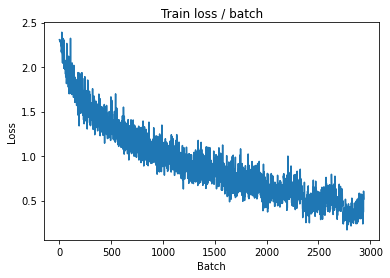


===============> Total time 11s	Avg loss 0.3848	Avg Prec@1 86.51 %	Avg Prec@5 99.68 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 0.9334 (0.9334)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9854	Avg Prec@1 70.44 %	Avg Prec@5 97.37 %



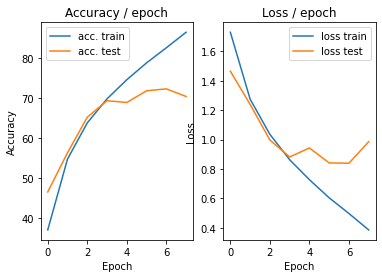

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 0.4050 (0.4050)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


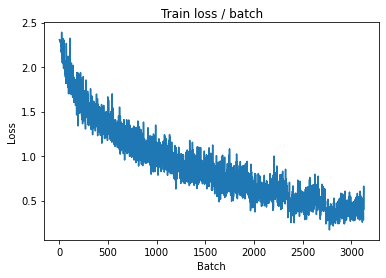

[TRAIN Batch 200/391]	Time 0.050s (0.032s)	Loss 0.2189 (0.2643)	Prec@1  89.8 ( 91.0)	Prec@5 100.0 ( 99.9)


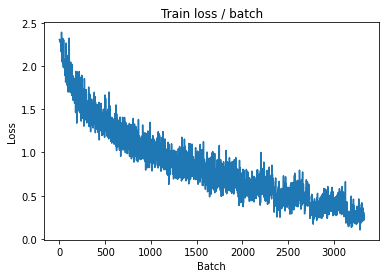


===============> Total time 11s	Avg loss 0.2866	Avg Prec@1 90.08 %	Avg Prec@5 99.85 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.9563 (0.9563)	Prec@1  74.2 ( 74.2)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9227	Avg Prec@1 73.51 %	Avg Prec@5 97.48 %



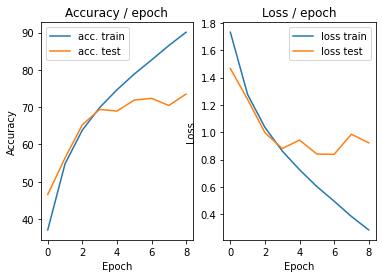

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.155s (0.155s)	Loss 0.2001 (0.2001)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


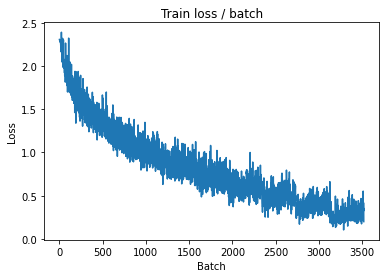

[TRAIN Batch 200/391]	Time 0.046s (0.031s)	Loss 0.1210 (0.1852)	Prec@1  96.9 ( 93.9)	Prec@5 100.0 (100.0)


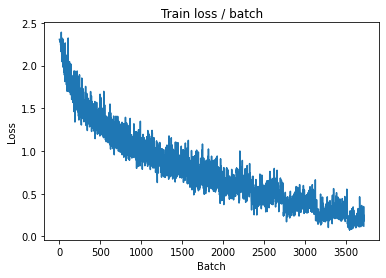


===============> Total time 11s	Avg loss 0.2011	Avg Prec@1 93.19 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 0.9924 (0.9924)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.2171	Avg Prec@1 70.85 %	Avg Prec@5 97.17 %



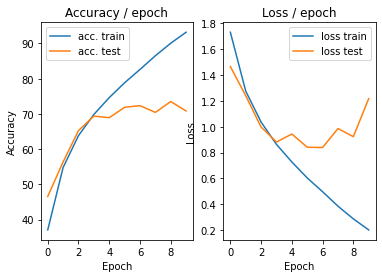

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.161s (0.161s)	Loss 0.2662 (0.2662)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


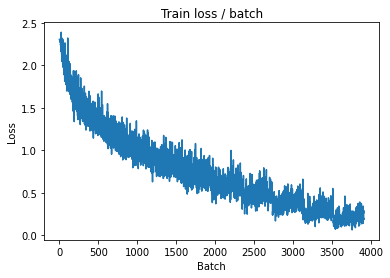

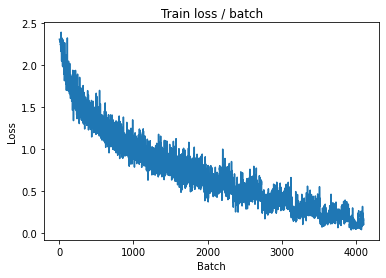


===============> Total time 11s	Avg loss 0.1394	Avg Prec@1 95.35 %	Avg Prec@5 99.98 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.1527 (1.1527)	Prec@1  75.0 ( 75.0)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.2165	Avg Prec@1 72.71 %	Avg Prec@5 97.43 %



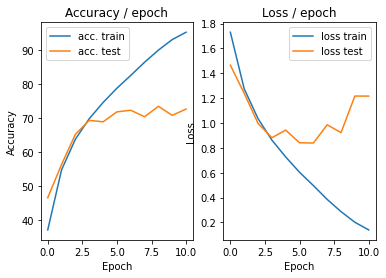

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.151s (0.151s)	Loss 0.2255 (0.2255)	Prec@1  92.2 ( 92.2)	Prec@5 100.0 (100.0)


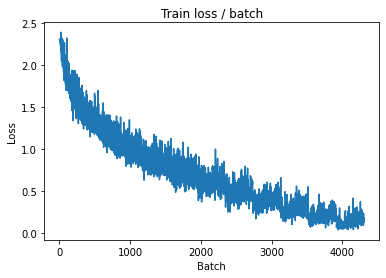

[TRAIN Batch 200/391]	Time 0.017s (0.030s)	Loss 0.1969 (0.0847)	Prec@1  93.8 ( 97.3)	Prec@5 100.0 (100.0)


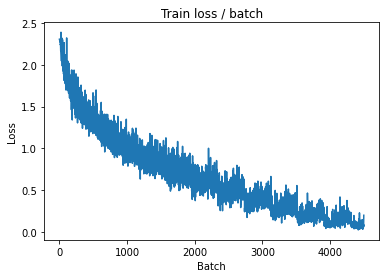


===============> Total time 11s	Avg loss 0.1012	Avg Prec@1 96.63 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 1.0990 (1.0990)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 1.3797	Avg Prec@1 71.70 %	Avg Prec@5 97.65 %



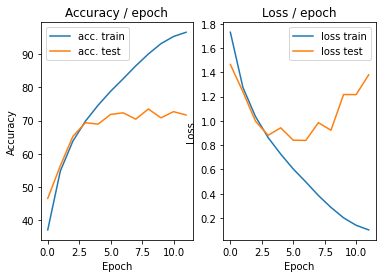

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.1077 (0.1077)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


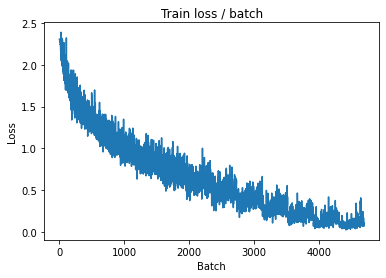

[TRAIN Batch 200/391]	Time 0.015s (0.030s)	Loss 0.1893 (0.0696)	Prec@1  93.0 ( 97.8)	Prec@5 100.0 (100.0)


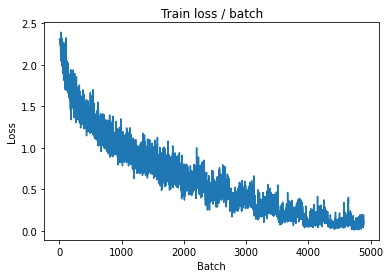


===============> Total time 11s	Avg loss 0.0903	Avg Prec@1 97.10 %	Avg Prec@5 99.99 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 1.1359 (1.1359)	Prec@1  79.7 ( 79.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.3511	Avg Prec@1 72.75 %	Avg Prec@5 97.58 %



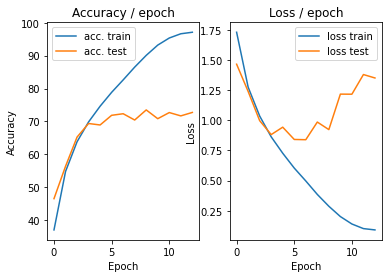

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.1138 (0.1138)	Prec@1  95.3 ( 95.3)	Prec@5 100.0 (100.0)


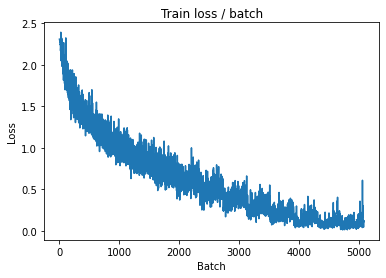

[TRAIN Batch 200/391]	Time 0.020s (0.030s)	Loss 0.0867 (0.0482)	Prec@1  96.1 ( 98.4)	Prec@5 100.0 (100.0)


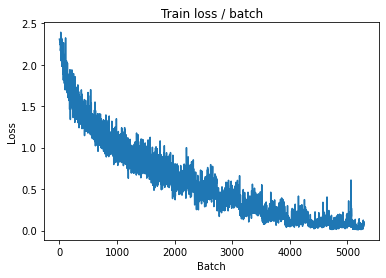


===============> Total time 11s	Avg loss 0.0687	Avg Prec@1 97.76 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 1.1886 (1.1886)	Prec@1  77.3 ( 77.3)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.3519	Avg Prec@1 74.20 %	Avg Prec@5 97.65 %



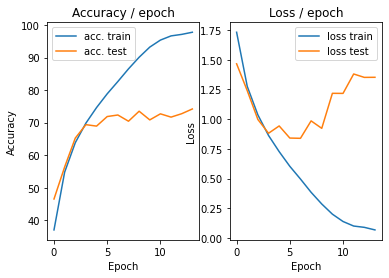

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 0.0391 (0.0391)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


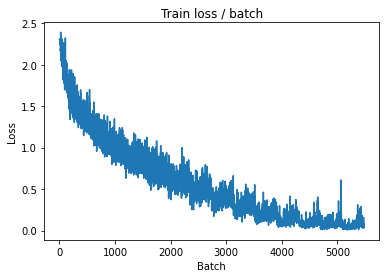

[TRAIN Batch 200/391]	Time 0.018s (0.030s)	Loss 0.0221 (0.0505)	Prec@1 100.0 ( 98.4)	Prec@5 100.0 (100.0)


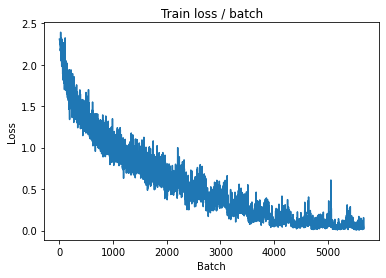


===============> Total time 11s	Avg loss 0.0625	Avg Prec@1 98.01 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 1.2070 (1.2070)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.4457	Avg Prec@1 73.61 %	Avg Prec@5 97.63 %



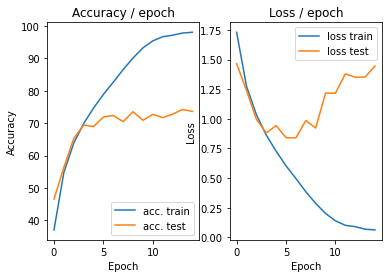

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.151s (0.151s)	Loss 0.0216 (0.0216)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


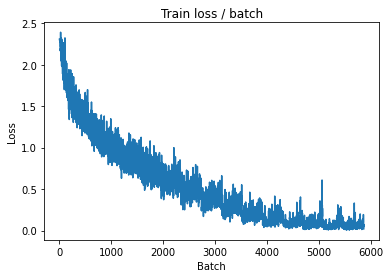

[TRAIN Batch 200/391]	Time 0.016s (0.030s)	Loss 0.0093 (0.0259)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


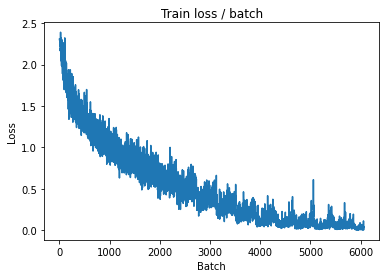


===============> Total time 11s	Avg loss 0.1010	Avg Prec@1 97.25 %	Avg Prec@5 99.87 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 1.2810 (1.2810)	Prec@1  73.4 ( 73.4)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.5396	Avg Prec@1 72.62 %	Avg Prec@5 97.03 %



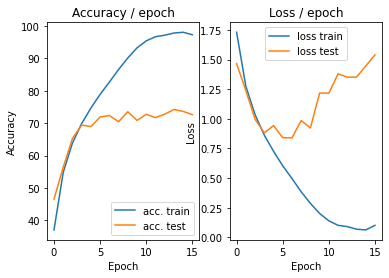

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.148s (0.148s)	Loss 0.2013 (0.2013)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


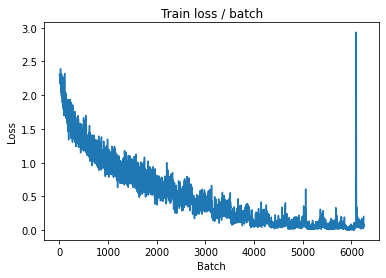

[TRAIN Batch 200/391]	Time 0.015s (0.030s)	Loss 0.0203 (0.0299)	Prec@1  99.2 ( 99.1)	Prec@5 100.0 (100.0)


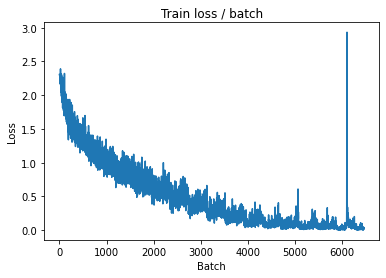


===============> Total time 11s	Avg loss 0.0431	Avg Prec@1 98.64 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.4000 (1.4000)	Prec@1  75.0 ( 75.0)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.4510	Avg Prec@1 73.57 %	Avg Prec@5 97.56 %



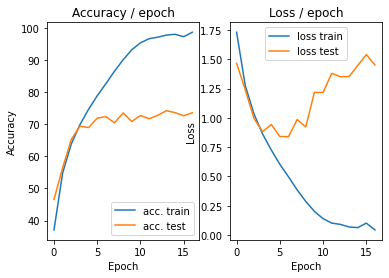

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 0.0358 (0.0358)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)


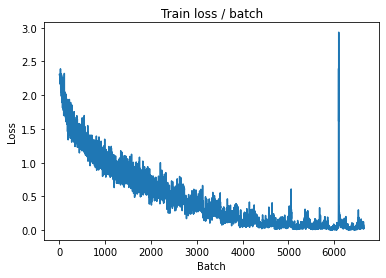

[TRAIN Batch 200/391]	Time 0.015s (0.030s)	Loss 0.0223 (0.0252)	Prec@1  99.2 ( 99.3)	Prec@5 100.0 (100.0)


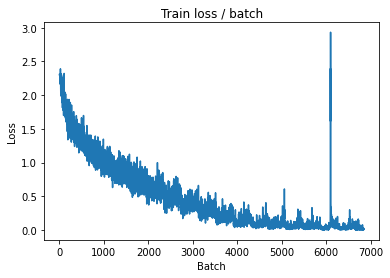


===============> Total time 11s	Avg loss 0.0245	Avg Prec@1 99.27 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.2205 (1.2205)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.7092	Avg Prec@1 74.16 %	Avg Prec@5 97.48 %



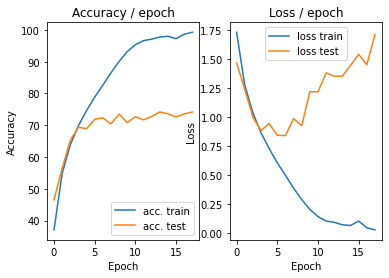

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.154s (0.154s)	Loss 0.0358 (0.0358)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


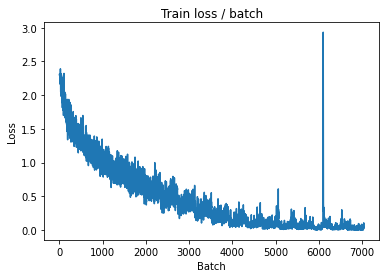

[TRAIN Batch 200/391]	Time 0.014s (0.030s)	Loss 0.0105 (0.0278)	Prec@1 100.0 ( 99.2)	Prec@5 100.0 (100.0)


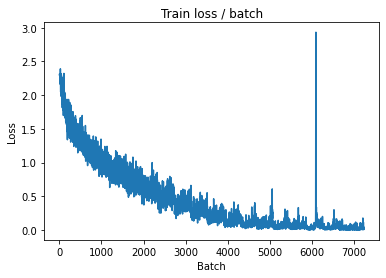


===============> Total time 11s	Avg loss 0.0299	Avg Prec@1 99.04 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.4047 (1.4047)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.6580	Avg Prec@1 74.32 %	Avg Prec@5 97.68 %



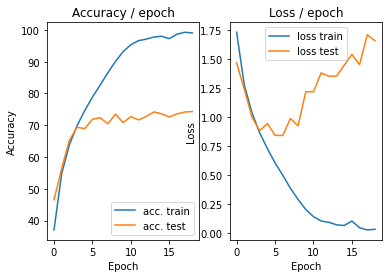

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 0.0056 (0.0056)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


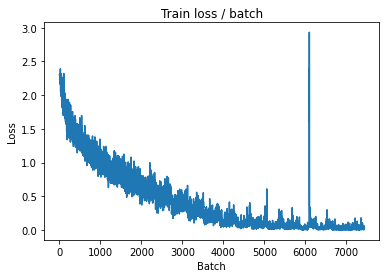

[TRAIN Batch 200/391]	Time 0.036s (0.031s)	Loss 0.0170 (0.0171)	Prec@1  99.2 ( 99.5)	Prec@5 100.0 (100.0)


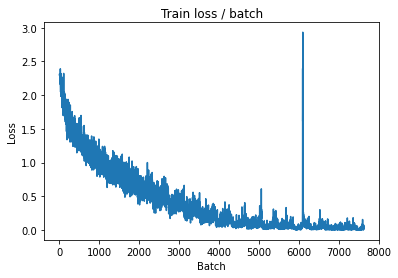


===============> Total time 11s	Avg loss 0.0201	Avg Prec@1 99.39 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 1.3791 (1.3791)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.9571	Avg Prec@1 73.26 %	Avg Prec@5 97.49 %



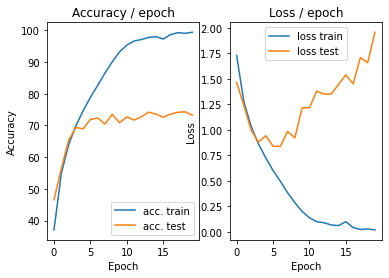

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.146s (0.146s)	Loss 0.0454 (0.0454)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


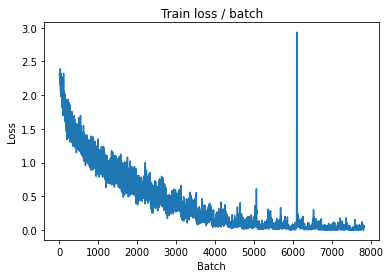

[TRAIN Batch 200/391]	Time 0.034s (0.030s)	Loss 0.0058 (0.0421)	Prec@1 100.0 ( 98.7)	Prec@5 100.0 (100.0)


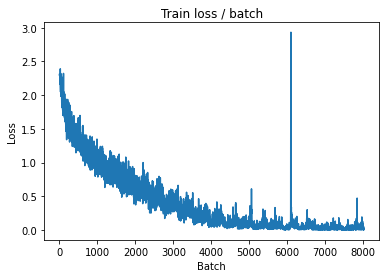


===============> Total time 11s	Avg loss 0.0335	Avg Prec@1 98.97 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 1.8223 (1.8223)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.7397	Avg Prec@1 74.33 %	Avg Prec@5 97.54 %



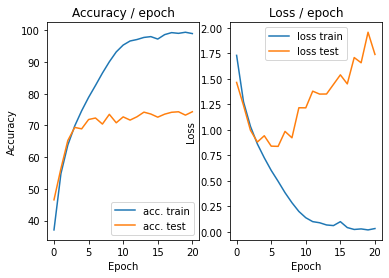

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.157s (0.157s)	Loss 0.0217 (0.0217)	Prec@1  98.4 ( 98.4)	Prec@5 100.0 (100.0)


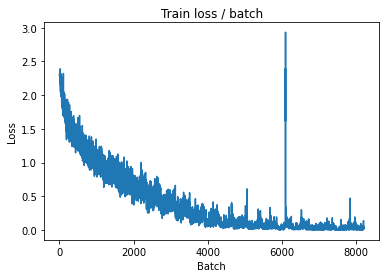

[TRAIN Batch 200/391]	Time 0.017s (0.030s)	Loss 0.0026 (0.0077)	Prec@1 100.0 ( 99.8)	Prec@5 100.0 (100.0)


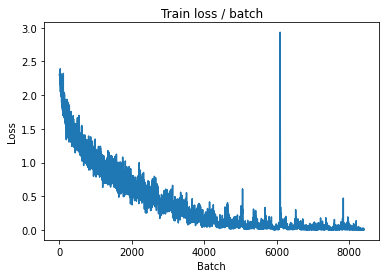


===============> Total time 11s	Avg loss 0.0080	Avg Prec@1 99.79 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.5727 (1.5727)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.8051	Avg Prec@1 74.77 %	Avg Prec@5 97.76 %



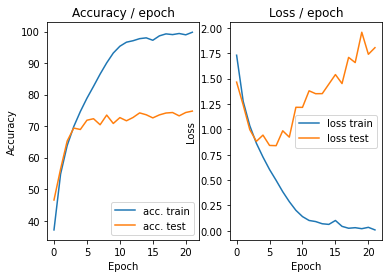

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.163s (0.163s)	Loss 0.0190 (0.0190)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


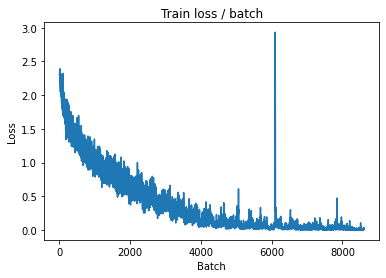

[TRAIN Batch 200/391]	Time 0.047s (0.030s)	Loss 0.0029 (0.0046)	Prec@1 100.0 ( 99.9)	Prec@5 100.0 (100.0)


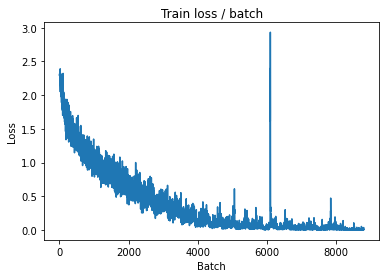


===============> Total time 11s	Avg loss 0.0081	Avg Prec@1 99.77 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.7962 (1.7962)	Prec@1  75.8 ( 75.8)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.8576	Avg Prec@1 75.28 %	Avg Prec@5 97.66 %



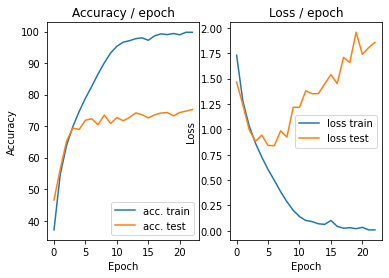

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.142s (0.142s)	Loss 0.0013 (0.0013)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


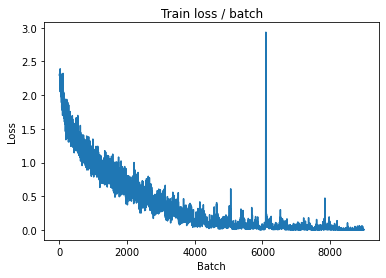

[TRAIN Batch 200/391]	Time 0.013s (0.029s)	Loss 0.0064 (0.0096)	Prec@1 100.0 ( 99.7)	Prec@5 100.0 (100.0)


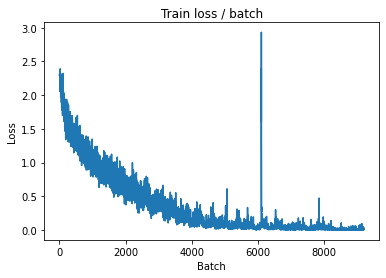


===============> Total time 11s	Avg loss 0.0145	Avg Prec@1 99.57 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.8062 (1.8062)	Prec@1  77.3 ( 77.3)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.8341	Avg Prec@1 75.03 %	Avg Prec@5 97.59 %



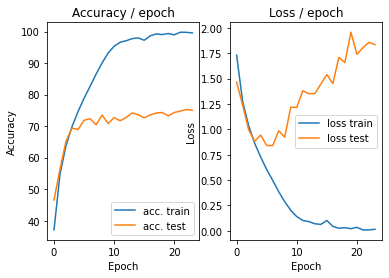

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.148s (0.148s)	Loss 0.0050 (0.0050)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)


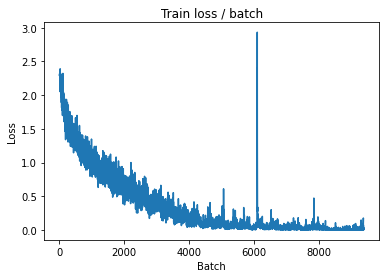

[TRAIN Batch 200/391]	Time 0.015s (0.029s)	Loss 0.0759 (0.0443)	Prec@1  98.4 ( 98.5)	Prec@5 100.0 (100.0)


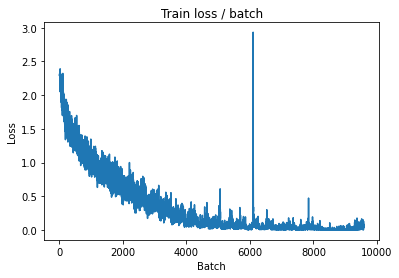


===============> Total time 11s	Avg loss 0.0461	Avg Prec@1 98.48 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 2.1987 (2.1987)	Prec@1  71.9 ( 71.9)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.8507	Avg Prec@1 73.91 %	Avg Prec@5 97.49 %



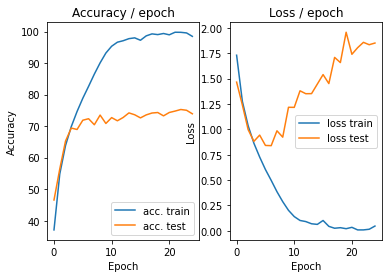

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.153s (0.153s)	Loss 0.0121 (0.0121)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


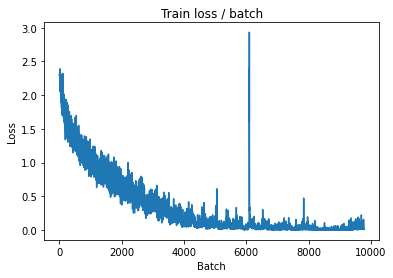

[TRAIN Batch 200/391]	Time 0.036s (0.029s)	Loss 0.0321 (0.0237)	Prec@1  98.4 ( 99.3)	Prec@5 100.0 (100.0)


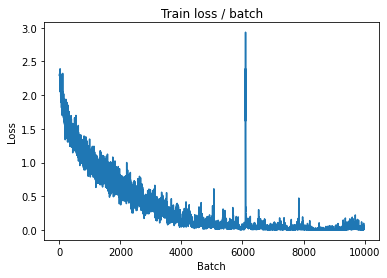


===============> Total time 11s	Avg loss 0.0304	Avg Prec@1 99.07 %	Avg Prec@5 100.00 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 1.7830 (1.7830)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.8269	Avg Prec@1 73.69 %	Avg Prec@5 97.26 %



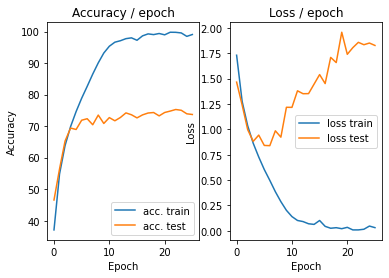

In [ ]:
mainnormal(128, 0.1, cuda=True)

#Data Augmentation

In [ ]:
class  AlexNetData(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetData, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0,ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def maindata(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetData()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 2.3089 (2.3089)	Prec@1   7.8 (  7.8)	Prec@5  43.8 ( 43.8)


<Figure size 432x288 with 0 Axes>

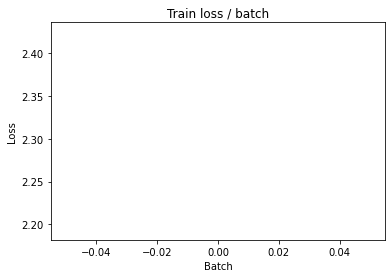

[TRAIN Batch 200/391]	Time 0.018s (0.041s)	Loss 2.1004 (1.9726)	Prec@1  28.9 ( 27.3)	Prec@5  79.7 ( 78.4)


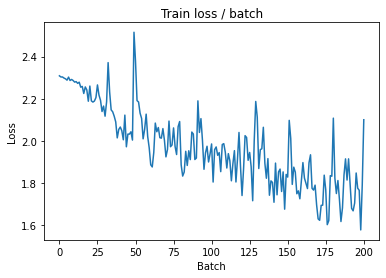


===============> Total time 16s	Avg loss 1.8105	Avg Prec@1 33.74 %	Avg Prec@5 83.64 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.5482 (1.5482)	Prec@1  50.0 ( 50.0)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.5759	Avg Prec@1 43.51 %	Avg Prec@5 89.95 %



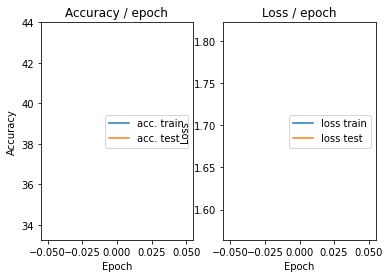

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 1.6031 (1.6031)	Prec@1  41.4 ( 41.4)	Prec@5  89.1 ( 89.1)


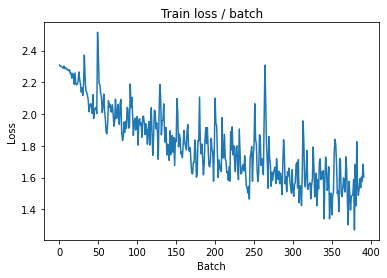

[TRAIN Batch 200/391]	Time 0.022s (0.041s)	Loss 1.4807 (1.4501)	Prec@1  51.6 ( 48.0)	Prec@5  94.5 ( 92.2)


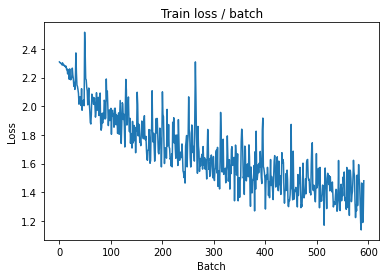


===============> Total time 16s	Avg loss 1.3962	Avg Prec@1 50.12 %	Avg Prec@5 92.91 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 1.1391 (1.1391)	Prec@1  59.4 ( 59.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.1936	Avg Prec@1 57.02 %	Avg Prec@5 95.41 %



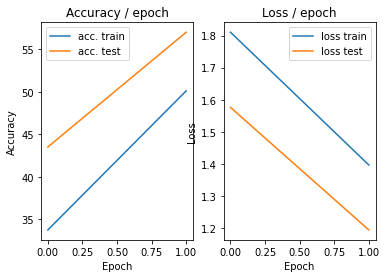

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.2089 (1.2089)	Prec@1  62.5 ( 62.5)	Prec@5  93.0 ( 93.0)


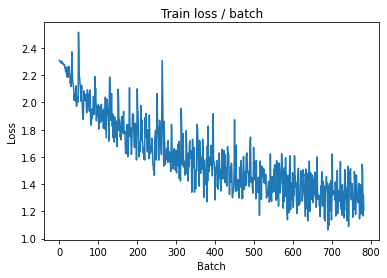

[TRAIN Batch 200/391]	Time 0.054s (0.041s)	Loss 1.1692 (1.2201)	Prec@1  55.5 ( 56.6)	Prec@5  96.9 ( 95.1)


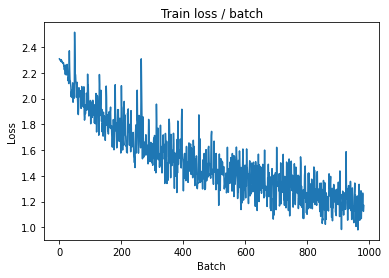


===============> Total time 16s	Avg loss 1.1876	Avg Prec@1 58.23 %	Avg Prec@5 95.25 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.2080 (1.2080)	Prec@1  56.2 ( 56.2)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.2791	Avg Prec@1 54.99 %	Avg Prec@5 94.83 %



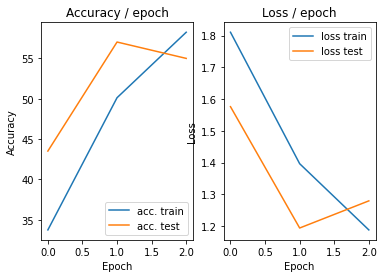

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 1.2983 (1.2983)	Prec@1  51.6 ( 51.6)	Prec@5  96.1 ( 96.1)


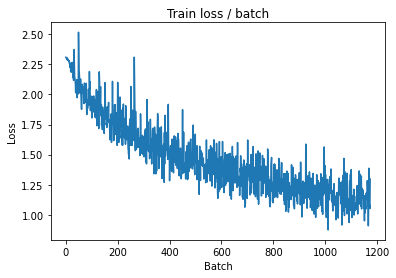

[TRAIN Batch 200/391]	Time 0.054s (0.041s)	Loss 1.1107 (1.0671)	Prec@1  59.4 ( 62.6)	Prec@5  96.9 ( 96.3)


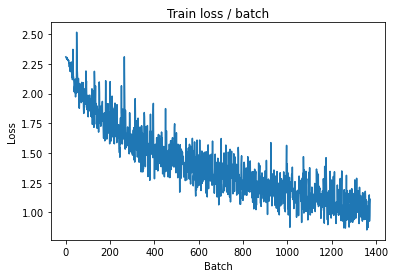


===============> Total time 16s	Avg loss 1.0380	Avg Prec@1 63.51 %	Avg Prec@5 96.43 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.9655 (0.9655)	Prec@1  61.7 ( 61.7)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9610	Avg Prec@1 66.79 %	Avg Prec@5 97.12 %



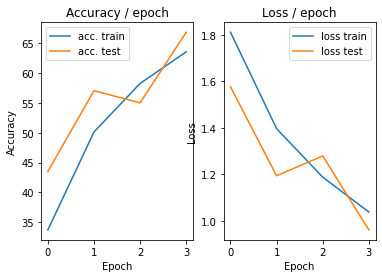

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.9410 (0.9410)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)


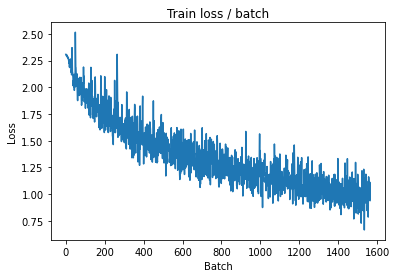

[TRAIN Batch 200/391]	Time 0.053s (0.042s)	Loss 0.9966 (0.9367)	Prec@1  69.5 ( 67.5)	Prec@5  98.4 ( 97.1)


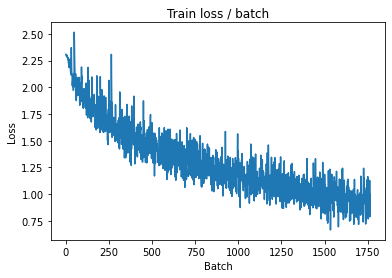


===============> Total time 16s	Avg loss 0.9234	Avg Prec@1 67.92 %	Avg Prec@5 97.13 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.8504 (0.8504)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8720	Avg Prec@1 69.44 %	Avg Prec@5 97.41 %



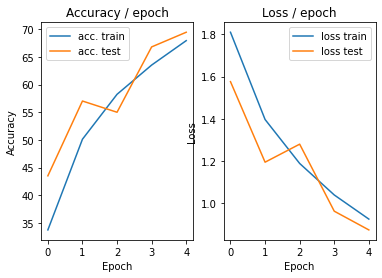

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 0.8313 (0.8313)	Prec@1  69.5 ( 69.5)	Prec@5  99.2 ( 99.2)


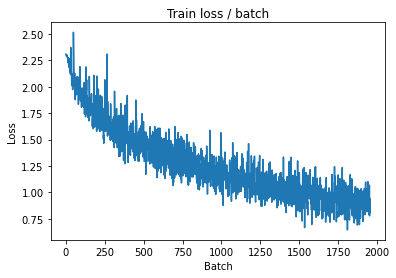

[TRAIN Batch 200/391]	Time 0.014s (0.042s)	Loss 0.9004 (0.8447)	Prec@1  68.0 ( 70.5)	Prec@5  97.7 ( 97.6)


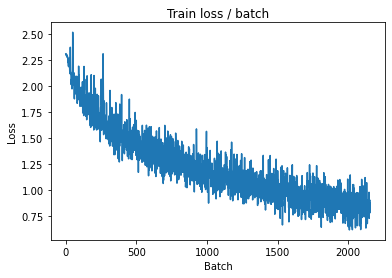


===============> Total time 16s	Avg loss 0.8377	Avg Prec@1 70.75 %	Avg Prec@5 97.69 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.0377 (1.0377)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.0343	Avg Prec@1 64.64 %	Avg Prec@5 96.87 %



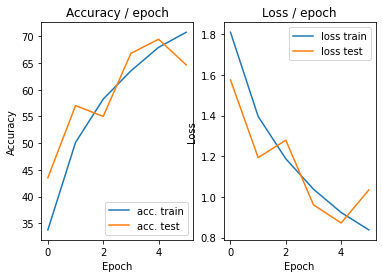

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.8614 (0.8614)	Prec@1  66.4 ( 66.4)	Prec@5  99.2 ( 99.2)


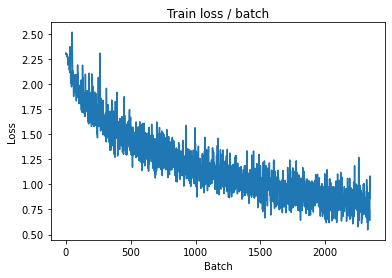

[TRAIN Batch 200/391]	Time 0.070s (0.042s)	Loss 0.6815 (0.7757)	Prec@1  71.1 ( 73.0)	Prec@5 100.0 ( 98.1)


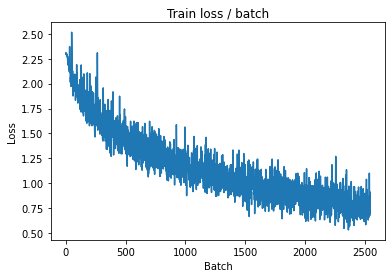


===============> Total time 16s	Avg loss 0.7690	Avg Prec@1 73.22 %	Avg Prec@5 98.09 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.7946 (0.7946)	Prec@1  73.4 ( 73.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.8070	Avg Prec@1 72.00 %	Avg Prec@5 98.15 %



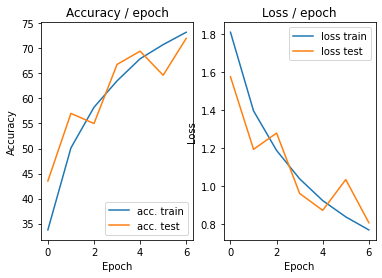

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.8188 (0.8188)	Prec@1  71.9 ( 71.9)	Prec@5  98.4 ( 98.4)


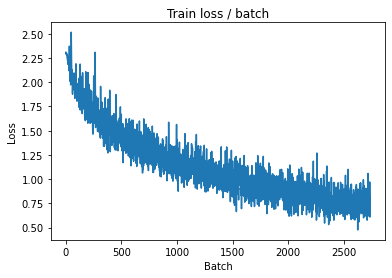

[TRAIN Batch 200/391]	Time 0.064s (0.041s)	Loss 0.9075 (0.7201)	Prec@1  71.9 ( 75.0)	Prec@5  96.9 ( 98.5)


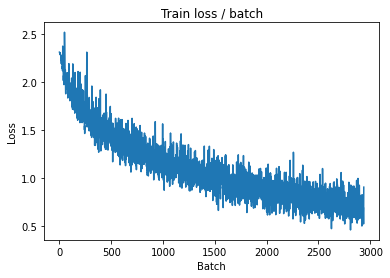


===============> Total time 15s	Avg loss 0.7239	Avg Prec@1 74.94 %	Avg Prec@5 98.37 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.8730 (0.8730)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8119	Avg Prec@1 72.61 %	Avg Prec@5 97.66 %



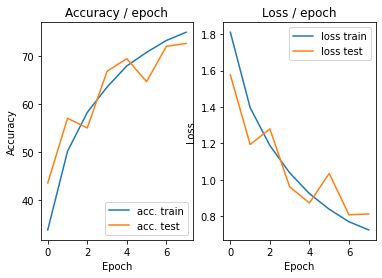

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.7800 (0.7800)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)


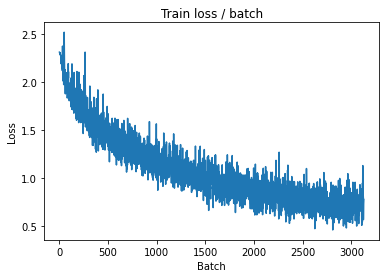

[TRAIN Batch 200/391]	Time 0.071s (0.041s)	Loss 0.6275 (0.6709)	Prec@1  78.1 ( 76.5)	Prec@5  97.7 ( 98.6)


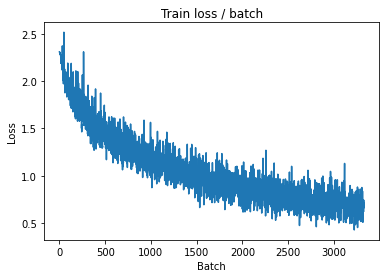


===============> Total time 15s	Avg loss 0.6684	Avg Prec@1 76.56 %	Avg Prec@5 98.56 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.6883 (0.6883)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7602	Avg Prec@1 74.07 %	Avg Prec@5 98.21 %



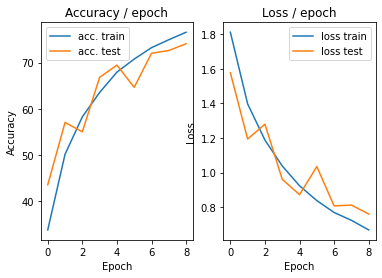

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.8100 (0.8100)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)


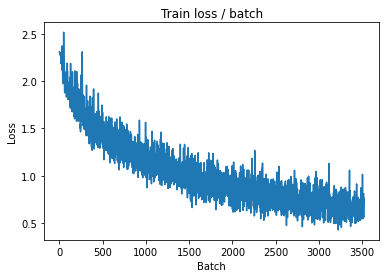

[TRAIN Batch 200/391]	Time 0.014s (0.042s)	Loss 0.5250 (0.6239)	Prec@1  81.2 ( 78.0)	Prec@5  99.2 ( 98.8)


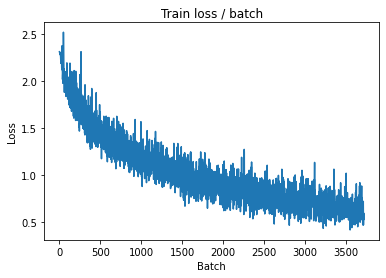


===============> Total time 15s	Avg loss 0.6264	Avg Prec@1 78.08 %	Avg Prec@5 98.78 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.6063 (0.6063)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6868	Avg Prec@1 76.34 %	Avg Prec@5 98.55 %



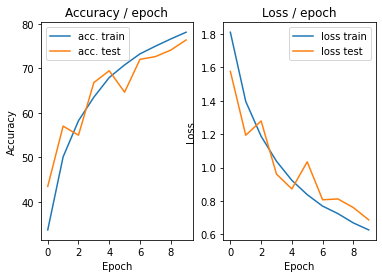

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.5308 (0.5308)	Prec@1  79.7 ( 79.7)	Prec@5 100.0 (100.0)


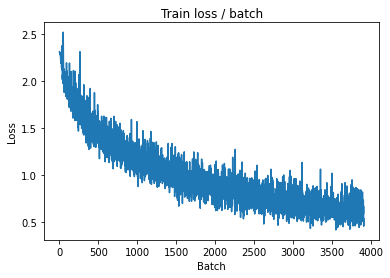

[TRAIN Batch 200/391]	Time 0.072s (0.042s)	Loss 0.5115 (0.5961)	Prec@1  78.1 ( 79.1)	Prec@5  99.2 ( 98.8)


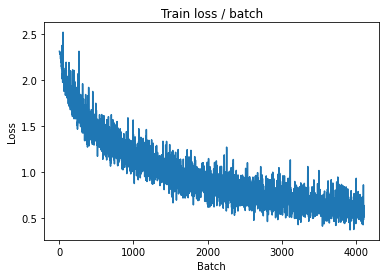


===============> Total time 16s	Avg loss 0.5983	Avg Prec@1 79.17 %	Avg Prec@5 98.84 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.8380 (0.8380)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7748	Avg Prec@1 73.74 %	Avg Prec@5 98.32 %



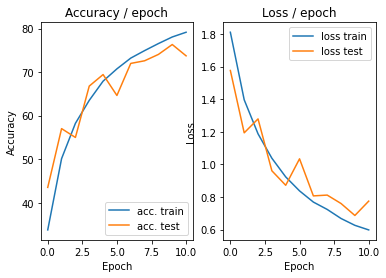

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 0.6736 (0.6736)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


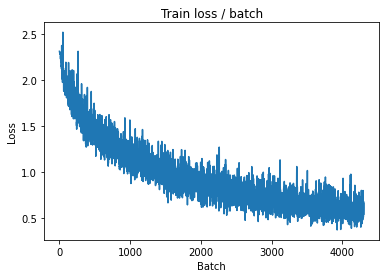

[TRAIN Batch 200/391]	Time 0.016s (0.042s)	Loss 0.4277 (0.5553)	Prec@1  83.6 ( 80.7)	Prec@5 100.0 ( 99.1)


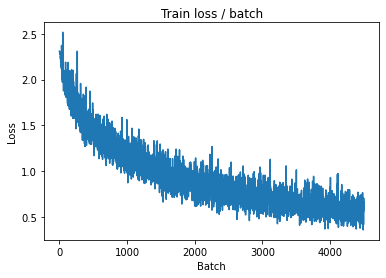


===============> Total time 16s	Avg loss 0.5607	Avg Prec@1 80.52 %	Avg Prec@5 99.08 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.5895 (0.5895)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6765	Avg Prec@1 77.45 %	Avg Prec@5 98.58 %



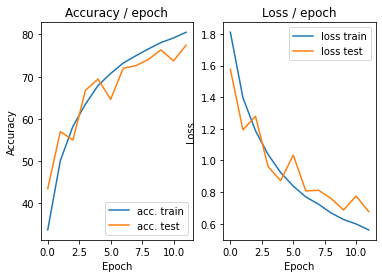

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.4424 (0.4424)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)


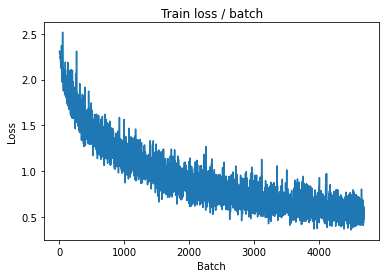

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 0.3706 (0.5221)	Prec@1  86.7 ( 81.9)	Prec@5 100.0 ( 99.2)


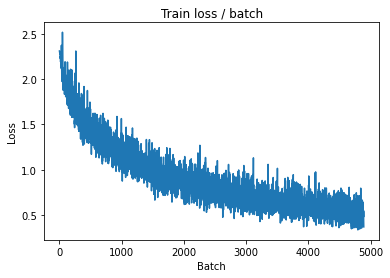


===============> Total time 15s	Avg loss 0.5336	Avg Prec@1 81.43 %	Avg Prec@5 99.15 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.6214 (0.6214)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6341	Avg Prec@1 78.74 %	Avg Prec@5 98.56 %



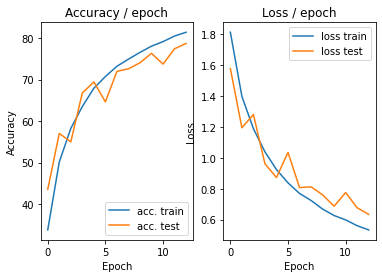

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.5307 (0.5307)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)


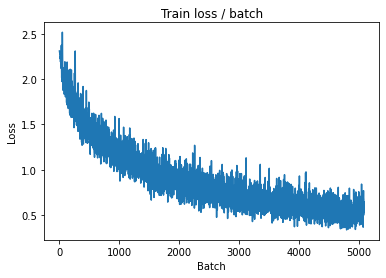

[TRAIN Batch 200/391]	Time 0.064s (0.041s)	Loss 0.4850 (0.5083)	Prec@1  82.0 ( 82.1)	Prec@5  99.2 ( 99.3)


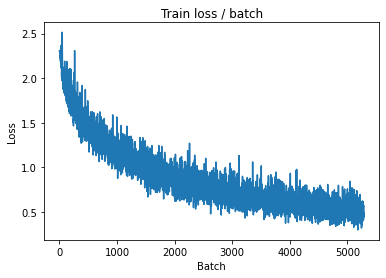


===============> Total time 15s	Avg loss 0.5062	Avg Prec@1 82.19 %	Avg Prec@5 99.29 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.6355 (0.6355)	Prec@1  79.7 ( 79.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6457	Avg Prec@1 78.31 %	Avg Prec@5 98.51 %



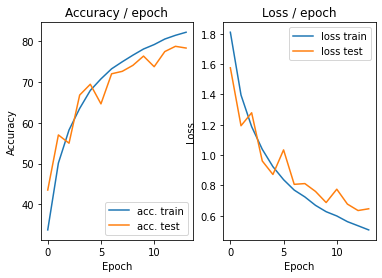

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.175s (0.175s)	Loss 0.5335 (0.5335)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)


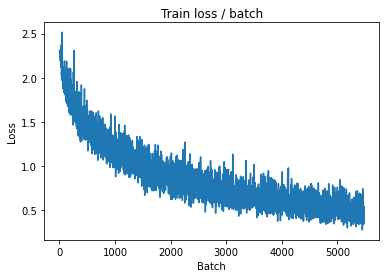

[TRAIN Batch 200/391]	Time 0.009s (0.041s)	Loss 0.7294 (0.4659)	Prec@1  79.7 ( 83.8)	Prec@5  98.4 ( 99.3)


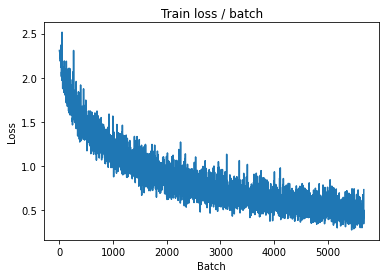


===============> Total time 15s	Avg loss 0.4756	Avg Prec@1 83.38 %	Avg Prec@5 99.33 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.6282 (0.6282)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6576	Avg Prec@1 78.29 %	Avg Prec@5 98.76 %



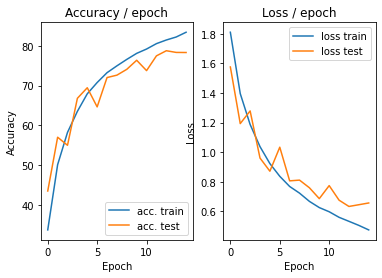

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 0.5899 (0.5899)	Prec@1  76.6 ( 76.6)	Prec@5 100.0 (100.0)


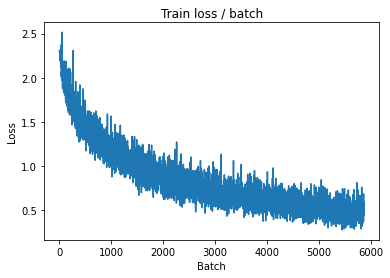

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 0.4305 (0.4494)	Prec@1  83.6 ( 84.3)	Prec@5 100.0 ( 99.5)


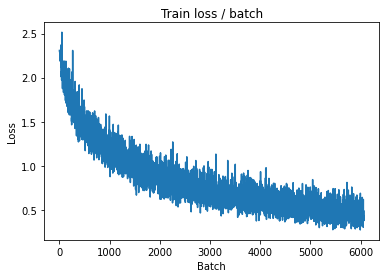


===============> Total time 15s	Avg loss 0.4515	Avg Prec@1 84.19 %	Avg Prec@5 99.45 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 0.7175 (0.7175)	Prec@1  84.4 ( 84.4)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6528	Avg Prec@1 79.47 %	Avg Prec@5 98.65 %



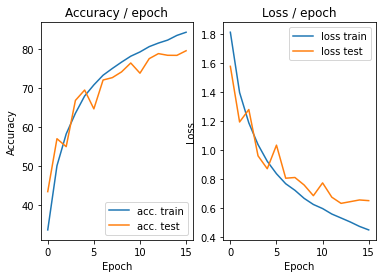

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.3950 (0.3950)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


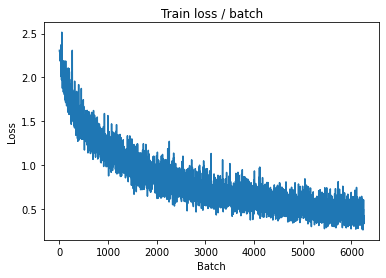

[TRAIN Batch 200/391]	Time 0.055s (0.041s)	Loss 0.3857 (0.4250)	Prec@1  89.8 ( 85.2)	Prec@5  99.2 ( 99.5)


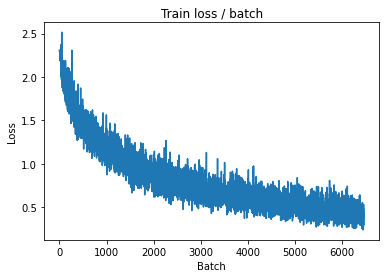


===============> Total time 16s	Avg loss 0.4328	Avg Prec@1 84.76 %	Avg Prec@5 99.49 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.7599 (0.7599)	Prec@1  76.6 ( 76.6)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6880	Avg Prec@1 78.55 %	Avg Prec@5 98.67 %



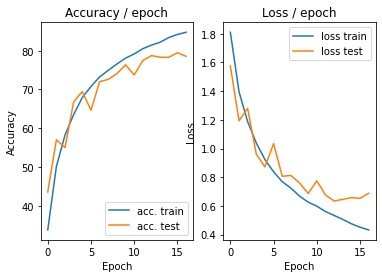

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.179s (0.179s)	Loss 0.4496 (0.4496)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


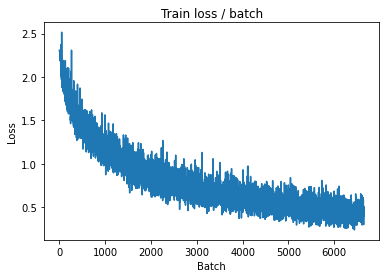

[TRAIN Batch 200/391]	Time 0.058s (0.041s)	Loss 0.5297 (0.4086)	Prec@1  83.6 ( 85.7)	Prec@5  98.4 ( 99.6)


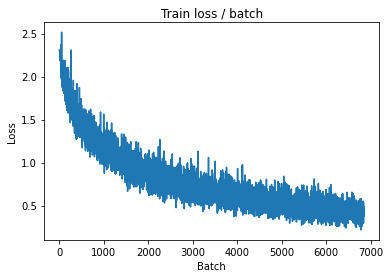


===============> Total time 15s	Avg loss 0.4181	Avg Prec@1 85.35 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.7709 (0.7709)	Prec@1  78.1 ( 78.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7056	Avg Prec@1 77.59 %	Avg Prec@5 98.54 %



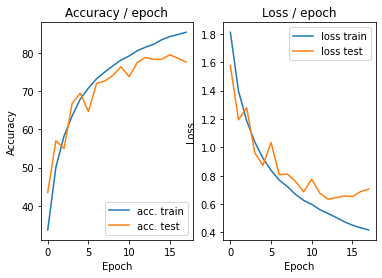

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.5582 (0.5582)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


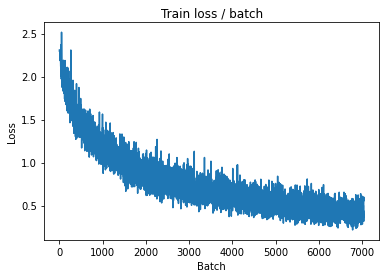

[TRAIN Batch 200/391]	Time 0.029s (0.041s)	Loss 0.4552 (0.3894)	Prec@1  85.9 ( 86.3)	Prec@5  98.4 ( 99.5)


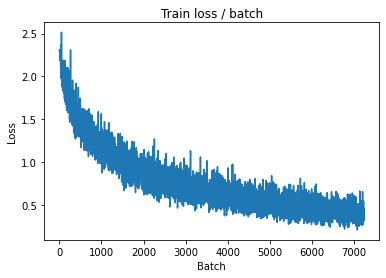


===============> Total time 15s	Avg loss 0.3950	Avg Prec@1 86.18 %	Avg Prec@5 99.57 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.6495 (0.6495)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6528	Avg Prec@1 78.70 %	Avg Prec@5 98.72 %



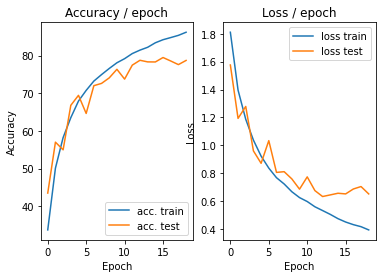

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.3329 (0.3329)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


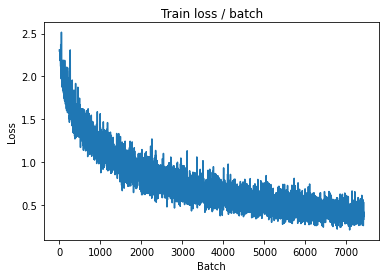

[TRAIN Batch 200/391]	Time 0.053s (0.041s)	Loss 0.4258 (0.3697)	Prec@1  85.9 ( 87.2)	Prec@5  99.2 ( 99.6)


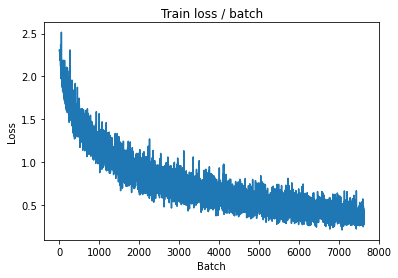


===============> Total time 15s	Avg loss 0.3762	Avg Prec@1 86.89 %	Avg Prec@5 99.59 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.5583 (0.5583)	Prec@1  85.9 ( 85.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6272	Avg Prec@1 80.37 %	Avg Prec@5 98.63 %



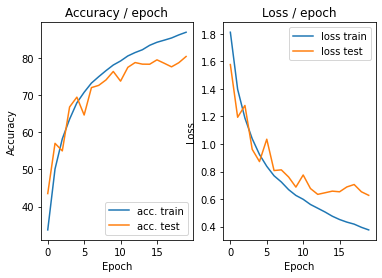

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.4234 (0.4234)	Prec@1  89.8 ( 89.8)	Prec@5  98.4 ( 98.4)


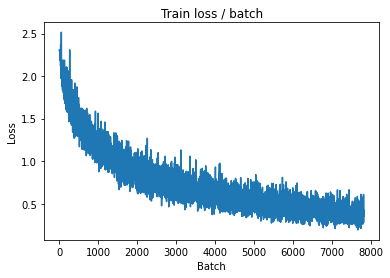

[TRAIN Batch 200/391]	Time 0.051s (0.041s)	Loss 0.3266 (0.3498)	Prec@1  88.3 ( 87.9)	Prec@5  99.2 ( 99.7)


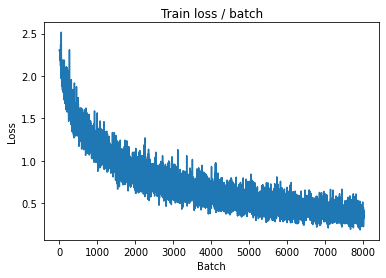


===============> Total time 16s	Avg loss 0.3616	Avg Prec@1 87.45 %	Avg Prec@5 99.63 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.6966 (0.6966)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6151	Avg Prec@1 80.63 %	Avg Prec@5 98.85 %



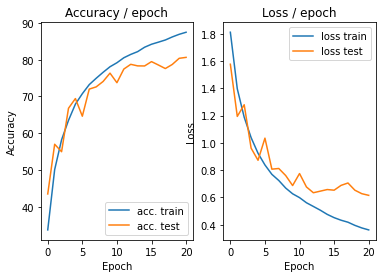

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.3314 (0.3314)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


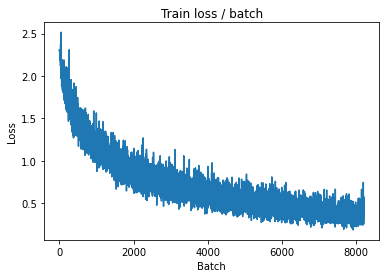

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 0.2477 (0.3344)	Prec@1  92.2 ( 88.3)	Prec@5  99.2 ( 99.7)


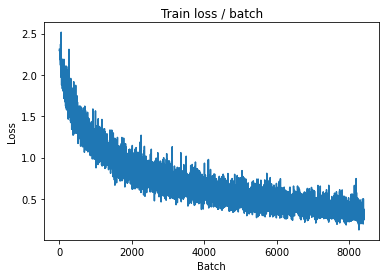


===============> Total time 15s	Avg loss 0.3437	Avg Prec@1 88.02 %	Avg Prec@5 99.69 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 0.5906 (0.5906)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6552	Avg Prec@1 79.78 %	Avg Prec@5 98.75 %



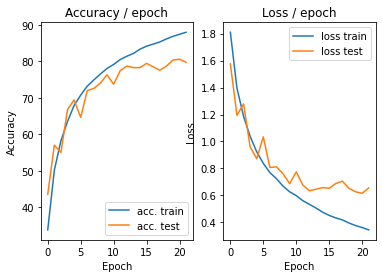

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 0.4663 (0.4663)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


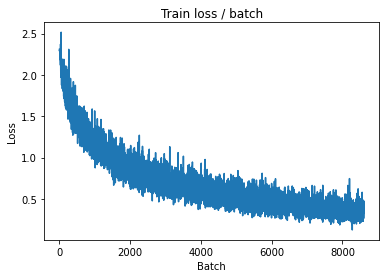

[TRAIN Batch 200/391]	Time 0.068s (0.041s)	Loss 0.2437 (0.3257)	Prec@1  90.6 ( 88.5)	Prec@5 100.0 ( 99.7)


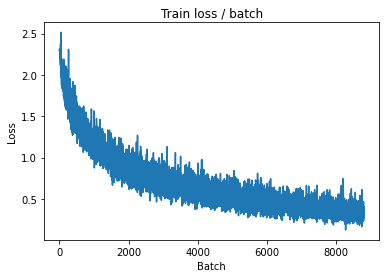


===============> Total time 15s	Avg loss 0.3319	Avg Prec@1 88.34 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.5775 (0.5775)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6560	Avg Prec@1 80.68 %	Avg Prec@5 98.56 %



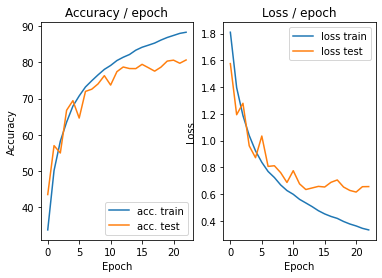

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.3723 (0.3723)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


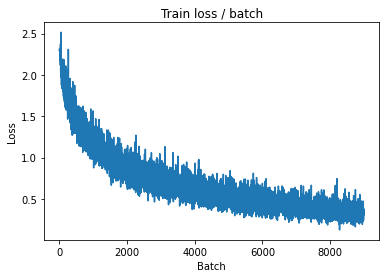

[TRAIN Batch 200/391]	Time 0.011s (0.041s)	Loss 0.2666 (0.3131)	Prec@1  90.6 ( 89.1)	Prec@5  99.2 ( 99.7)


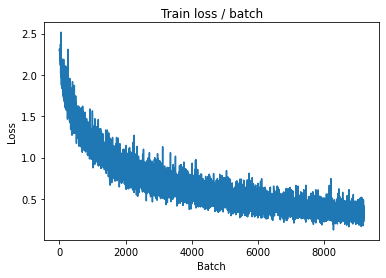


===============> Total time 15s	Avg loss 0.3222	Avg Prec@1 88.74 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.5782 (0.5782)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.6614	Avg Prec@1 79.96 %	Avg Prec@5 98.69 %



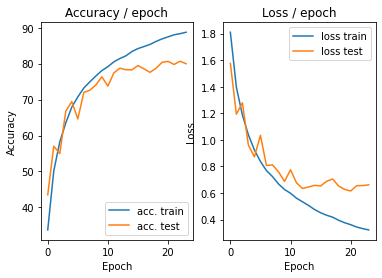

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.3039 (0.3039)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


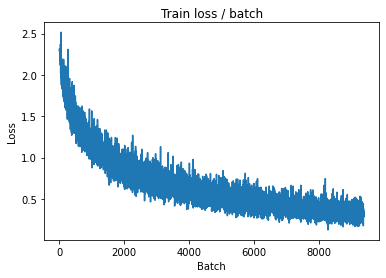

[TRAIN Batch 200/391]	Time 0.066s (0.041s)	Loss 0.2997 (0.3012)	Prec@1  90.6 ( 89.5)	Prec@5 100.0 ( 99.8)


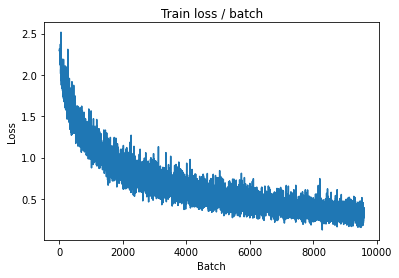


===============> Total time 15s	Avg loss 0.3066	Avg Prec@1 89.27 %	Avg Prec@5 99.75 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.6242 (0.6242)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6627	Avg Prec@1 80.10 %	Avg Prec@5 98.68 %



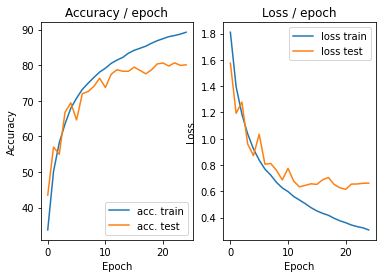

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.3251 (0.3251)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)


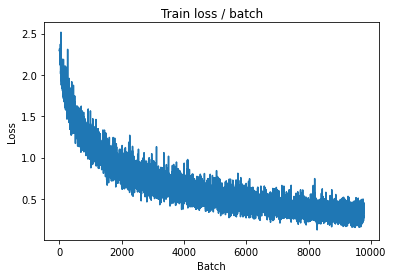

[TRAIN Batch 200/391]	Time 0.014s (0.040s)	Loss 0.2661 (0.2828)	Prec@1  90.6 ( 90.0)	Prec@5 100.0 ( 99.8)


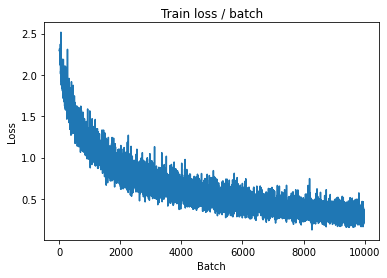


===============> Total time 15s	Avg loss 0.2942	Avg Prec@1 89.74 %	Avg Prec@5 99.81 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.4917 (0.4917)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6993	Avg Prec@1 79.64 %	Avg Prec@5 98.31 %



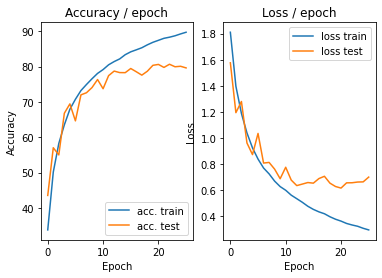

In [ ]:
maindata(128, 0.1, cuda=True)

#Variantes sur l’algorithme d’optimisation

In [ ]:
class  AlexNetData(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetData, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0,ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def mainLR(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetData()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(),lr,momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)


    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        lr_sched.step()
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 2.3044 (2.3044)	Prec@1   5.5 (  5.5)	Prec@5  50.0 ( 50.0)


<Figure size 432x288 with 0 Axes>

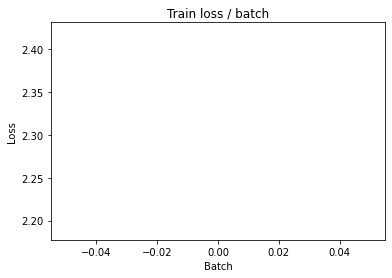

[TRAIN Batch 200/391]	Time 0.017s (0.041s)	Loss 1.7493 (1.8354)	Prec@1  33.6 ( 32.6)	Prec@5  89.1 ( 83.7)


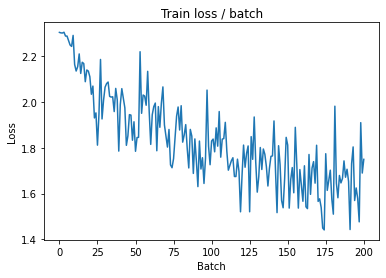


===============> Total time 15s	Avg loss 1.7290	Avg Prec@1 36.56 %	Avg Prec@5 86.74 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.6480 (1.6480)	Prec@1  33.6 ( 33.6)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.5927	Avg Prec@1 41.19 %	Avg Prec@5 90.25 %



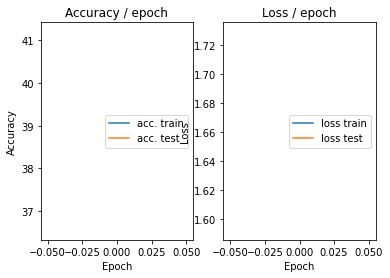

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.7115 (1.7115)	Prec@1  36.7 ( 36.7)	Prec@5  89.8 ( 89.8)


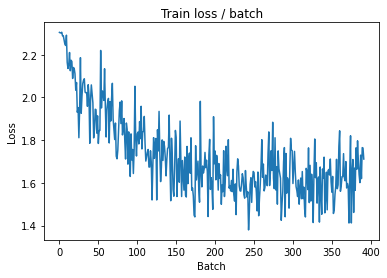

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 1.5675 (1.5414)	Prec@1  47.7 ( 44.4)	Prec@5  93.8 ( 91.0)


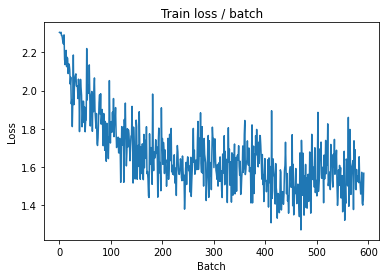


===============> Total time 15s	Avg loss 1.5164	Avg Prec@1 45.75 %	Avg Prec@5 91.18 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.4917 (1.4917)	Prec@1  46.1 ( 46.1)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.5159	Avg Prec@1 46.07 %	Avg Prec@5 91.81 %



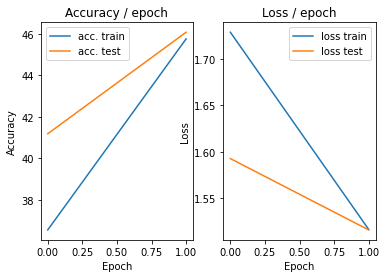

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 1.6067 (1.6067)	Prec@1  41.4 ( 41.4)	Prec@5  92.2 ( 92.2)


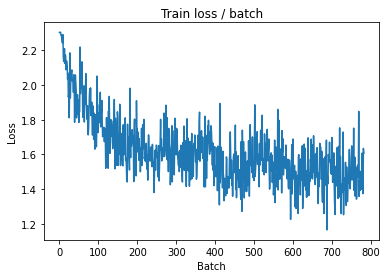

[TRAIN Batch 200/391]	Time 0.062s (0.041s)	Loss 1.5376 (1.4389)	Prec@1  43.0 ( 49.1)	Prec@5  93.0 ( 92.1)


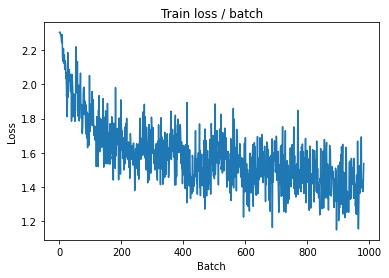


===============> Total time 15s	Avg loss 1.4285	Avg Prec@1 49.79 %	Avg Prec@5 92.18 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.4163 (1.4163)	Prec@1  52.3 ( 52.3)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.3257	Avg Prec@1 54.15 %	Avg Prec@5 93.32 %



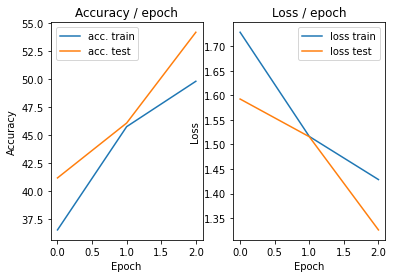

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.3601 (1.3601)	Prec@1  49.2 ( 49.2)	Prec@5  92.2 ( 92.2)


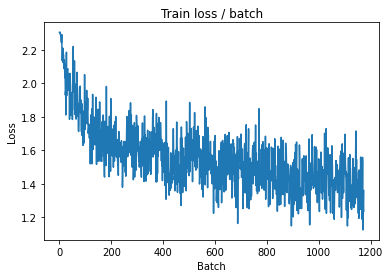

[TRAIN Batch 200/391]	Time 0.013s (0.041s)	Loss 1.4562 (1.3822)	Prec@1  52.3 ( 52.0)	Prec@5  89.1 ( 92.6)


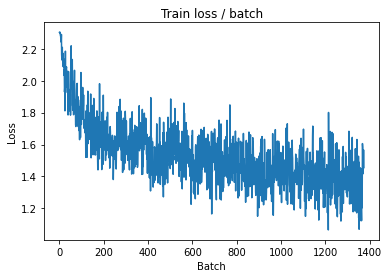


===============> Total time 15s	Avg loss 1.3732	Avg Prec@1 52.49 %	Avg Prec@5 92.71 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.3892 (1.3892)	Prec@1  51.6 ( 51.6)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.3548	Avg Prec@1 52.95 %	Avg Prec@5 92.65 %



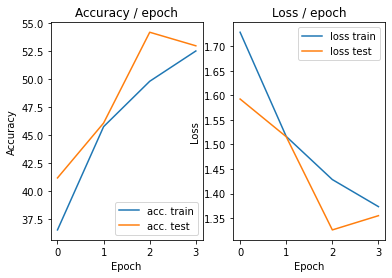

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.3834 (1.3834)	Prec@1  51.6 ( 51.6)	Prec@5  94.5 ( 94.5)


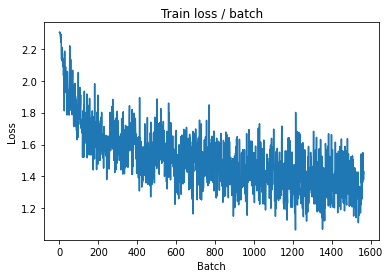

[TRAIN Batch 200/391]	Time 0.052s (0.041s)	Loss 1.3951 (1.3422)	Prec@1  53.9 ( 53.5)	Prec@5  95.3 ( 93.0)


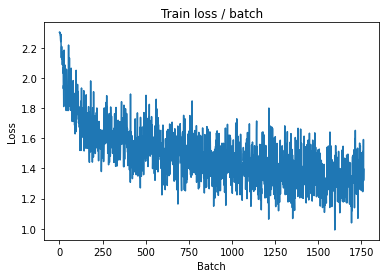


===============> Total time 15s	Avg loss 1.3479	Avg Prec@1 53.52 %	Avg Prec@5 92.84 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.4460 (1.4460)	Prec@1  50.8 ( 50.8)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2891	Avg Prec@1 55.00 %	Avg Prec@5 94.08 %



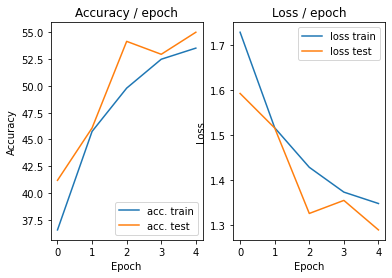

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 1.3587 (1.3587)	Prec@1  56.2 ( 56.2)	Prec@5  91.4 ( 91.4)


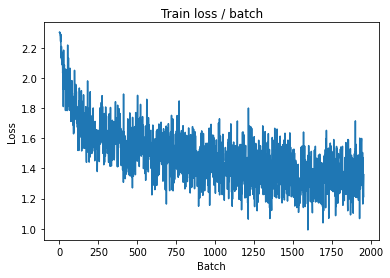

[TRAIN Batch 200/391]	Time 0.008s (0.042s)	Loss 1.5381 (1.3151)	Prec@1  50.8 ( 54.7)	Prec@5  91.4 ( 93.2)


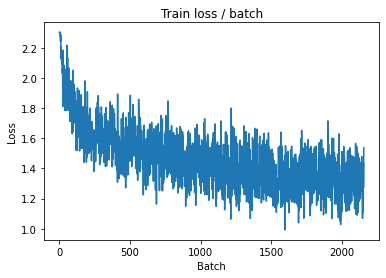


===============> Total time 16s	Avg loss 1.3063	Avg Prec@1 55.06 %	Avg Prec@5 93.34 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.4072 (1.4072)	Prec@1  53.9 ( 53.9)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.3514	Avg Prec@1 54.89 %	Avg Prec@5 93.39 %



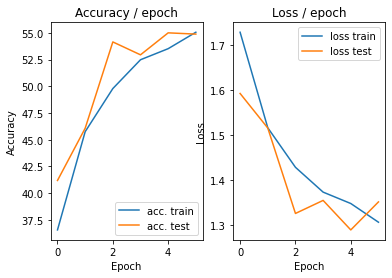

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.3846 (1.3846)	Prec@1  58.6 ( 58.6)	Prec@5  90.6 ( 90.6)


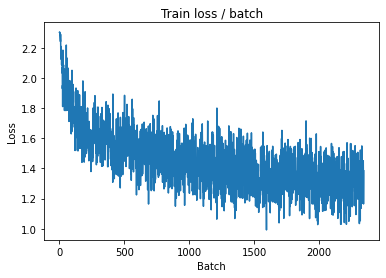

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 1.1098 (1.2818)	Prec@1  56.2 ( 56.4)	Prec@5  95.3 ( 93.5)


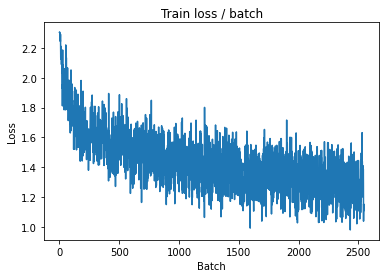


===============> Total time 15s	Avg loss 1.2812	Avg Prec@1 56.71 %	Avg Prec@5 93.61 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 1.4523 (1.4523)	Prec@1  52.3 ( 52.3)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.3569	Avg Prec@1 53.40 %	Avg Prec@5 92.10 %



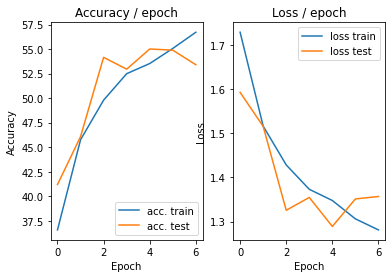

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 1.3207 (1.3207)	Prec@1  53.9 ( 53.9)	Prec@5  91.4 ( 91.4)


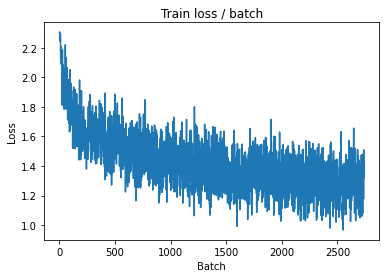

[TRAIN Batch 200/391]	Time 0.017s (0.041s)	Loss 1.2230 (1.2308)	Prec@1  57.8 ( 58.1)	Prec@5  93.8 ( 94.0)


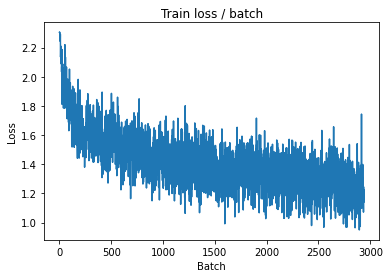


===============> Total time 15s	Avg loss 1.2417	Avg Prec@1 57.88 %	Avg Prec@5 93.96 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.3691 (1.3691)	Prec@1  56.2 ( 56.2)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.1983	Avg Prec@1 59.93 %	Avg Prec@5 94.24 %



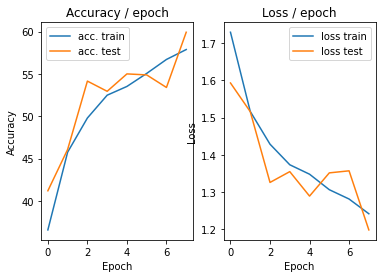

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 1.1774 (1.1774)	Prec@1  60.2 ( 60.2)	Prec@5  92.2 ( 92.2)


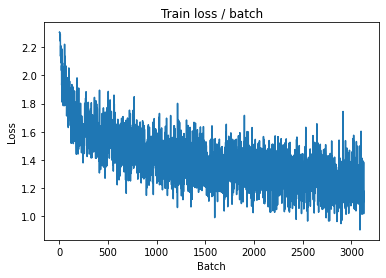

[TRAIN Batch 200/391]	Time 0.064s (0.041s)	Loss 1.2141 (1.1967)	Prec@1  54.7 ( 59.4)	Prec@5  94.5 ( 94.2)


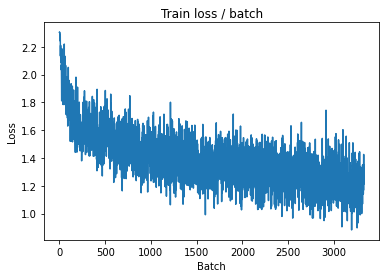

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.3045 (1.3045)	Prec@1  55.5 ( 55.5)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.1488	Avg Prec@1 61.29 %	Avg Prec@5 94.60 %



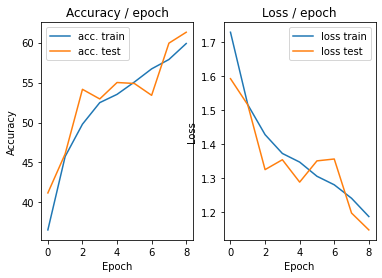

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.0880 (1.0880)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)


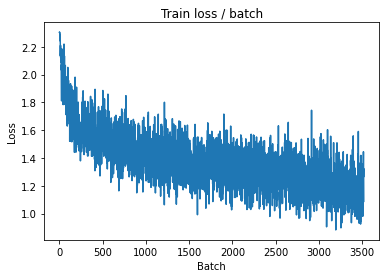

[TRAIN Batch 200/391]	Time 0.022s (0.041s)	Loss 1.0664 (1.1788)	Prec@1  60.2 ( 60.6)	Prec@5  94.5 ( 94.4)


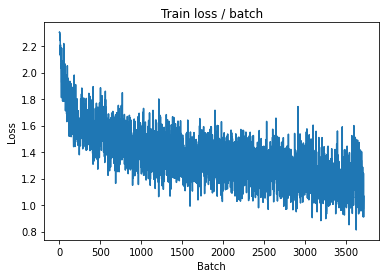


===============> Total time 15s	Avg loss 1.1707	Avg Prec@1 60.62 %	Avg Prec@5 94.62 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 1.2585 (1.2585)	Prec@1  60.2 ( 60.2)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.1974	Avg Prec@1 60.34 %	Avg Prec@5 94.43 %



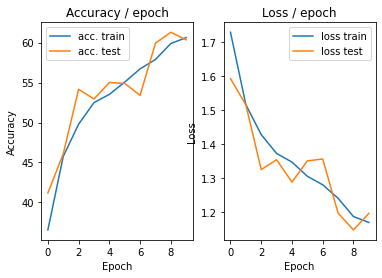

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 1.2529 (1.2529)	Prec@1  60.2 ( 60.2)	Prec@5  94.5 ( 94.5)


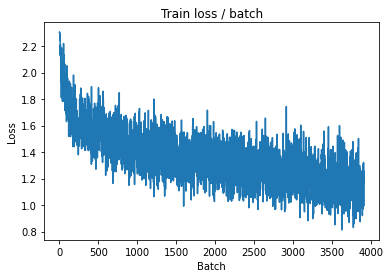

[TRAIN Batch 200/391]	Time 0.025s (0.041s)	Loss 1.2463 (1.1208)	Prec@1  59.4 ( 62.4)	Prec@5  96.1 ( 94.8)


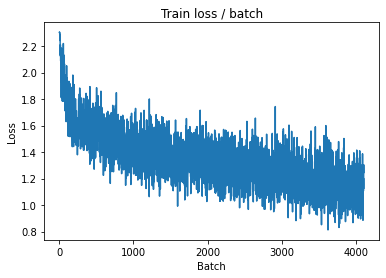


===============> Total time 15s	Avg loss 1.1245	Avg Prec@1 62.41 %	Avg Prec@5 94.93 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.1269 (1.1269)	Prec@1  59.4 ( 59.4)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.1212	Avg Prec@1 62.15 %	Avg Prec@5 95.00 %



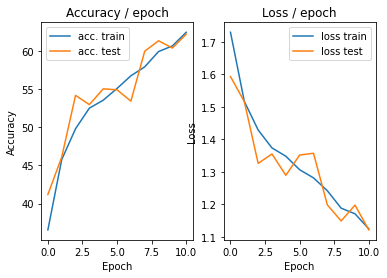

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 1.1109 (1.1109)	Prec@1  57.0 ( 57.0)	Prec@5  96.9 ( 96.9)


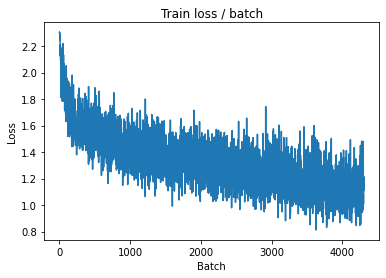

[TRAIN Batch 200/391]	Time 0.067s (0.040s)	Loss 1.2124 (1.0934)	Prec@1  62.5 ( 63.1)	Prec@5  95.3 ( 95.4)


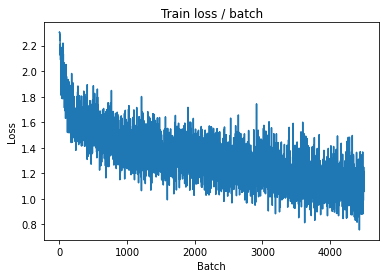


===============> Total time 15s	Avg loss 1.0938	Avg Prec@1 63.27 %	Avg Prec@5 95.25 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 1.0883 (1.0883)	Prec@1  67.2 ( 67.2)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.0729	Avg Prec@1 65.77 %	Avg Prec@5 95.58 %



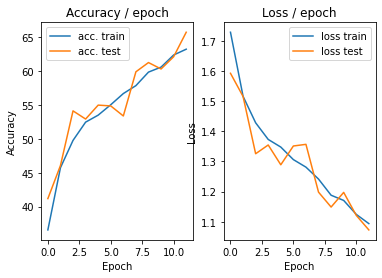

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.0436 (1.0436)	Prec@1  68.0 ( 68.0)	Prec@5  96.1 ( 96.1)


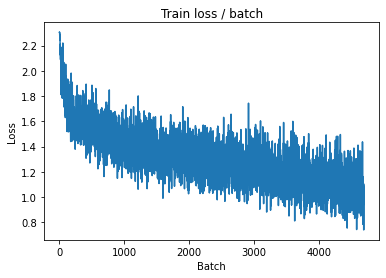

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 1.0410 (1.0648)	Prec@1  70.3 ( 64.8)	Prec@5  99.2 ( 95.3)


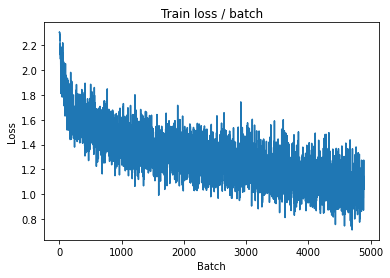


===============> Total time 16s	Avg loss 1.0649	Avg Prec@1 64.62 %	Avg Prec@5 95.45 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.2411 (1.2411)	Prec@1  60.2 ( 60.2)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.1173	Avg Prec@1 63.69 %	Avg Prec@5 95.35 %



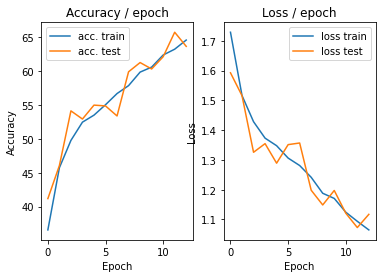

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.0312 (1.0312)	Prec@1  64.1 ( 64.1)	Prec@5  93.0 ( 93.0)


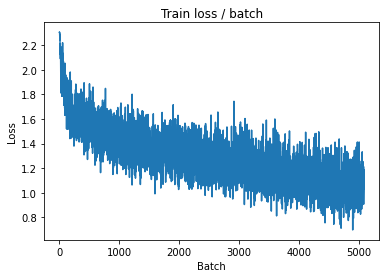

[TRAIN Batch 200/391]	Time 0.021s (0.041s)	Loss 1.0376 (1.0147)	Prec@1  66.4 ( 66.2)	Prec@5  97.7 ( 95.8)


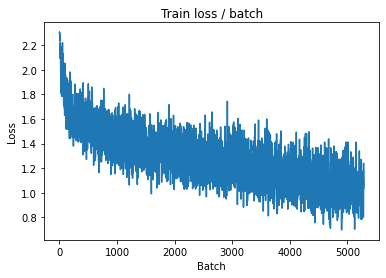


===============> Total time 15s	Avg loss 1.0202	Avg Prec@1 66.01 %	Avg Prec@5 95.82 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.0219 (1.0219)	Prec@1  68.8 ( 68.8)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.0716	Avg Prec@1 64.71 %	Avg Prec@5 95.29 %



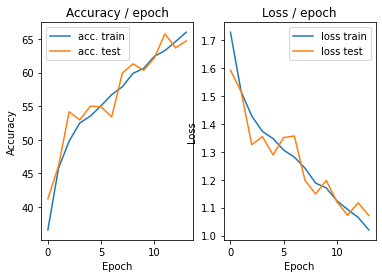

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.9088 (0.9088)	Prec@1  68.8 ( 68.8)	Prec@5  96.1 ( 96.1)


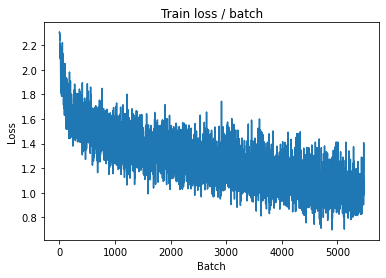

[TRAIN Batch 200/391]	Time 0.053s (0.042s)	Loss 1.1385 (0.9896)	Prec@1  56.2 ( 67.0)	Prec@5  94.5 ( 96.0)


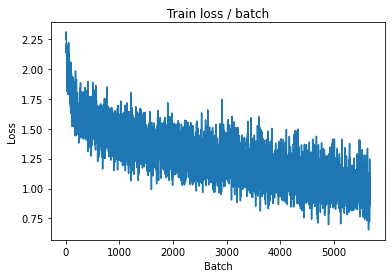


===============> Total time 16s	Avg loss 0.9781	Avg Prec@1 67.43 %	Avg Prec@5 96.05 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.1537 (1.1537)	Prec@1  63.3 ( 63.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.0629	Avg Prec@1 64.32 %	Avg Prec@5 95.68 %



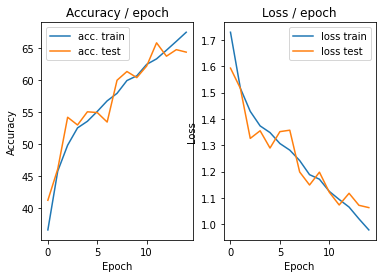

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.0303 (1.0303)	Prec@1  63.3 ( 63.3)	Prec@5  96.1 ( 96.1)


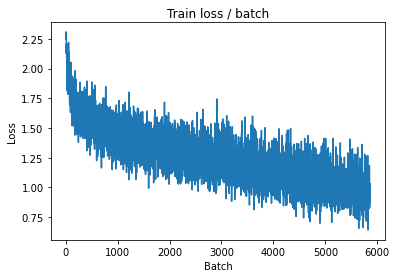

[TRAIN Batch 200/391]	Time 0.010s (0.041s)	Loss 1.0772 (0.9357)	Prec@1  67.2 ( 68.6)	Prec@5  95.3 ( 96.5)


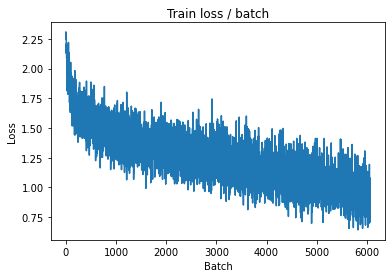


===============> Total time 15s	Avg loss 0.9503	Avg Prec@1 68.27 %	Avg Prec@5 96.46 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.0498 (1.0498)	Prec@1  61.7 ( 61.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9944	Avg Prec@1 67.29 %	Avg Prec@5 96.24 %



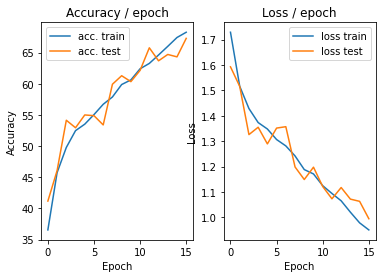

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 1.0142 (1.0142)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)


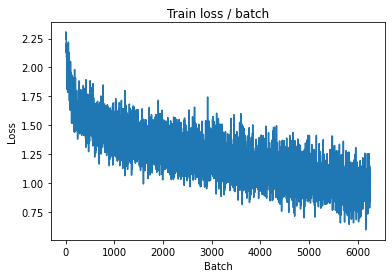

[TRAIN Batch 200/391]	Time 0.025s (0.041s)	Loss 0.9028 (0.9302)	Prec@1  69.5 ( 69.2)	Prec@5  95.3 ( 96.5)


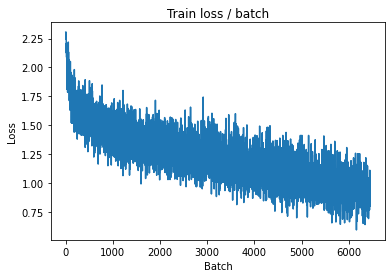


===============> Total time 15s	Avg loss 0.9417	Avg Prec@1 68.65 %	Avg Prec@5 96.39 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.1479 (1.1479)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 0.9594	Avg Prec@1 68.37 %	Avg Prec@5 96.75 %



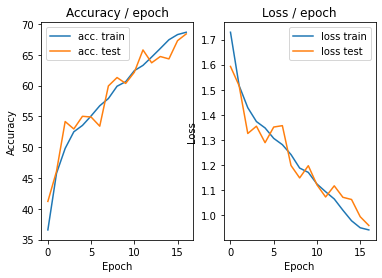

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 1.0532 (1.0532)	Prec@1  68.0 ( 68.0)	Prec@5  95.3 ( 95.3)


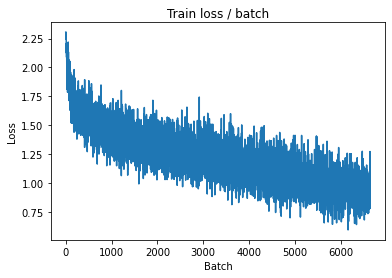

[TRAIN Batch 200/391]	Time 0.068s (0.041s)	Loss 1.1110 (0.9139)	Prec@1  73.4 ( 69.6)	Prec@5  95.3 ( 96.5)


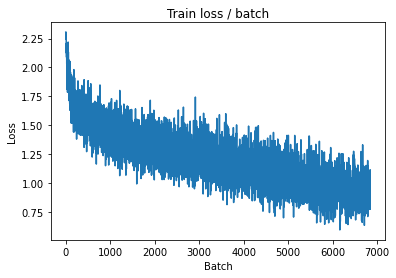


===============> Total time 15s	Avg loss 0.9019	Avg Prec@1 69.85 %	Avg Prec@5 96.76 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.9607 (0.9607)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9617	Avg Prec@1 69.08 %	Avg Prec@5 96.50 %



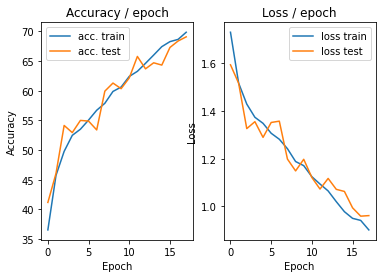

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.8954 (0.8954)	Prec@1  70.3 ( 70.3)	Prec@5  97.7 ( 97.7)


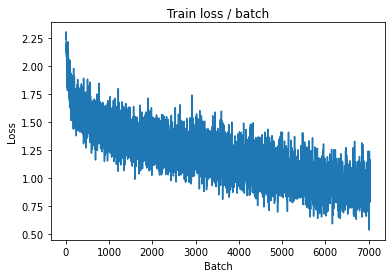

[TRAIN Batch 200/391]	Time 0.037s (0.041s)	Loss 1.0003 (0.8688)	Prec@1  66.4 ( 70.7)	Prec@5  96.1 ( 96.8)


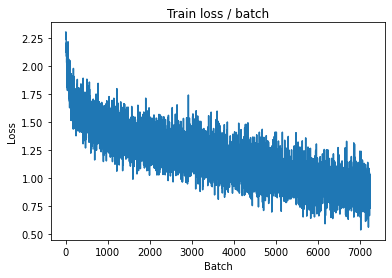


===============> Total time 16s	Avg loss 0.8707	Avg Prec@1 70.88 %	Avg Prec@5 96.85 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.9031 (0.9031)	Prec@1  73.4 ( 73.4)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 0.9231	Avg Prec@1 69.99 %	Avg Prec@5 96.44 %



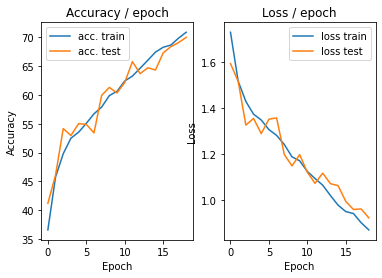

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 1.0190 (1.0190)	Prec@1  68.8 ( 68.8)	Prec@5  94.5 ( 94.5)


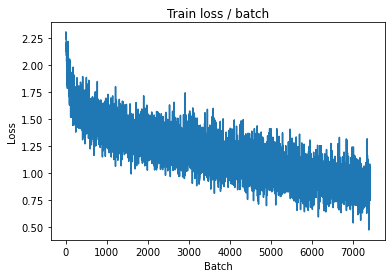

[TRAIN Batch 200/391]	Time 0.018s (0.042s)	Loss 0.8360 (0.8494)	Prec@1  76.6 ( 71.7)	Prec@5  96.1 ( 97.1)


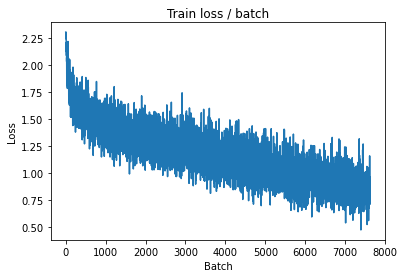


===============> Total time 16s	Avg loss 0.8420	Avg Prec@1 71.87 %	Avg Prec@5 97.11 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.7533 (0.7533)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9219	Avg Prec@1 71.36 %	Avg Prec@5 97.18 %



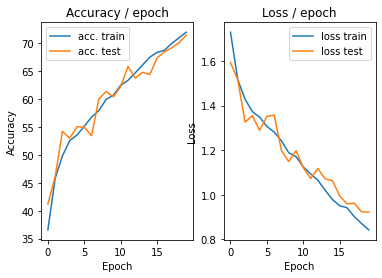

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.8782 (0.8782)	Prec@1  68.8 ( 68.8)	Prec@5  97.7 ( 97.7)


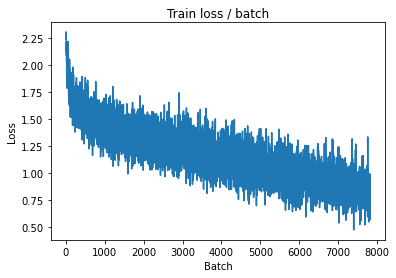

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 0.7383 (0.8200)	Prec@1  74.2 ( 72.3)	Prec@5  96.1 ( 97.5)


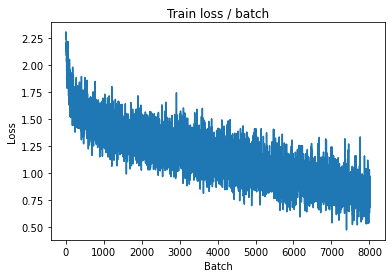


===============> Total time 15s	Avg loss 0.8135	Avg Prec@1 72.69 %	Avg Prec@5 97.44 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.8251 (0.8251)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8841	Avg Prec@1 71.23 %	Avg Prec@5 97.02 %



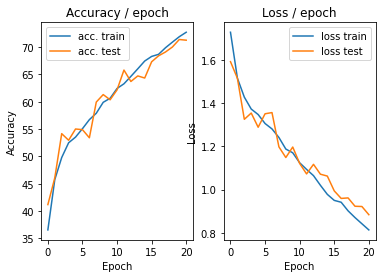

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.8160 (0.8160)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)


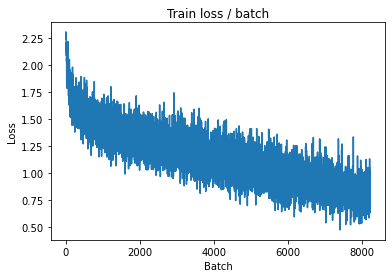

[TRAIN Batch 200/391]	Time 0.038s (0.041s)	Loss 0.8660 (0.7623)	Prec@1  71.1 ( 74.5)	Prec@5  98.4 ( 97.7)


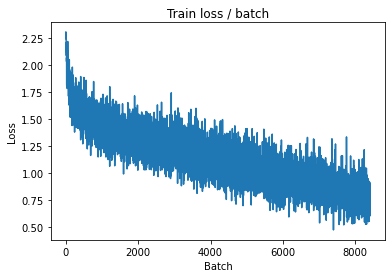


===============> Total time 15s	Avg loss 0.7813	Avg Prec@1 73.94 %	Avg Prec@5 97.49 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.8513 (0.8513)	Prec@1  66.4 ( 66.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.8830	Avg Prec@1 72.78 %	Avg Prec@5 97.26 %



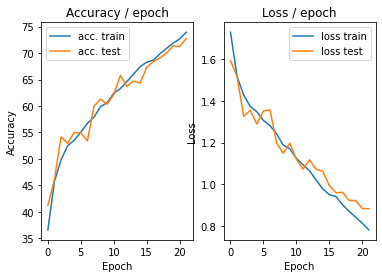

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 0.6534 (0.6534)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)


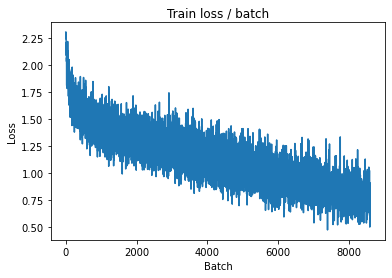

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 0.8734 (0.7422)	Prec@1  75.0 ( 74.9)	Prec@5  95.3 ( 97.8)


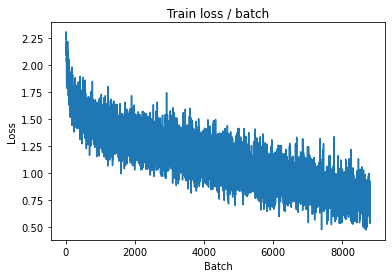


===============> Total time 16s	Avg loss 0.7500	Avg Prec@1 74.79 %	Avg Prec@5 97.71 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.7596 (0.7596)	Prec@1  71.9 ( 71.9)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.8605	Avg Prec@1 72.83 %	Avg Prec@5 97.32 %



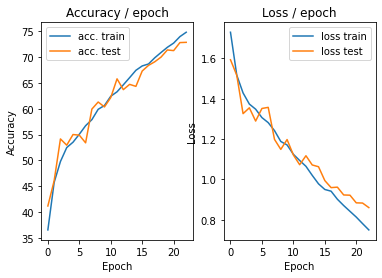

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.9300 (0.9300)	Prec@1  75.8 ( 75.8)	Prec@5  96.1 ( 96.1)


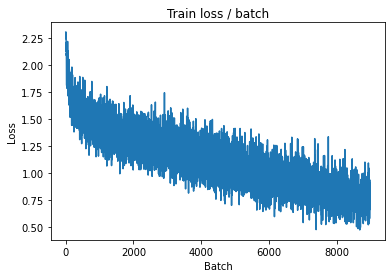

[TRAIN Batch 200/391]	Time 0.034s (0.041s)	Loss 0.8749 (0.7137)	Prec@1  71.1 ( 76.1)	Prec@5  96.1 ( 97.8)


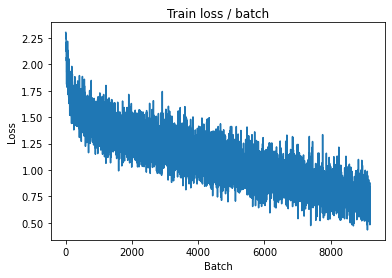


===============> Total time 16s	Avg loss 0.7213	Avg Prec@1 75.91 %	Avg Prec@5 97.78 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.7753 (0.7753)	Prec@1  74.2 ( 74.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8485	Avg Prec@1 73.28 %	Avg Prec@5 97.53 %



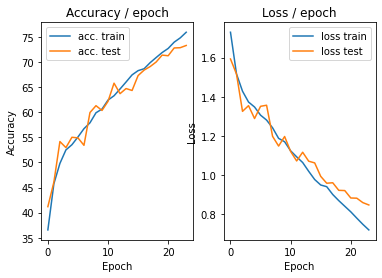

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.6623 (0.6623)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)


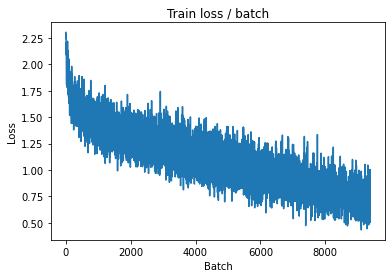

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 0.6880 (0.7048)	Prec@1  77.3 ( 76.1)	Prec@5  97.7 ( 98.0)


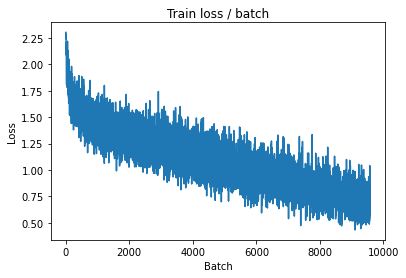


===============> Total time 15s	Avg loss 0.7009	Avg Prec@1 76.38 %	Avg Prec@5 98.02 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.7524 (0.7524)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8381	Avg Prec@1 74.09 %	Avg Prec@5 97.88 %



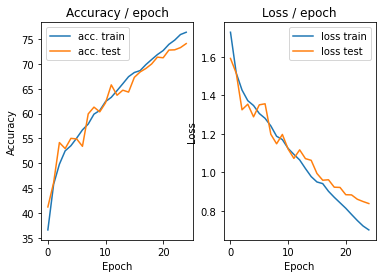

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.7384 (0.7384)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)


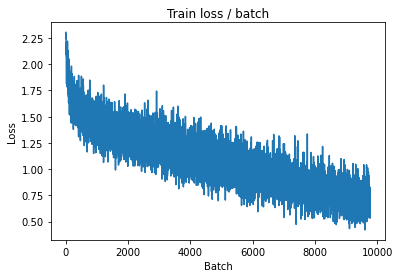

[TRAIN Batch 200/391]	Time 0.055s (0.042s)	Loss 0.7976 (0.6775)	Prec@1  77.3 ( 77.2)	Prec@5  96.9 ( 98.4)


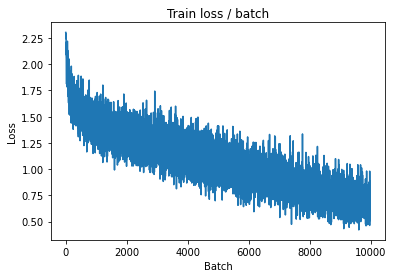


===============> Total time 16s	Avg loss 0.6792	Avg Prec@1 77.22 %	Avg Prec@5 98.30 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.8250 (0.8250)	Prec@1  73.4 ( 73.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.8103	Avg Prec@1 74.27 %	Avg Prec@5 97.44 %



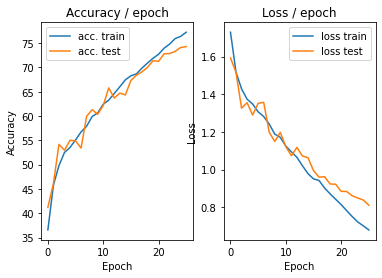

In [ ]:
mainLR(128, 0.1, cuda=True)

**Bonus : ADAM**

In [ ]:
class  AlexNetAdam(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetAdam, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0,ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def mainAdam(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetAdam()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr)
    


    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
       
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 2.3020 (2.3020)	Prec@1  18.0 ( 18.0)	Prec@5  50.0 ( 50.0)


<Figure size 432x288 with 0 Axes>

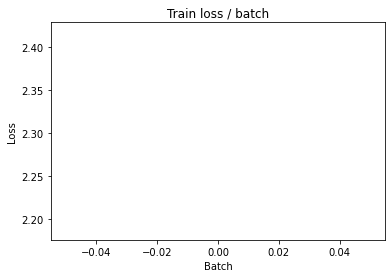

[TRAIN Batch 200/391]	Time 0.014s (0.042s)	Loss 1.2709 (1.6448)	Prec@1  54.7 ( 39.7)	Prec@5  94.5 ( 88.0)


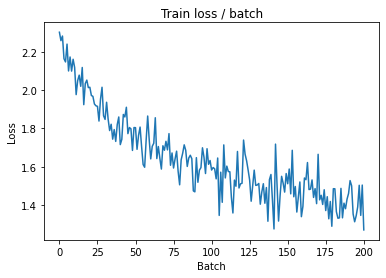


===============> Total time 16s	Avg loss 1.4675	Avg Prec@1 46.72 %	Avg Prec@5 91.12 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.0941 (1.0941)	Prec@1  65.6 ( 65.6)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.1557	Avg Prec@1 59.61 %	Avg Prec@5 95.51 %



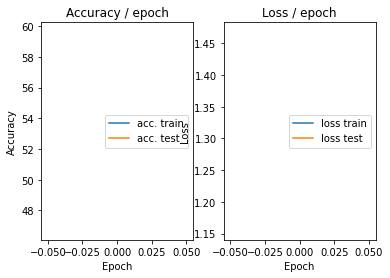

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 1.1205 (1.1205)	Prec@1  57.8 ( 57.8)	Prec@5  94.5 ( 94.5)


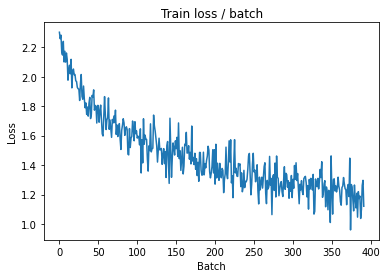

[TRAIN Batch 200/391]	Time 0.042s (0.042s)	Loss 0.9063 (1.0992)	Prec@1  69.5 ( 60.8)	Prec@5  95.3 ( 96.1)


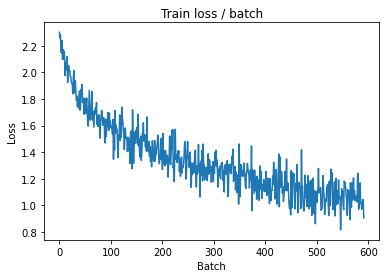


===============> Total time 16s	Avg loss 1.0476	Avg Prec@1 62.90 %	Avg Prec@5 96.43 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.8736 (0.8736)	Prec@1  67.2 ( 67.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9054	Avg Prec@1 68.52 %	Avg Prec@5 97.32 %



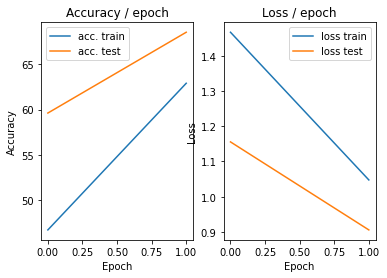

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 1.0224 (1.0224)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)


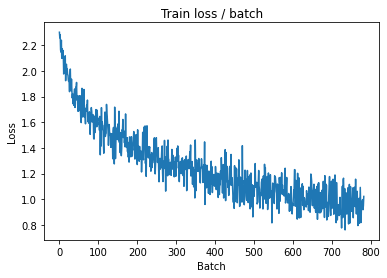

[TRAIN Batch 200/391]	Time 0.071s (0.042s)	Loss 0.9066 (0.9042)	Prec@1  70.3 ( 68.0)	Prec@5  97.7 ( 97.4)


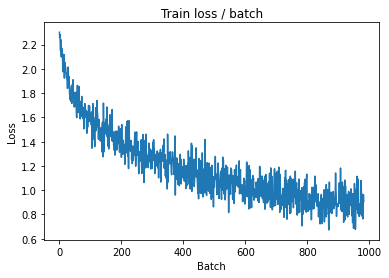


===============> Total time 16s	Avg loss 0.8845	Avg Prec@1 68.80 %	Avg Prec@5 97.47 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 0.7632 (0.7632)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8183	Avg Prec@1 71.24 %	Avg Prec@5 98.11 %



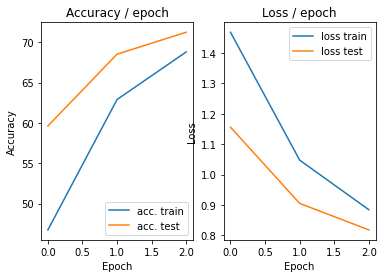

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.218s (0.218s)	Loss 0.9385 (0.9385)	Prec@1  67.2 ( 67.2)	Prec@5  96.1 ( 96.1)


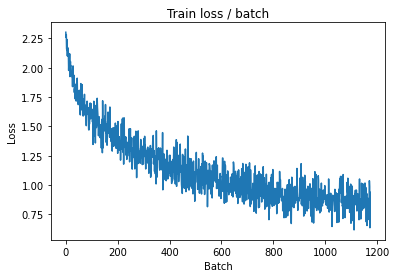

[TRAIN Batch 200/391]	Time 0.085s (0.043s)	Loss 0.5815 (0.7953)	Prec@1  80.5 ( 72.1)	Prec@5 100.0 ( 98.0)


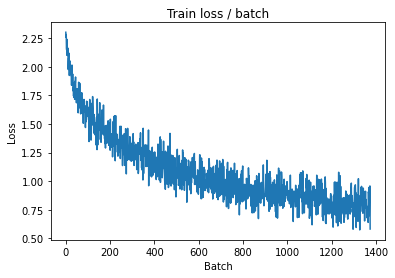


===============> Total time 16s	Avg loss 0.7906	Avg Prec@1 72.26 %	Avg Prec@5 97.99 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.8320 (0.8320)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7945	Avg Prec@1 72.70 %	Avg Prec@5 97.99 %



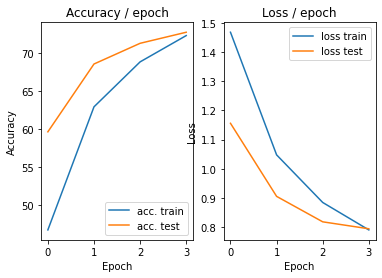

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.7546 (0.7546)	Prec@1  75.8 ( 75.8)	Prec@5  96.9 ( 96.9)


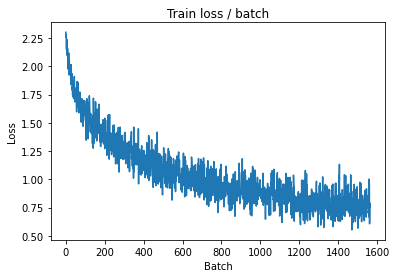

[TRAIN Batch 200/391]	Time 0.052s (0.042s)	Loss 0.7635 (0.7231)	Prec@1  70.3 ( 74.6)	Prec@5  97.7 ( 98.3)


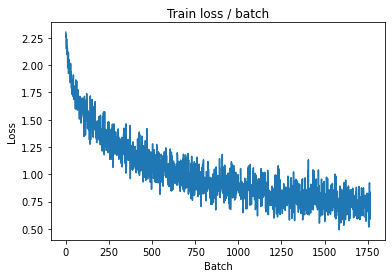


===============> Total time 16s	Avg loss 0.7211	Avg Prec@1 74.61 %	Avg Prec@5 98.32 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.8456 (0.8456)	Prec@1  68.8 ( 68.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7211	Avg Prec@1 75.24 %	Avg Prec@5 98.49 %



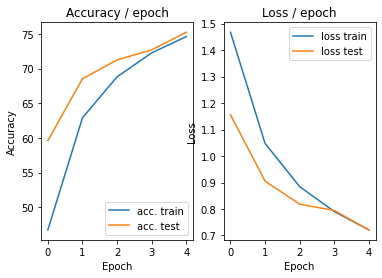

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.7026 (0.7026)	Prec@1  75.0 ( 75.0)	Prec@5 100.0 (100.0)


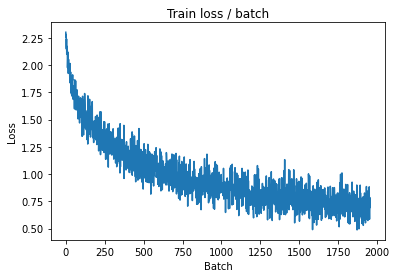

[TRAIN Batch 200/391]	Time 0.016s (0.042s)	Loss 0.6588 (0.6682)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.6)


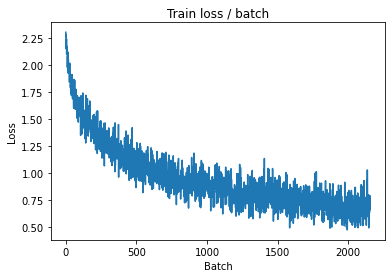


===============> Total time 16s	Avg loss 0.6704	Avg Prec@1 76.50 %	Avg Prec@5 98.61 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.7805 (0.7805)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7190	Avg Prec@1 75.27 %	Avg Prec@5 98.21 %



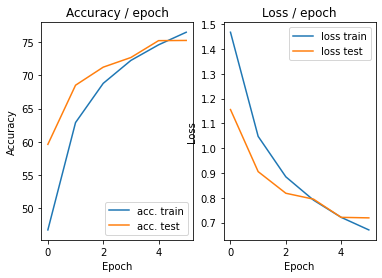

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.7678 (0.7678)	Prec@1  72.7 ( 72.7)	Prec@5  99.2 ( 99.2)


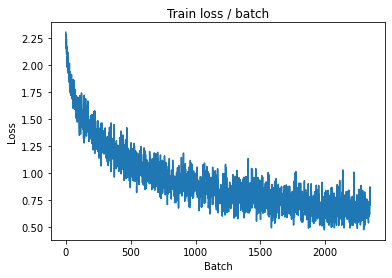

[TRAIN Batch 200/391]	Time 0.044s (0.043s)	Loss 0.4874 (0.6328)	Prec@1  84.4 ( 77.8)	Prec@5  99.2 ( 98.8)


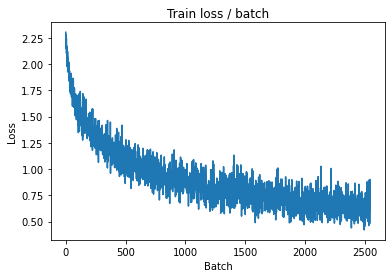


===============> Total time 16s	Avg loss 0.6328	Avg Prec@1 77.84 %	Avg Prec@5 98.73 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.6842 (0.6842)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7063	Avg Prec@1 75.94 %	Avg Prec@5 98.41 %



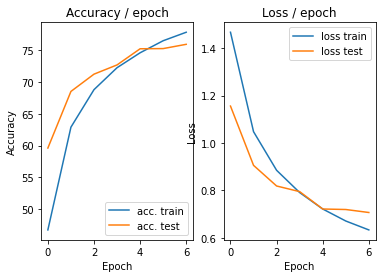

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.5083 (0.5083)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


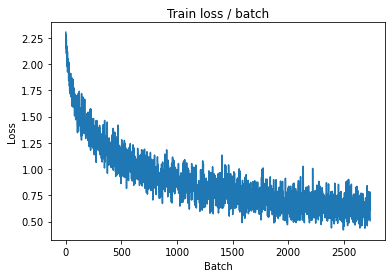

[TRAIN Batch 200/391]	Time 0.018s (0.041s)	Loss 0.5260 (0.5931)	Prec@1  79.7 ( 79.0)	Prec@5 100.0 ( 99.0)


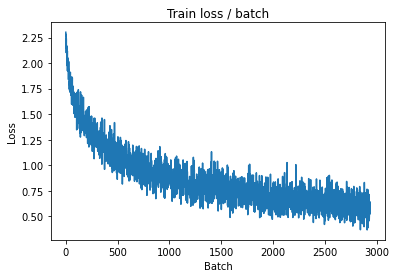


===============> Total time 16s	Avg loss 0.5921	Avg Prec@1 79.14 %	Avg Prec@5 98.98 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.7819 (0.7819)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6892	Avg Prec@1 76.55 %	Avg Prec@5 98.49 %



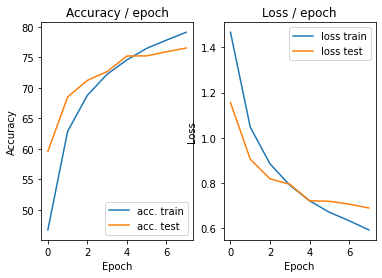

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 0.5120 (0.5120)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)


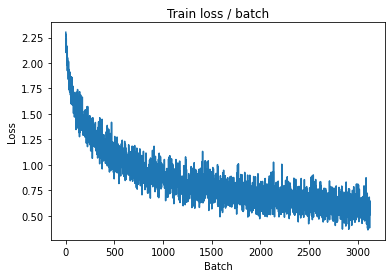

[TRAIN Batch 200/391]	Time 0.017s (0.042s)	Loss 0.7115 (0.5553)	Prec@1  77.3 ( 80.6)	Prec@5  99.2 ( 99.0)


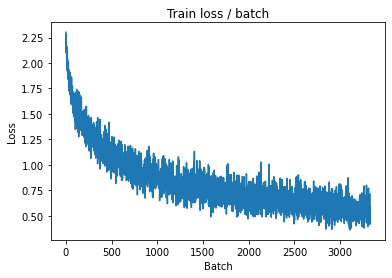


===============> Total time 16s	Avg loss 0.5613	Avg Prec@1 80.38 %	Avg Prec@5 99.05 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.7262 (0.7262)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6733	Avg Prec@1 77.18 %	Avg Prec@5 98.56 %



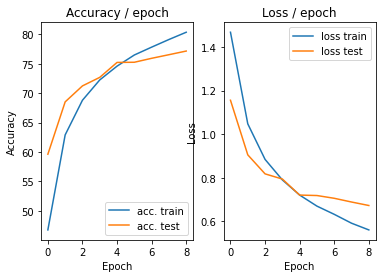

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.5505 (0.5505)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)


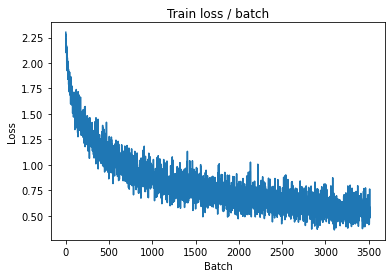

[TRAIN Batch 200/391]	Time 0.059s (0.042s)	Loss 0.4333 (0.5177)	Prec@1  85.2 ( 81.8)	Prec@5  98.4 ( 99.2)


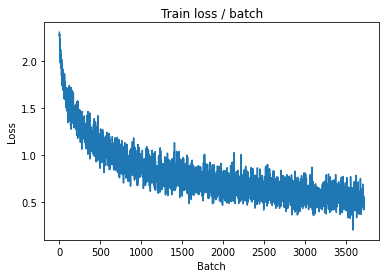


===============> Total time 16s	Avg loss 0.5278	Avg Prec@1 81.51 %	Avg Prec@5 99.19 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.6689 (0.6689)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6382	Avg Prec@1 78.49 %	Avg Prec@5 98.71 %



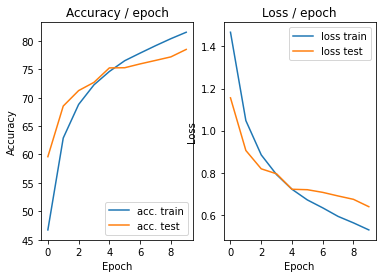

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.4713 (0.4713)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)


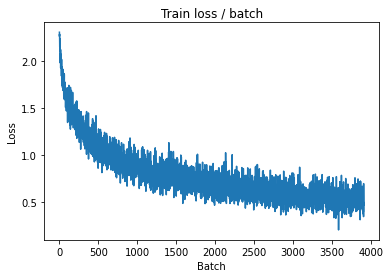

[TRAIN Batch 200/391]	Time 0.059s (0.042s)	Loss 0.4720 (0.4942)	Prec@1  83.6 ( 82.7)	Prec@5 100.0 ( 99.3)


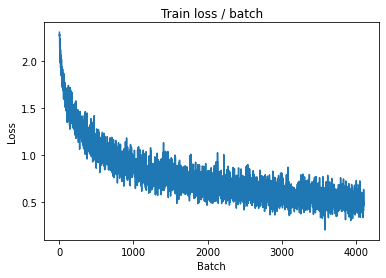


===============> Total time 16s	Avg loss 0.5033	Avg Prec@1 82.50 %	Avg Prec@5 99.22 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.7328 (0.7328)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6772	Avg Prec@1 77.95 %	Avg Prec@5 98.54 %



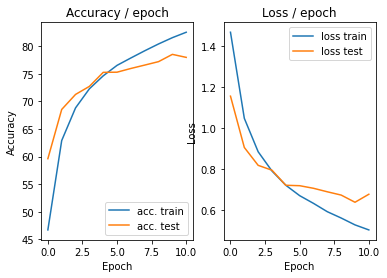

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 0.4134 (0.4134)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


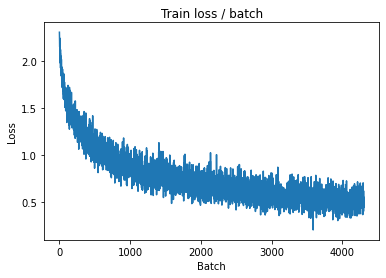

[TRAIN Batch 200/391]	Time 0.017s (0.041s)	Loss 0.6353 (0.4744)	Prec@1  78.1 ( 83.2)	Prec@5 100.0 ( 99.4)


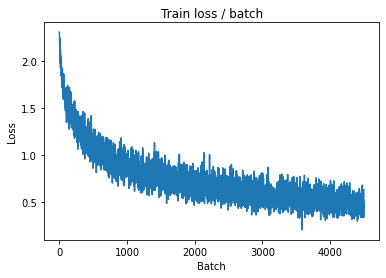


===============> Total time 15s	Avg loss 0.4839	Avg Prec@1 82.93 %	Avg Prec@5 99.35 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.5996 (0.5996)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6396	Avg Prec@1 78.89 %	Avg Prec@5 98.49 %



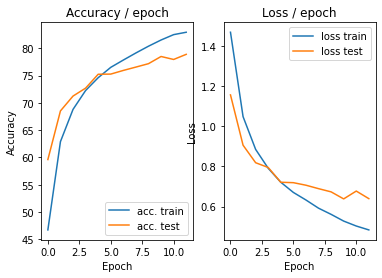

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.5220 (0.5220)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


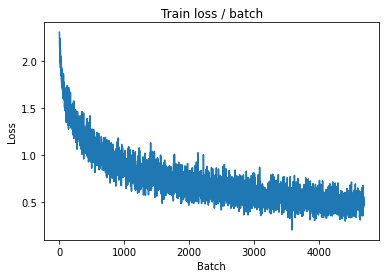

[TRAIN Batch 200/391]	Time 0.017s (0.041s)	Loss 0.4850 (0.4517)	Prec@1  84.4 ( 84.2)	Prec@5 100.0 ( 99.4)


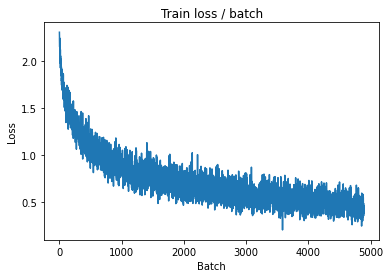


===============> Total time 15s	Avg loss 0.4547	Avg Prec@1 84.10 %	Avg Prec@5 99.40 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.6382 (0.6382)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6378	Avg Prec@1 79.41 %	Avg Prec@5 98.60 %



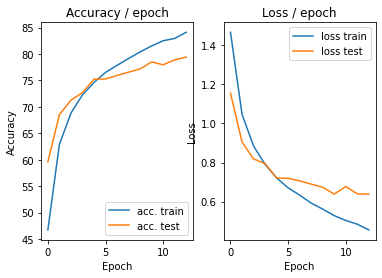

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.4173 (0.4173)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


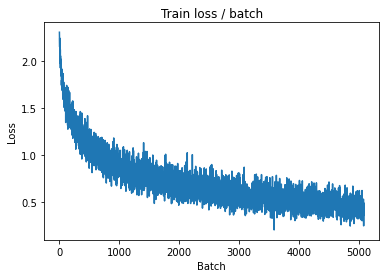

[TRAIN Batch 200/391]	Time 0.055s (0.041s)	Loss 0.5247 (0.4342)	Prec@1  80.5 ( 85.0)	Prec@5  97.7 ( 99.5)


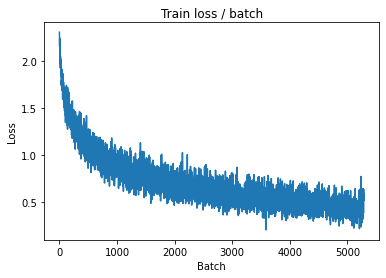


===============> Total time 16s	Avg loss 0.4362	Avg Prec@1 84.71 %	Avg Prec@5 99.49 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.6496 (0.6496)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6539	Avg Prec@1 79.02 %	Avg Prec@5 98.55 %



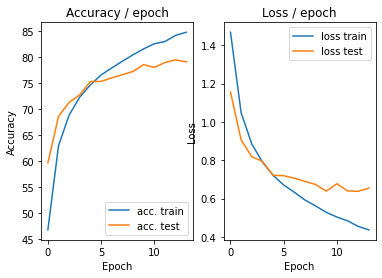

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.4524 (0.4524)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


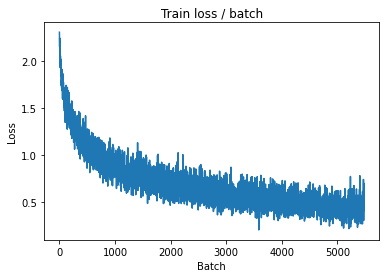

[TRAIN Batch 200/391]	Time 0.056s (0.042s)	Loss 0.4812 (0.4156)	Prec@1  85.2 ( 85.6)	Prec@5  98.4 ( 99.5)


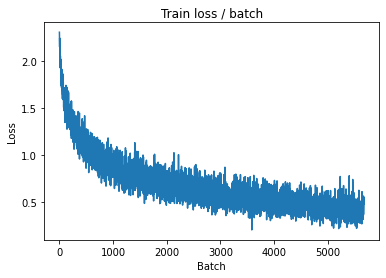


===============> Total time 16s	Avg loss 0.4255	Avg Prec@1 85.06 %	Avg Prec@5 99.48 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.6366 (0.6366)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6704	Avg Prec@1 78.21 %	Avg Prec@5 98.60 %



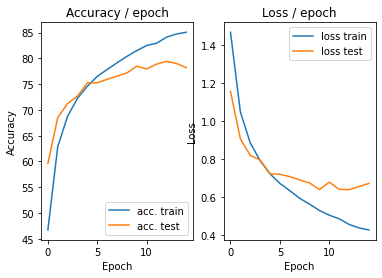

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.3532 (0.3532)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)


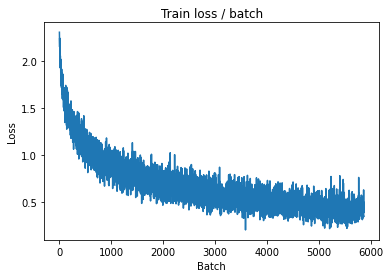

[TRAIN Batch 200/391]	Time 0.063s (0.041s)	Loss 0.4670 (0.3956)	Prec@1  83.6 ( 86.0)	Prec@5 100.0 ( 99.6)


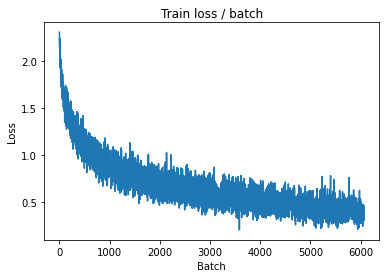


===============> Total time 15s	Avg loss 0.4040	Avg Prec@1 85.76 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.7339 (0.7339)	Prec@1  75.8 ( 75.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.6724	Avg Prec@1 79.16 %	Avg Prec@5 98.60 %



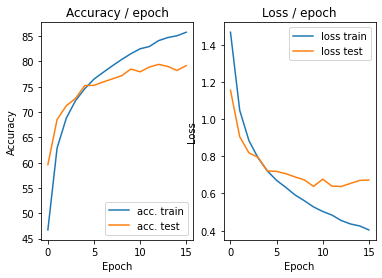

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.3553 (0.3553)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


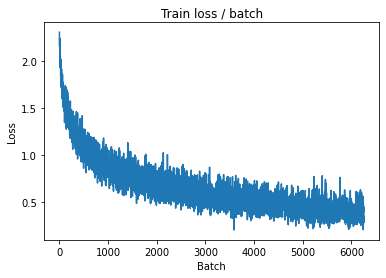

[TRAIN Batch 200/391]	Time 0.067s (0.041s)	Loss 0.4034 (0.3856)	Prec@1  85.2 ( 86.5)	Prec@5 100.0 ( 99.7)


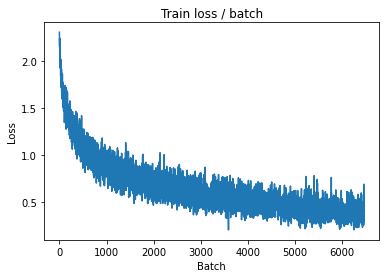


===============> Total time 15s	Avg loss 0.3904	Avg Prec@1 86.39 %	Avg Prec@5 99.59 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.6772 (0.6772)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6543	Avg Prec@1 79.30 %	Avg Prec@5 98.67 %



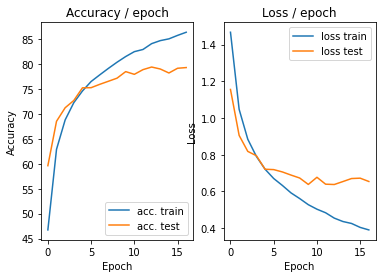

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 0.2748 (0.2748)	Prec@1  91.4 ( 91.4)	Prec@5 100.0 (100.0)


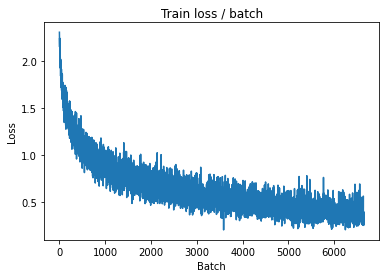

[TRAIN Batch 200/391]	Time 0.029s (0.042s)	Loss 0.3088 (0.3659)	Prec@1  90.6 ( 87.2)	Prec@5  99.2 ( 99.7)


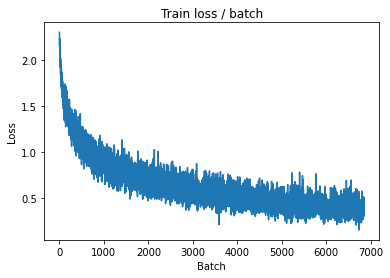


===============> Total time 15s	Avg loss 0.3737	Avg Prec@1 86.92 %	Avg Prec@5 99.65 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 0.6417 (0.6417)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6519	Avg Prec@1 79.77 %	Avg Prec@5 98.63 %



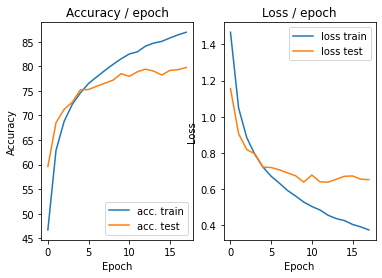

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.4508 (0.4508)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


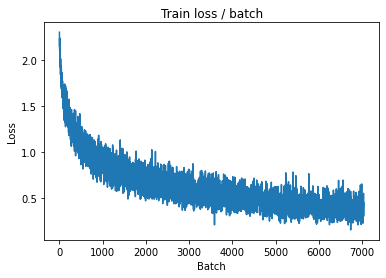

[TRAIN Batch 200/391]	Time 0.015s (0.040s)	Loss 0.3071 (0.3542)	Prec@1  87.5 ( 87.6)	Prec@5 100.0 ( 99.7)


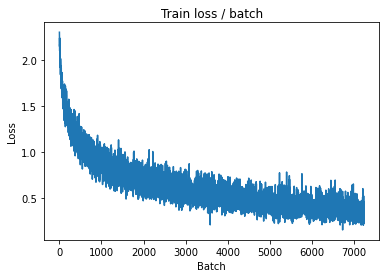


===============> Total time 15s	Avg loss 0.3684	Avg Prec@1 87.01 %	Avg Prec@5 99.65 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.6960 (0.6960)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6502	Avg Prec@1 79.63 %	Avg Prec@5 98.73 %



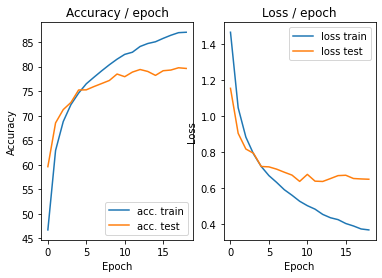

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 0.3859 (0.3859)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


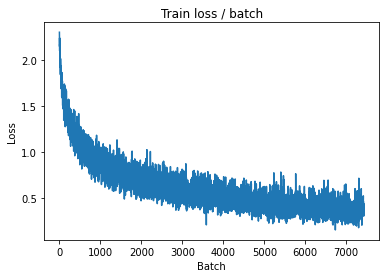

[TRAIN Batch 200/391]	Time 0.008s (0.041s)	Loss 0.3204 (0.3408)	Prec@1  90.6 ( 88.2)	Prec@5 100.0 ( 99.7)


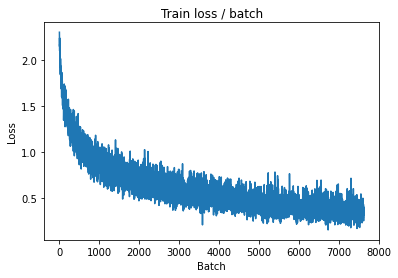


===============> Total time 15s	Avg loss 0.3476	Avg Prec@1 88.00 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 0.7784 (0.7784)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6748	Avg Prec@1 79.52 %	Avg Prec@5 98.69 %



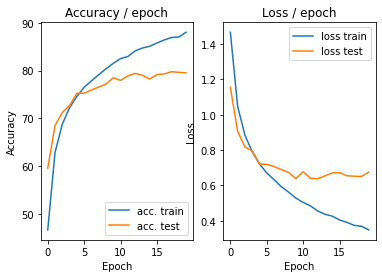

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.3322 (0.3322)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


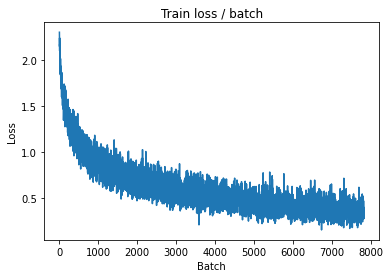

[TRAIN Batch 200/391]	Time 0.054s (0.041s)	Loss 0.2533 (0.3353)	Prec@1  89.8 ( 88.3)	Prec@5 100.0 ( 99.7)


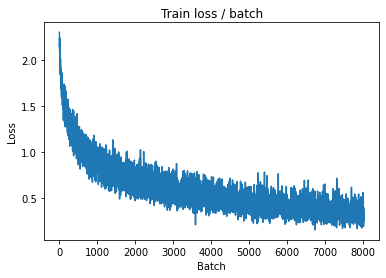


===============> Total time 15s	Avg loss 0.3427	Avg Prec@1 88.02 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.7031 (0.7031)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6705	Avg Prec@1 79.83 %	Avg Prec@5 98.84 %



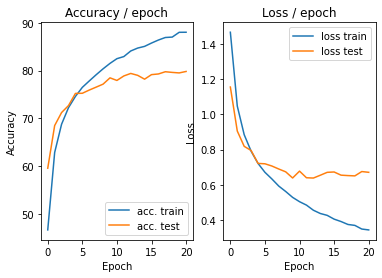

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.167s (0.167s)	Loss 0.5668 (0.5668)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


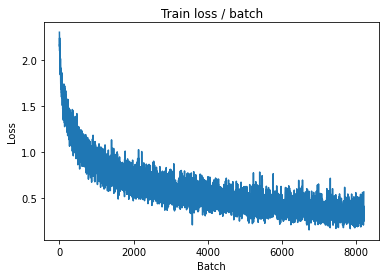

[TRAIN Batch 200/391]	Time 0.056s (0.040s)	Loss 0.2886 (0.3250)	Prec@1  88.3 ( 88.7)	Prec@5 100.0 ( 99.7)


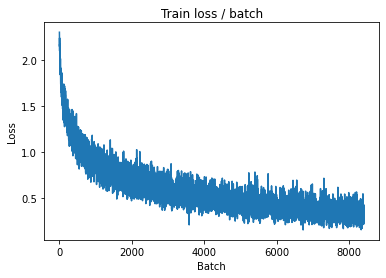


===============> Total time 15s	Avg loss 0.3372	Avg Prec@1 88.33 %	Avg Prec@5 99.74 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.6565 (0.6565)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.6576	Avg Prec@1 80.21 %	Avg Prec@5 98.62 %



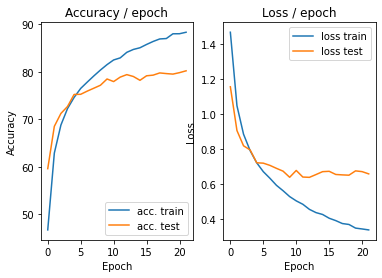

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 0.2461 (0.2461)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


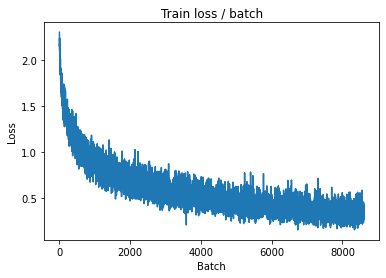

[TRAIN Batch 200/391]	Time 0.020s (0.040s)	Loss 0.3478 (0.3070)	Prec@1  88.3 ( 89.4)	Prec@5 100.0 ( 99.7)


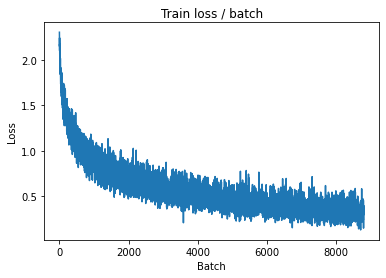


===============> Total time 15s	Avg loss 0.3210	Avg Prec@1 88.89 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.6175 (0.6175)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6763	Avg Prec@1 80.17 %	Avg Prec@5 98.70 %



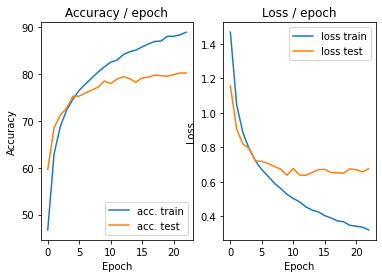

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.3594 (0.3594)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


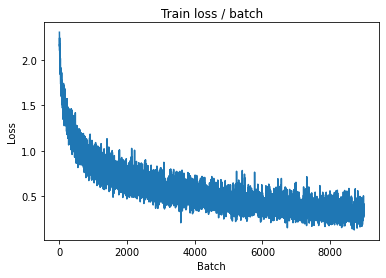

[TRAIN Batch 200/391]	Time 0.014s (0.040s)	Loss 0.2205 (0.2957)	Prec@1  93.0 ( 89.6)	Prec@5  99.2 ( 99.8)


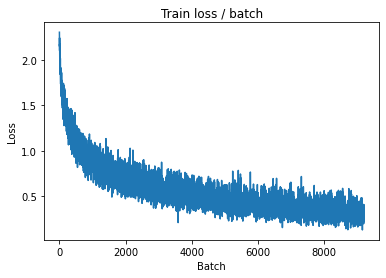


===============> Total time 15s	Avg loss 0.3083	Avg Prec@1 89.18 %	Avg Prec@5 99.80 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.9084 (0.9084)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7012	Avg Prec@1 79.55 %	Avg Prec@5 98.36 %



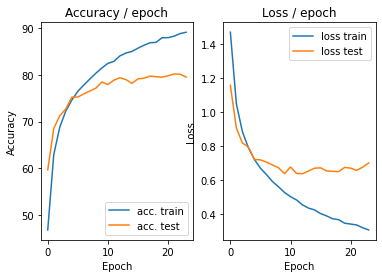

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.2774 (0.2774)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


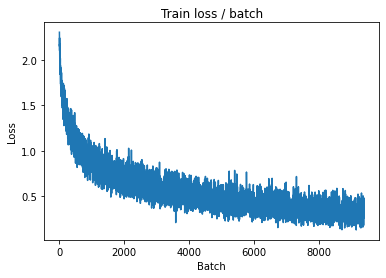

[TRAIN Batch 200/391]	Time 0.057s (0.041s)	Loss 0.3046 (0.2934)	Prec@1  89.1 ( 89.7)	Prec@5 100.0 ( 99.9)


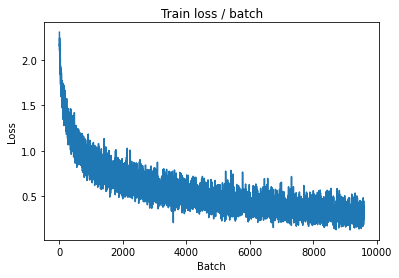


===============> Total time 15s	Avg loss 0.3051	Avg Prec@1 89.30 %	Avg Prec@5 99.80 %

[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 0.6708 (0.6708)	Prec@1  82.8 ( 82.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7280	Avg Prec@1 80.46 %	Avg Prec@5 98.44 %



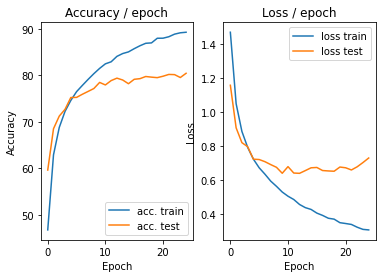

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 0.1863 (0.1863)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


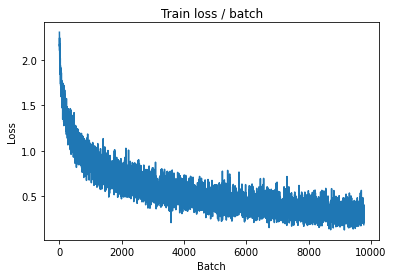

[TRAIN Batch 200/391]	Time 0.072s (0.041s)	Loss 0.2026 (0.2788)	Prec@1  91.4 ( 90.2)	Prec@5 100.0 ( 99.8)


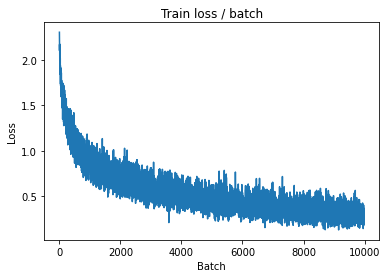


===============> Total time 15s	Avg loss 0.3002	Avg Prec@1 89.50 %	Avg Prec@5 99.79 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.8290 (0.8290)	Prec@1  79.7 ( 79.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7006	Avg Prec@1 80.15 %	Avg Prec@5 98.63 %



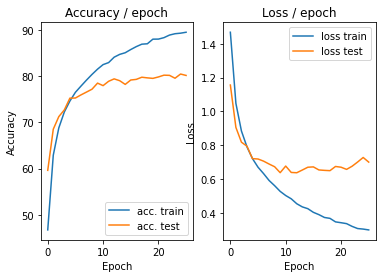

In [ ]:
mainAdam(128, 0.001, cuda=True)

#Dropout

In [ ]:
class  AlexNetDrop(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetDrop, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
          
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),

            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0,ceil_mode=True),
        )
        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def maindrop(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetDrop()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(),lr,momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)


    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        lr_sched.step()
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 2.2981 (2.2981)	Prec@1  12.5 ( 12.5)	Prec@5  55.5 ( 55.5)


<Figure size 432x288 with 0 Axes>

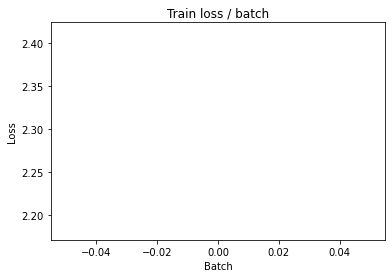

[TRAIN Batch 200/391]	Time 0.056s (0.042s)	Loss 2.1206 (2.2121)	Prec@1  14.1 ( 18.1)	Prec@5  75.0 ( 67.3)


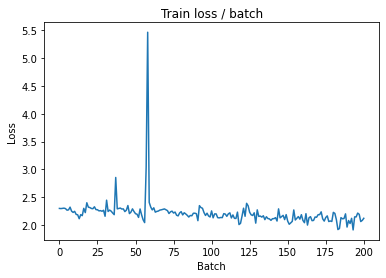


===============> Total time 16s	Avg loss 2.1191	Avg Prec@1 21.58 %	Avg Prec@5 72.35 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.9495 (1.9495)	Prec@1  28.9 ( 28.9)	Prec@5  77.3 ( 77.3)

===============> Total time 2s	Avg loss 1.9335	Avg Prec@1 28.85 %	Avg Prec@5 81.21 %



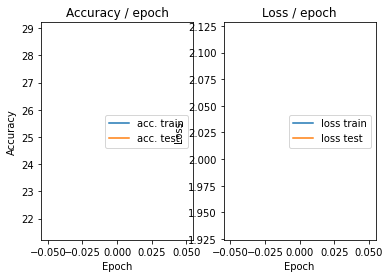

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 1.9387 (1.9387)	Prec@1  24.2 ( 24.2)	Prec@5  78.1 ( 78.1)


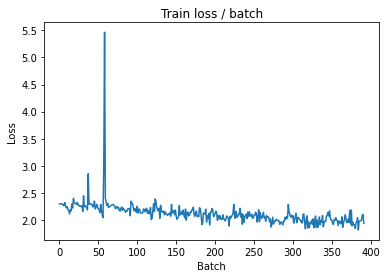

[TRAIN Batch 200/391]	Time 0.058s (0.042s)	Loss 1.8847 (1.9185)	Prec@1  30.5 ( 29.9)	Prec@5  85.2 ( 82.0)


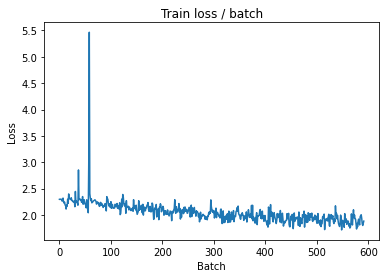


===============> Total time 16s	Avg loss 1.8757	Avg Prec@1 30.99 %	Avg Prec@5 83.36 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.6905 (1.6905)	Prec@1  42.2 ( 42.2)	Prec@5  89.1 ( 89.1)

===============> Total time 2s	Avg loss 1.7084	Avg Prec@1 36.83 %	Avg Prec@5 87.48 %



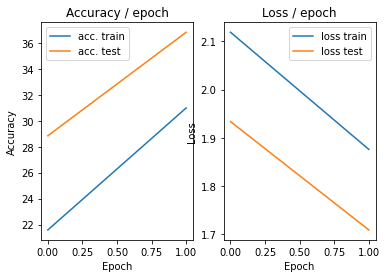

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.8420 (1.8420)	Prec@1  28.1 ( 28.1)	Prec@5  86.7 ( 86.7)


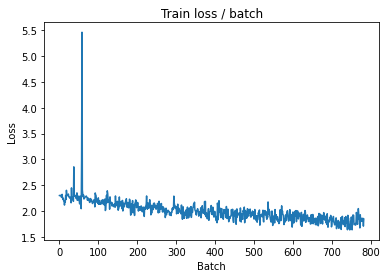

Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7f992cb5c9b0>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 1203, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 1177, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.6/multiprocessing/process.py", line 122, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process
Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7f993a018b38>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 1203, in __del__
    sel

[TRAIN Batch 200/391]	Time 0.024s (0.044s)	Loss 1.9523 (1.7840)	Prec@1  24.2 ( 34.5)	Prec@5  83.6 ( 86.4)


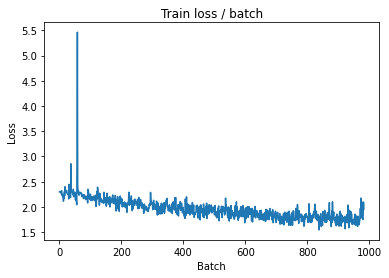


===============> Total time 16s	Avg loss 1.7836	Avg Prec@1 34.52 %	Avg Prec@5 86.42 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.6631 (1.6631)	Prec@1  42.2 ( 42.2)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.7017	Avg Prec@1 38.15 %	Avg Prec@5 88.17 %



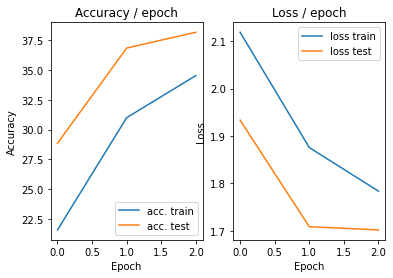

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 1.7599 (1.7599)	Prec@1  31.2 ( 31.2)	Prec@5  85.9 ( 85.9)


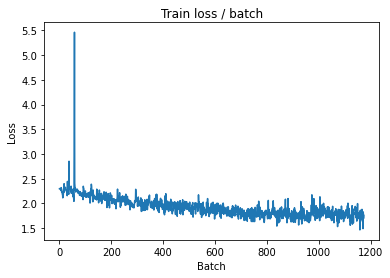

[TRAIN Batch 200/391]	Time 0.009s (0.042s)	Loss 1.7218 (1.7107)	Prec@1  33.6 ( 36.8)	Prec@5  87.5 ( 88.0)


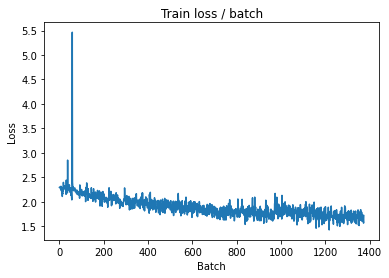


===============> Total time 16s	Avg loss 1.7219	Avg Prec@1 36.57 %	Avg Prec@5 87.62 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.5303 (1.5303)	Prec@1  45.3 ( 45.3)	Prec@5  90.6 ( 90.6)

===============> Total time 2s	Avg loss 1.6604	Avg Prec@1 39.16 %	Avg Prec@5 88.34 %



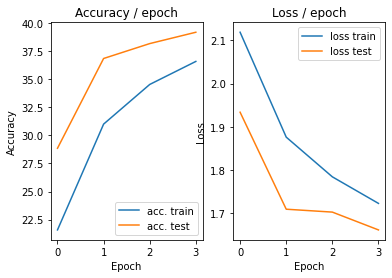

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 1.7153 (1.7153)	Prec@1  32.8 ( 32.8)	Prec@5  87.5 ( 87.5)


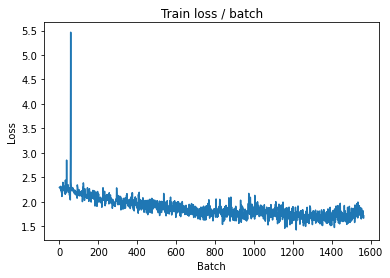

[TRAIN Batch 200/391]	Time 0.016s (0.042s)	Loss 1.7183 (1.6920)	Prec@1  38.3 ( 38.4)	Prec@5  87.5 ( 88.1)


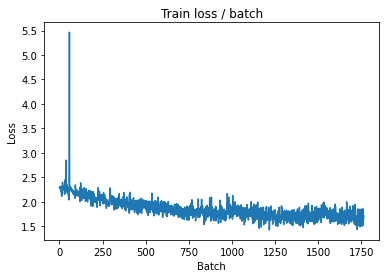


===============> Total time 16s	Avg loss 1.6949	Avg Prec@1 38.56 %	Avg Prec@5 88.12 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.5516 (1.5516)	Prec@1  39.1 ( 39.1)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.5710	Avg Prec@1 42.42 %	Avg Prec@5 90.09 %



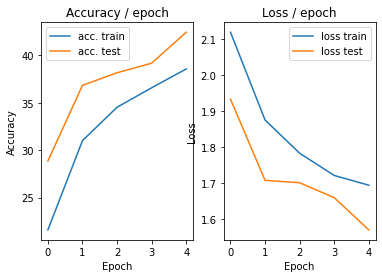

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.7400 (1.7400)	Prec@1  34.4 ( 34.4)	Prec@5  89.1 ( 89.1)


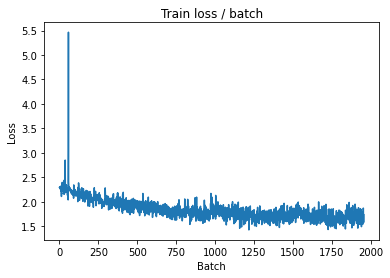

[TRAIN Batch 200/391]	Time 0.012s (0.043s)	Loss 1.6006 (1.6394)	Prec@1  41.4 ( 40.3)	Prec@5  87.5 ( 88.8)


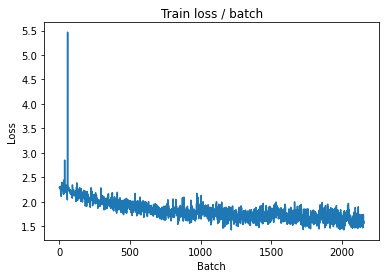


===============> Total time 16s	Avg loss 1.6384	Avg Prec@1 40.54 %	Avg Prec@5 88.82 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.5795 (1.5795)	Prec@1  44.5 ( 44.5)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.5890	Avg Prec@1 42.33 %	Avg Prec@5 88.82 %



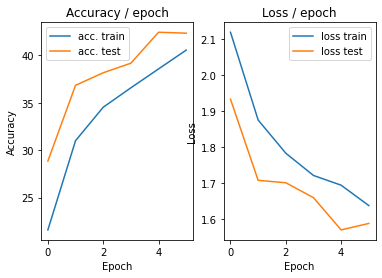

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.6856 (1.6856)	Prec@1  39.8 ( 39.8)	Prec@5  88.3 ( 88.3)


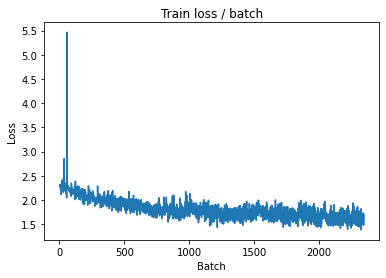

[TRAIN Batch 200/391]	Time 0.034s (0.042s)	Loss 1.5690 (1.6138)	Prec@1  42.2 ( 42.3)	Prec@5  89.1 ( 89.0)


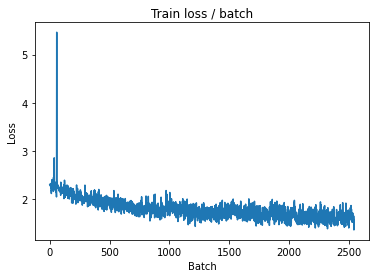


===============> Total time 16s	Avg loss 1.5930	Avg Prec@1 42.89 %	Avg Prec@5 89.58 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.5939 (1.5939)	Prec@1  40.6 ( 40.6)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.5341	Avg Prec@1 44.39 %	Avg Prec@5 90.22 %



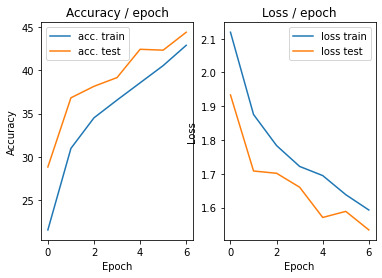

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 1.6356 (1.6356)	Prec@1  38.3 ( 38.3)	Prec@5  85.2 ( 85.2)


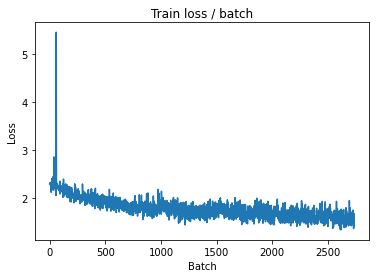

[TRAIN Batch 200/391]	Time 0.025s (0.041s)	Loss 1.5838 (1.5416)	Prec@1  41.4 ( 45.1)	Prec@5  92.2 ( 90.4)


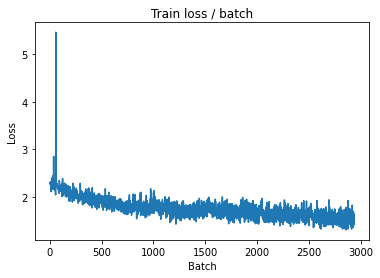


===============> Total time 16s	Avg loss 1.5428	Avg Prec@1 45.17 %	Avg Prec@5 90.34 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.4256 (1.4256)	Prec@1  50.8 ( 50.8)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.4635	Avg Prec@1 47.11 %	Avg Prec@5 91.75 %



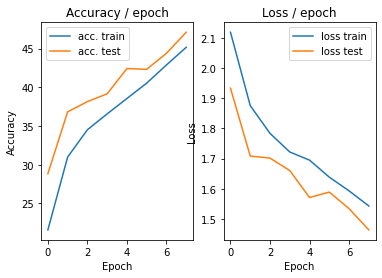

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 1.4407 (1.4407)	Prec@1  43.8 ( 43.8)	Prec@5  89.8 ( 89.8)


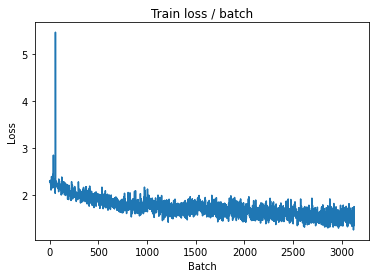

[TRAIN Batch 200/391]	Time 0.070s (0.041s)	Loss 1.5005 (1.4984)	Prec@1  40.6 ( 47.3)	Prec@5  90.6 ( 91.1)


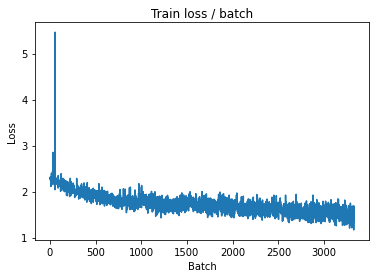


===============> Total time 16s	Avg loss 1.4868	Avg Prec@1 48.01 %	Avg Prec@5 91.07 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 1.3575 (1.3575)	Prec@1  51.6 ( 51.6)	Prec@5  93.0 ( 93.0)

===============> Total time 2s	Avg loss 1.4136	Avg Prec@1 50.98 %	Avg Prec@5 93.01 %



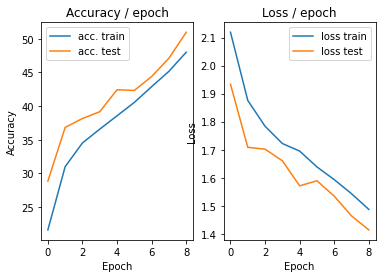

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.4098 (1.4098)	Prec@1  49.2 ( 49.2)	Prec@5  96.9 ( 96.9)


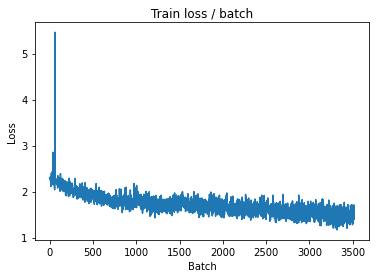

[TRAIN Batch 200/391]	Time 0.074s (0.042s)	Loss 1.6038 (1.4432)	Prec@1  44.5 ( 49.5)	Prec@5  89.1 ( 91.8)


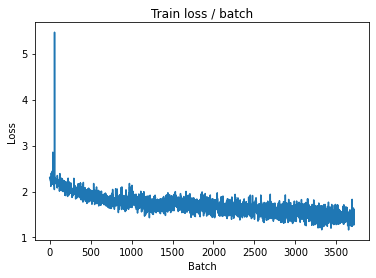


===============> Total time 16s	Avg loss 1.4424	Avg Prec@1 49.61 %	Avg Prec@5 91.86 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.3866 (1.3866)	Prec@1  52.3 ( 52.3)	Prec@5  88.3 ( 88.3)

===============> Total time 2s	Avg loss 1.3331	Avg Prec@1 53.18 %	Avg Prec@5 93.22 %



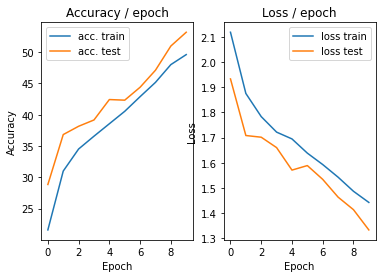

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 1.2739 (1.2739)	Prec@1  57.8 ( 57.8)	Prec@5  93.8 ( 93.8)


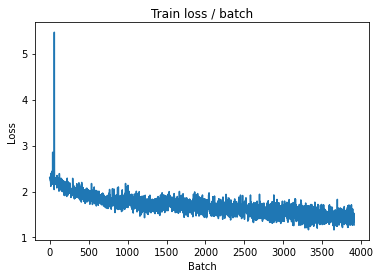

[TRAIN Batch 200/391]	Time 0.061s (0.042s)	Loss 1.4610 (1.4011)	Prec@1  51.6 ( 51.3)	Prec@5  90.6 ( 92.2)


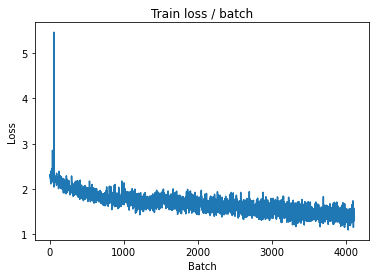


===============> Total time 16s	Avg loss 1.4047	Avg Prec@1 51.24 %	Avg Prec@5 91.99 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.3091 (1.3091)	Prec@1  52.3 ( 52.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.3636	Avg Prec@1 52.08 %	Avg Prec@5 92.40 %



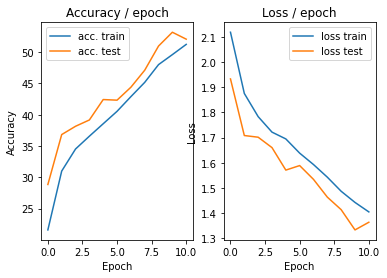

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 1.3146 (1.3146)	Prec@1  53.1 ( 53.1)	Prec@5  94.5 ( 94.5)


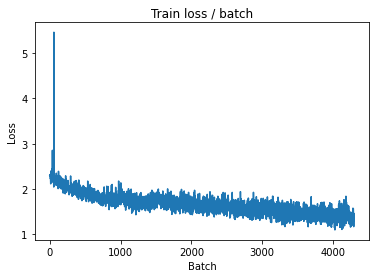

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 1.5528 (1.3717)	Prec@1  46.1 ( 52.2)	Prec@5  93.0 ( 92.4)


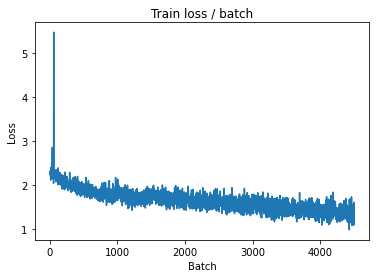


===============> Total time 16s	Avg loss 1.3596	Avg Prec@1 52.75 %	Avg Prec@5 92.67 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.3196 (1.3196)	Prec@1  60.2 ( 60.2)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2299	Avg Prec@1 57.52 %	Avg Prec@5 93.88 %



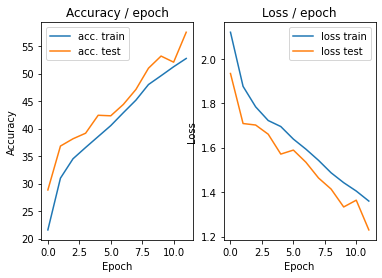

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 1.2205 (1.2205)	Prec@1  55.5 ( 55.5)	Prec@5  90.6 ( 90.6)


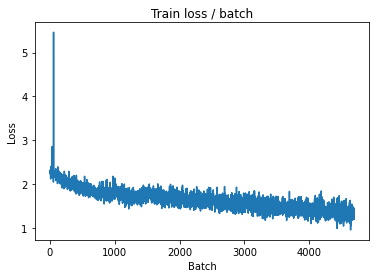

[TRAIN Batch 200/391]	Time 0.018s (0.042s)	Loss 1.2402 (1.3211)	Prec@1  63.3 ( 54.2)	Prec@5  95.3 ( 93.0)


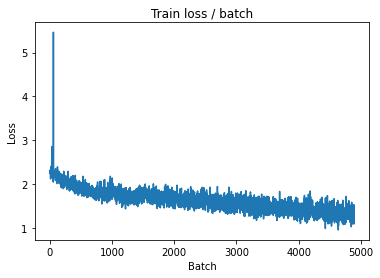


===============> Total time 16s	Avg loss 1.3217	Avg Prec@1 54.22 %	Avg Prec@5 92.99 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 1.1289 (1.1289)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1823	Avg Prec@1 59.18 %	Avg Prec@5 94.70 %



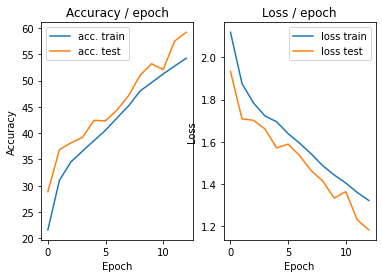

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 1.3944 (1.3944)	Prec@1  49.2 ( 49.2)	Prec@5  91.4 ( 91.4)


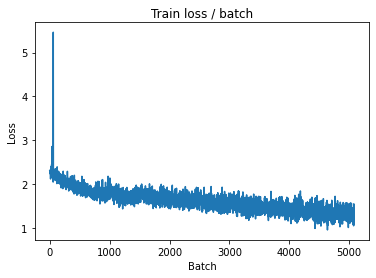

[TRAIN Batch 200/391]	Time 0.015s (0.042s)	Loss 1.1744 (1.3070)	Prec@1  60.9 ( 55.0)	Prec@5  93.0 ( 93.1)


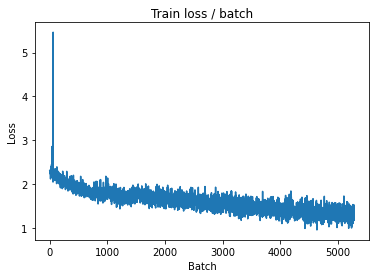


===============> Total time 16s	Avg loss 1.2957	Avg Prec@1 55.46 %	Avg Prec@5 93.19 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 1.2020 (1.2020)	Prec@1  60.2 ( 60.2)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.1938	Avg Prec@1 59.42 %	Avg Prec@5 94.01 %



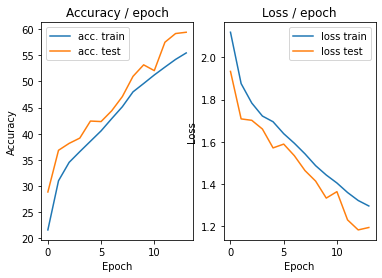

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 1.2495 (1.2495)	Prec@1  57.0 ( 57.0)	Prec@5  93.8 ( 93.8)


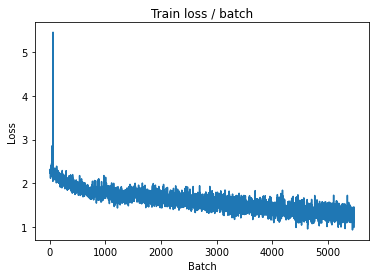

[TRAIN Batch 200/391]	Time 0.016s (0.041s)	Loss 1.0619 (1.2457)	Prec@1  64.1 ( 57.1)	Prec@5  91.4 ( 93.7)


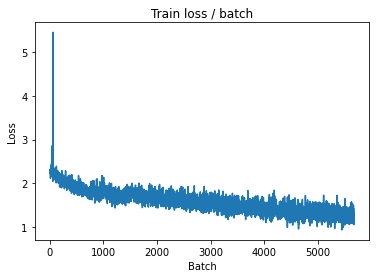


===============> Total time 16s	Avg loss 1.2579	Avg Prec@1 56.78 %	Avg Prec@5 93.71 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 1.2058 (1.2058)	Prec@1  64.1 ( 64.1)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.1687	Avg Prec@1 60.86 %	Avg Prec@5 95.11 %



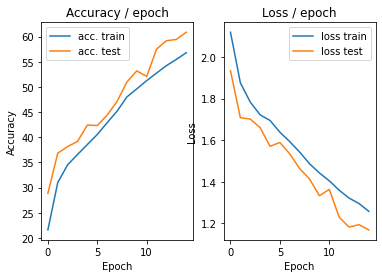

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 1.4052 (1.4052)	Prec@1  55.5 ( 55.5)	Prec@5  95.3 ( 95.3)


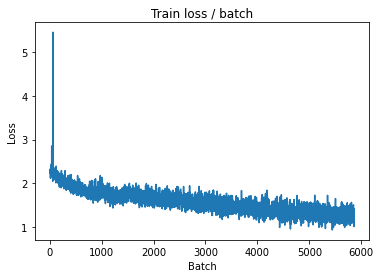

[TRAIN Batch 200/391]	Time 0.045s (0.042s)	Loss 1.2422 (1.2202)	Prec@1  55.5 ( 58.2)	Prec@5  92.2 ( 94.2)


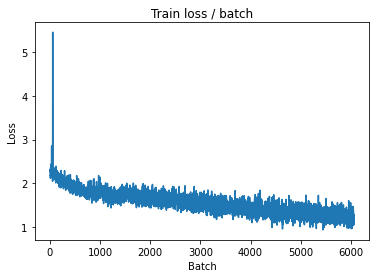


===============> Total time 16s	Avg loss 1.2119	Avg Prec@1 58.35 %	Avg Prec@5 94.25 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 1.1178 (1.1178)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.1869	Avg Prec@1 59.04 %	Avg Prec@5 94.40 %



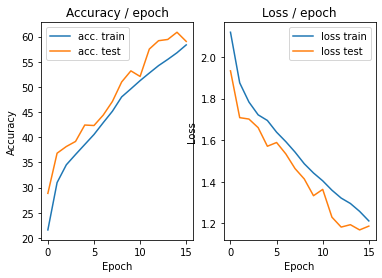

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 1.3842 (1.3842)	Prec@1  53.1 ( 53.1)	Prec@5  92.2 ( 92.2)


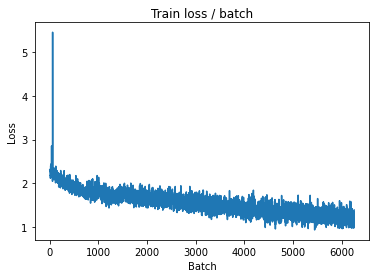

[TRAIN Batch 200/391]	Time 0.065s (0.042s)	Loss 0.8949 (1.1794)	Prec@1  65.6 ( 59.7)	Prec@5  96.9 ( 94.5)


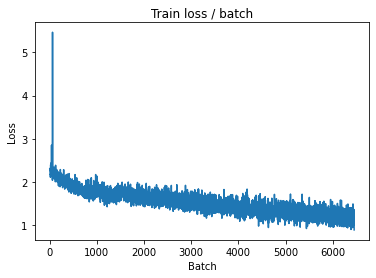


===============> Total time 16s	Avg loss 1.1799	Avg Prec@1 59.75 %	Avg Prec@5 94.54 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.0574 (1.0574)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0867	Avg Prec@1 63.38 %	Avg Prec@5 95.42 %



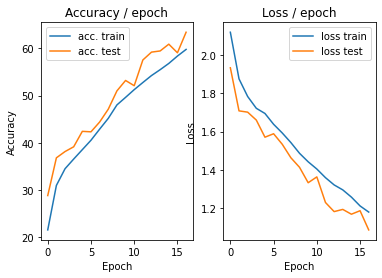

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.0529 (1.0529)	Prec@1  61.7 ( 61.7)	Prec@5  96.9 ( 96.9)


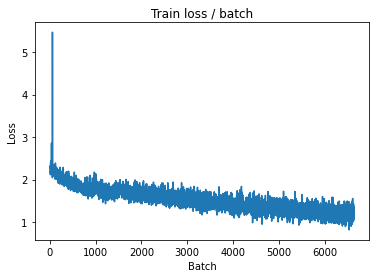

[TRAIN Batch 200/391]	Time 0.058s (0.041s)	Loss 1.2798 (1.1591)	Prec@1  53.9 ( 60.4)	Prec@5  93.0 ( 95.1)


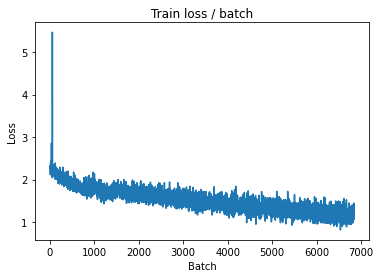


===============> Total time 16s	Avg loss 1.1445	Avg Prec@1 60.92 %	Avg Prec@5 94.96 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 1.0258 (1.0258)	Prec@1  65.6 ( 65.6)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1174	Avg Prec@1 62.81 %	Avg Prec@5 95.27 %



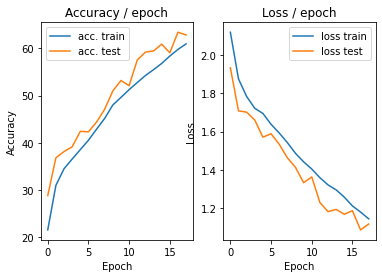

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 1.2023 (1.2023)	Prec@1  60.2 ( 60.2)	Prec@5  93.0 ( 93.0)


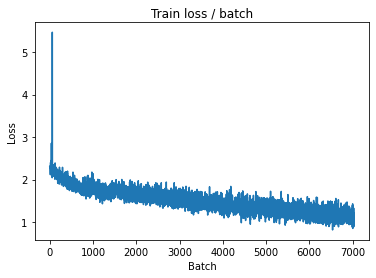

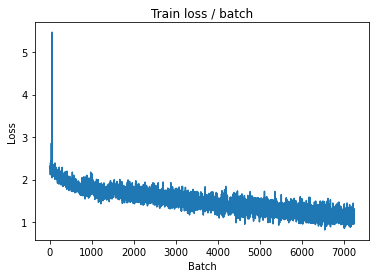


===============> Total time 16s	Avg loss 1.1184	Avg Prec@1 62.11 %	Avg Prec@5 95.13 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.9906 (0.9906)	Prec@1  66.4 ( 66.4)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.0443	Avg Prec@1 64.95 %	Avg Prec@5 95.94 %



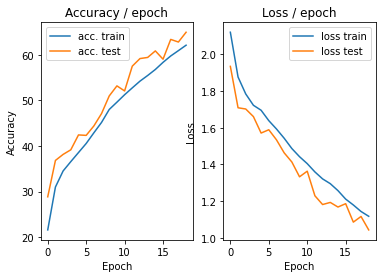

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 1.0423 (1.0423)	Prec@1  60.9 ( 60.9)	Prec@5  94.5 ( 94.5)


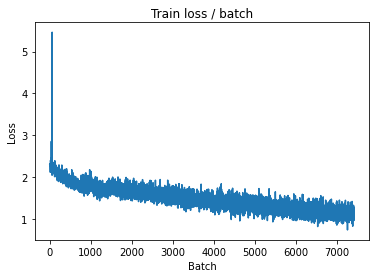

[TRAIN Batch 200/391]	Time 0.053s (0.042s)	Loss 1.0490 (1.0695)	Prec@1  69.5 ( 63.3)	Prec@5  96.1 ( 95.6)


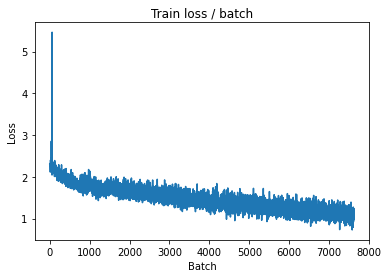


===============> Total time 16s	Avg loss 1.0750	Avg Prec@1 63.14 %	Avg Prec@5 95.47 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.9603 (0.9603)	Prec@1  66.4 ( 66.4)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0116	Avg Prec@1 65.62 %	Avg Prec@5 95.97 %



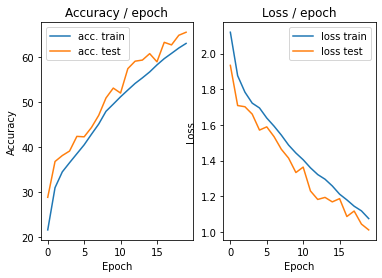

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 1.1778 (1.1778)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)


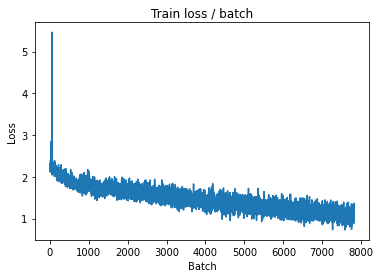

[TRAIN Batch 200/391]	Time 0.079s (0.042s)	Loss 1.0312 (1.0636)	Prec@1  62.5 ( 63.9)	Prec@5  96.1 ( 95.7)


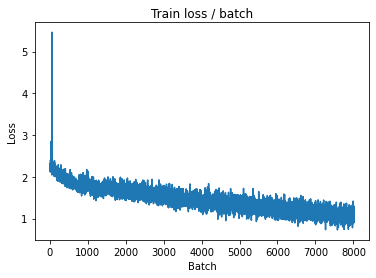


===============> Total time 16s	Avg loss 1.0474	Avg Prec@1 64.32 %	Avg Prec@5 95.77 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.9446 (0.9446)	Prec@1  69.5 ( 69.5)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.0193	Avg Prec@1 64.70 %	Avg Prec@5 95.98 %



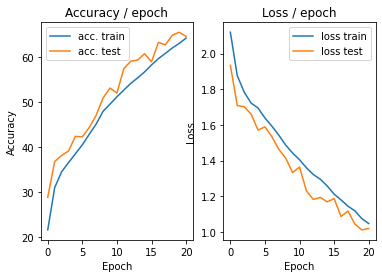

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.7468 (0.7468)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)


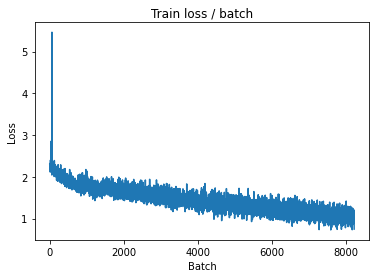

[TRAIN Batch 200/391]	Time 0.013s (0.042s)	Loss 1.1324 (1.0395)	Prec@1  61.7 ( 64.8)	Prec@5  94.5 ( 95.7)


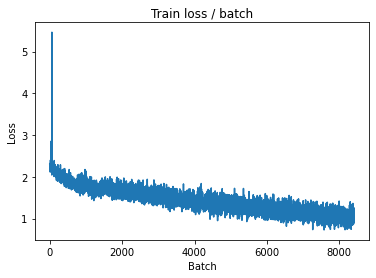


===============> Total time 16s	Avg loss 1.0281	Avg Prec@1 65.06 %	Avg Prec@5 95.77 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.9421 (0.9421)	Prec@1  75.0 ( 75.0)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9712	Avg Prec@1 68.18 %	Avg Prec@5 96.68 %



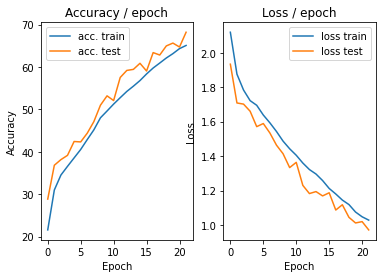

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 1.1009 (1.1009)	Prec@1  61.7 ( 61.7)	Prec@5  93.0 ( 93.0)


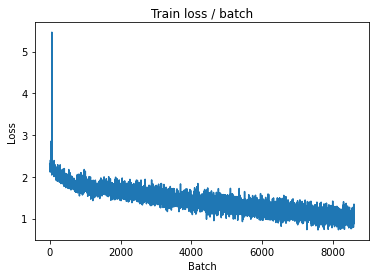

[TRAIN Batch 200/391]	Time 0.015s (0.041s)	Loss 0.8852 (0.9863)	Prec@1  68.8 ( 66.5)	Prec@5  98.4 ( 96.3)


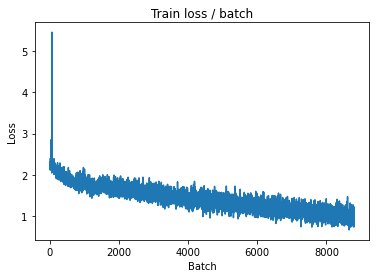


===============> Total time 16s	Avg loss 0.9866	Avg Prec@1 66.53 %	Avg Prec@5 96.23 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.9209 (0.9209)	Prec@1  68.0 ( 68.0)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9470	Avg Prec@1 69.07 %	Avg Prec@5 96.39 %



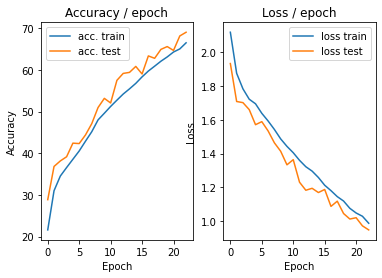

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.1379 (1.1379)	Prec@1  59.4 ( 59.4)	Prec@5  96.9 ( 96.9)


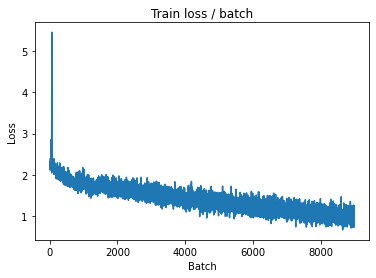

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 0.9067 (0.9552)	Prec@1  68.8 ( 67.6)	Prec@5  97.7 ( 96.5)


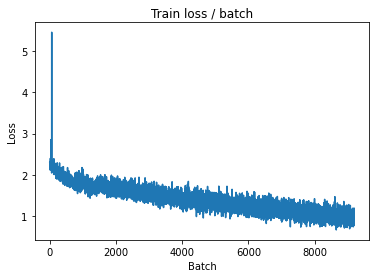


===============> Total time 16s	Avg loss 0.9644	Avg Prec@1 67.22 %	Avg Prec@5 96.30 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.8909 (0.8909)	Prec@1  74.2 ( 74.2)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 0.9231	Avg Prec@1 69.00 %	Avg Prec@5 96.51 %



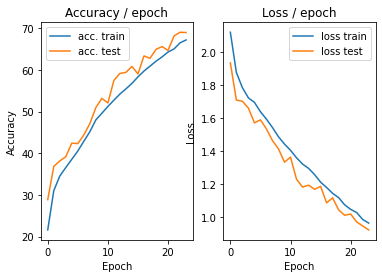

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 1.0810 (1.0810)	Prec@1  64.8 ( 64.8)	Prec@5  95.3 ( 95.3)


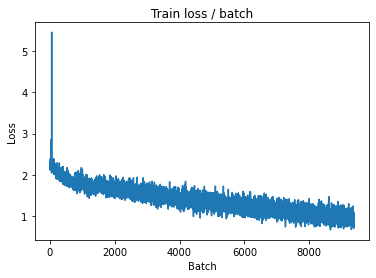

[TRAIN Batch 200/391]	Time 0.064s (0.043s)	Loss 0.8986 (0.9457)	Prec@1  66.4 ( 67.8)	Prec@5  96.9 ( 96.6)


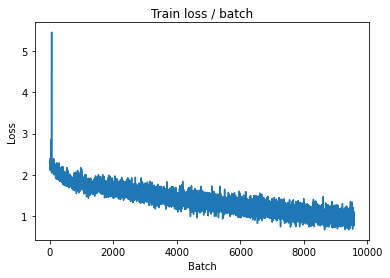


===============> Total time 16s	Avg loss 0.9412	Avg Prec@1 68.15 %	Avg Prec@5 96.55 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 0.8329 (0.8329)	Prec@1  75.0 ( 75.0)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9090	Avg Prec@1 69.44 %	Avg Prec@5 96.69 %



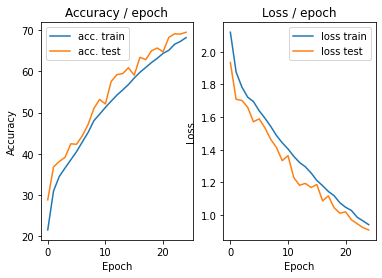

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.8658 (0.8658)	Prec@1  68.0 ( 68.0)	Prec@5  96.1 ( 96.1)


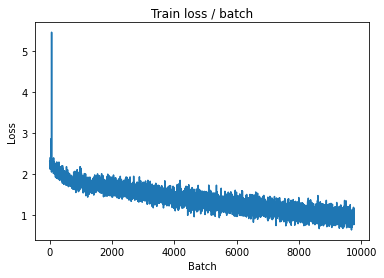

[TRAIN Batch 200/391]	Time 0.014s (0.041s)	Loss 0.9257 (0.9190)	Prec@1  68.0 ( 68.6)	Prec@5  96.9 ( 96.9)


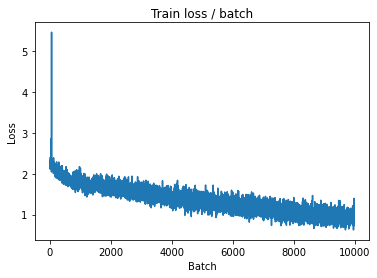


===============> Total time 16s	Avg loss 0.9210	Avg Prec@1 68.76 %	Avg Prec@5 96.72 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.9050 (0.9050)	Prec@1  71.9 ( 71.9)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 0.8860	Avg Prec@1 70.46 %	Avg Prec@5 96.90 %



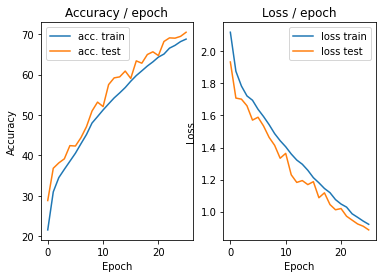

In [ ]:
maindrop(128, 0.1, cuda=True)

#Batch normalization

In [3]:
class  AlexNetBatch(nn.Module):
    """
    Cette classe contient la structure du réseau de neurones
    """

    def __init__(self):
        super(AlexNetBatch, self).__init__()
        # On défini d'abord les couches de convolution et de pooling comme un
        # groupe de couches `self.features`
        self.features =  nn.Sequential(
            nn.Conv2d(3, 32, 5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2, padding=0),
            nn.Conv2d(32, 64, 5, stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2, padding=0),
            nn.Conv2d(64, 64, 5, stride=1, padding=2),
            nn.BatchNorm2d(64),            
            nn.ReLU(),
            nn.MaxPool2d(2, stride=2, padding=0, ceil_mode=True)
        )

        # On défini les couches fully connected comme un groupe de couches
        # `self.classifier`
        self.classifier = nn.Sequential(
            nn.Linear(4*4*64, 1000),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1000, 10),
            # Rappel : Le softmax est inclus dans la loss, ne pas le mettre ici
        )

    # méthode appelée quand on applique le réseau à un batch d'input
    def forward(self, input):
        bsize = input.size(0) # taille du batch
        output = self.features(input) # on calcule la sortie des conv
        output = output.view(bsize, -1) # on applati les feature map 2D en un
                                        # vecteur 1D pour chaque input
        output = self.classifier(output) # on calcule la sortie des fc
        return output



def get_dataset(batch_size, cuda=False):
    """
    Cette fonction charge le dataset et effectue des transformations sur chaqu
    image (listées dans `transform=...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize((.491, .482, .447), (.202, .199, .201)),
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(size=28),
            transforms.ToTensor(),
            transforms.Normalize( mean=[0.491, 0.482, 0.447],
                                           std=[0.202, 0.199, 0.201])
            ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Fait une passe (appelée epoch en anglais) sur les données `data` avec le
    modèle `model`. Evalue `criterion` comme loss.
    Si `optimizer` est fourni, effectue une epoch d'apprentissage en utilisant
    l'optimiseur donné, sinon, effectue une epoch d'évaluation (pas de backward)
    du modèle.
    """

    # indique si le modele est en mode eval ou train (certaines couches se
    # comportent différemment en train et en eval)
    model.eval() if optimizer is None else model.train()

    # objets pour stocker les moyennes des metriques
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # on itere sur les batchs du dataset
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # si on fait du GPU, passage en CUDA
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward si on est en "train"
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # calcul des metriques
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # mise a jour des moyennes
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # affichage des infos
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Affichage des infos sur l'epoch
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def mainbatch(batch_size=128, lr=0.1, epochs=26, cuda=False):

    # ex de params :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}
    
    # define model, loss, optim
    model =  AlexNetBatch()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(),lr,momentum=0.9)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)


    if cuda: # si on fait du GPU, passage en CUDA
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # On récupère les données
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # On itère sur les epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Phase de train
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Phase d'evaluation
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        lr_sched.step()
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 2.3354 (2.3354)	Prec@1  13.3 ( 13.3)	Prec@5  50.0 ( 50.0)


<Figure size 432x288 with 0 Axes>

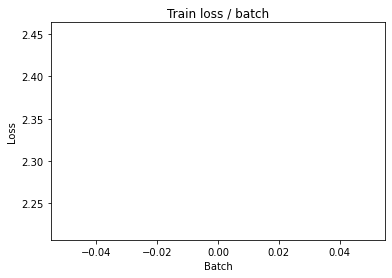

[TRAIN Batch 200/391]	Time 0.059s (0.043s)	Loss 1.6922 (1.7772)	Prec@1  39.1 ( 34.6)	Prec@5  90.6 ( 86.4)


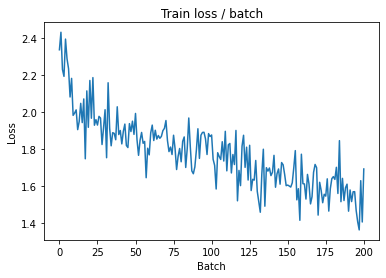


===============> Total time 16s	Avg loss 1.6190	Avg Prec@1 40.99 %	Avg Prec@5 89.39 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.4474 (1.4474)	Prec@1  48.4 ( 48.4)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.3388	Avg Prec@1 52.24 %	Avg Prec@5 93.26 %



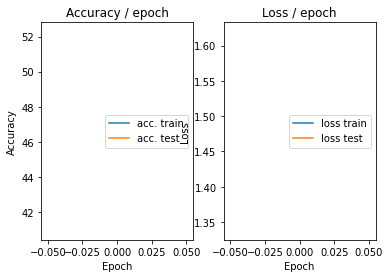

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.192s (0.192s)	Loss 1.2621 (1.2621)	Prec@1  50.0 ( 50.0)	Prec@5  95.3 ( 95.3)


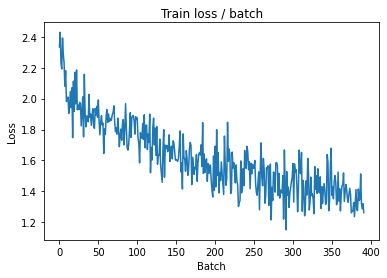

[TRAIN Batch 200/391]	Time 0.072s (0.043s)	Loss 1.1249 (1.2570)	Prec@1  57.8 ( 55.2)	Prec@5  96.1 ( 94.4)


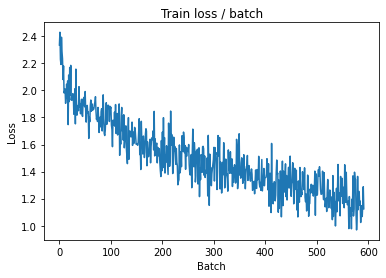


===============> Total time 16s	Avg loss 1.1981	Avg Prec@1 57.45 %	Avg Prec@5 94.90 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.0556 (1.0556)	Prec@1  67.2 ( 67.2)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0524	Avg Prec@1 62.75 %	Avg Prec@5 96.20 %



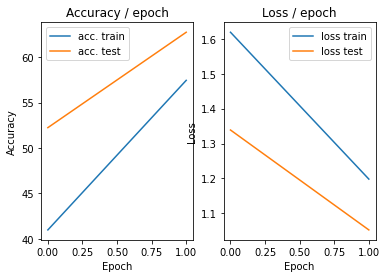

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.9716 (0.9716)	Prec@1  60.9 ( 60.9)	Prec@5  99.2 ( 99.2)


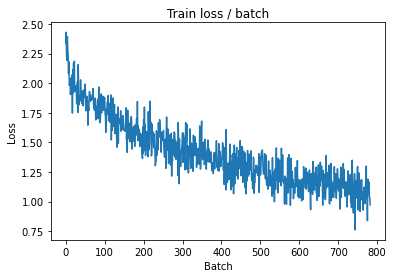

[TRAIN Batch 200/391]	Time 0.063s (0.042s)	Loss 0.9881 (1.0195)	Prec@1  64.8 ( 64.1)	Prec@5  96.9 ( 96.5)


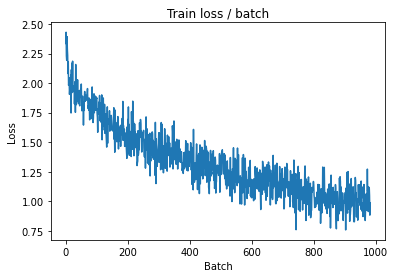


===============> Total time 16s	Avg loss 1.0032	Avg Prec@1 65.04 %	Avg Prec@5 96.55 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.7962 (0.7962)	Prec@1  78.1 ( 78.1)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 0.9413	Avg Prec@1 66.52 %	Avg Prec@5 97.13 %



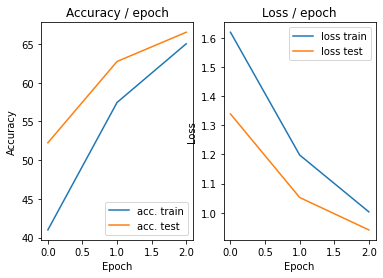

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.9990 (0.9990)	Prec@1  68.8 ( 68.8)	Prec@5  96.1 ( 96.1)


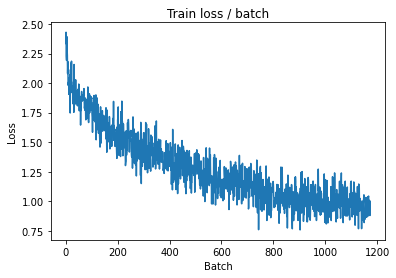

[TRAIN Batch 200/391]	Time 0.068s (0.043s)	Loss 0.7393 (0.8901)	Prec@1  72.7 ( 68.8)	Prec@5  98.4 ( 97.3)


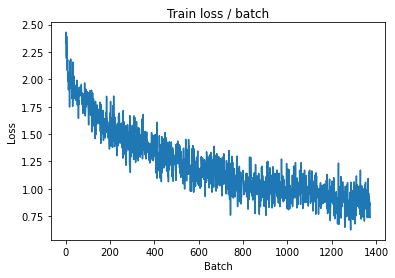


===============> Total time 16s	Avg loss 0.8823	Avg Prec@1 69.15 %	Avg Prec@5 97.35 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.7735 (0.7735)	Prec@1  73.4 ( 73.4)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.8096	Avg Prec@1 71.81 %	Avg Prec@5 97.62 %



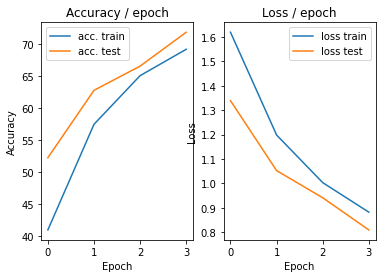

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.8750 (0.8750)	Prec@1  64.8 ( 64.8)	Prec@5  98.4 ( 98.4)


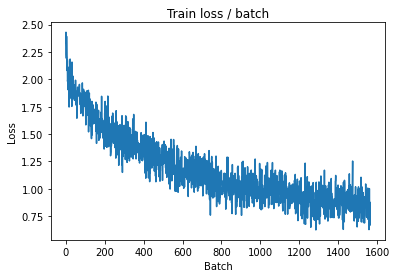

[TRAIN Batch 200/391]	Time 0.018s (0.043s)	Loss 0.9122 (0.8108)	Prec@1  67.2 ( 72.1)	Prec@5  98.4 ( 97.5)


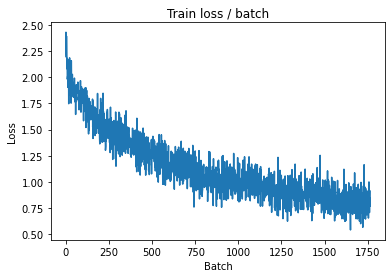


===============> Total time 16s	Avg loss 0.8045	Avg Prec@1 72.18 %	Avg Prec@5 97.66 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.7189 (0.7189)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7810	Avg Prec@1 73.66 %	Avg Prec@5 97.82 %



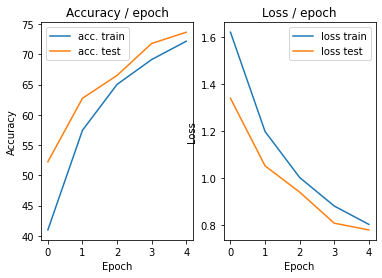

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.7150 (0.7150)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)


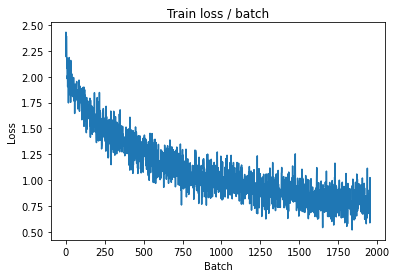

[TRAIN Batch 200/391]	Time 0.017s (0.044s)	Loss 0.6691 (0.7536)	Prec@1  77.3 ( 74.0)	Prec@5  98.4 ( 98.0)


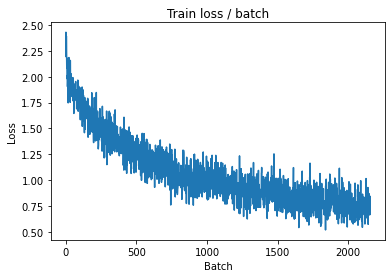


===============> Total time 16s	Avg loss 0.7431	Avg Prec@1 74.47 %	Avg Prec@5 98.02 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.6740 (0.6740)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7121	Avg Prec@1 75.68 %	Avg Prec@5 98.18 %



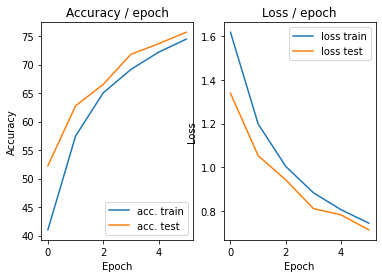

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 0.7246 (0.7246)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)


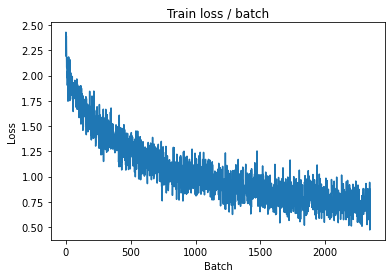

[TRAIN Batch 200/391]	Time 0.074s (0.042s)	Loss 0.6896 (0.7104)	Prec@1  75.0 ( 75.3)	Prec@5  96.9 ( 98.2)


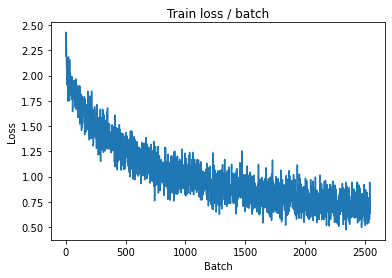


===============> Total time 16s	Avg loss 0.7074	Avg Prec@1 75.35 %	Avg Prec@5 98.26 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.6240 (0.6240)	Prec@1  83.6 ( 83.6)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6736	Avg Prec@1 77.32 %	Avg Prec@5 98.44 %



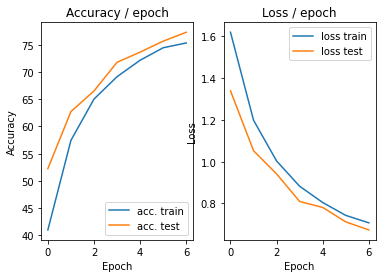

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 0.6007 (0.6007)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)


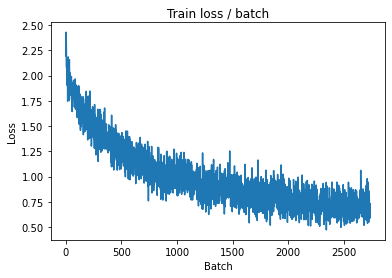

[TRAIN Batch 200/391]	Time 0.068s (0.043s)	Loss 0.5843 (0.6559)	Prec@1  78.9 ( 77.3)	Prec@5  96.9 ( 98.5)


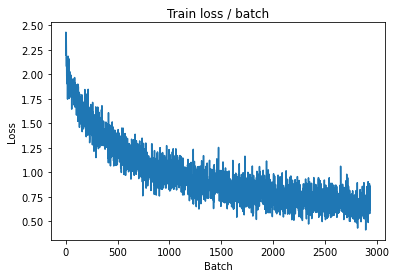


===============> Total time 16s	Avg loss 0.6543	Avg Prec@1 77.36 %	Avg Prec@5 98.47 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.5457 (0.5457)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6454	Avg Prec@1 77.76 %	Avg Prec@5 98.56 %



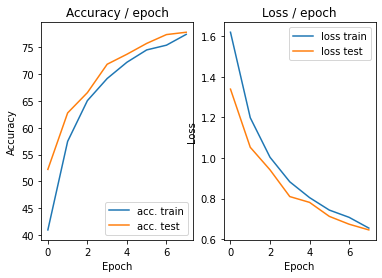

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.5624 (0.5624)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


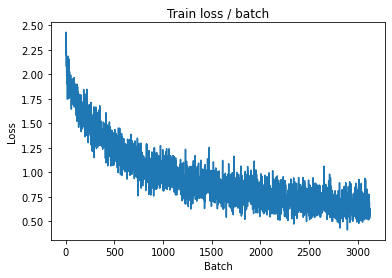

[TRAIN Batch 200/391]	Time 0.043s (0.043s)	Loss 0.8165 (0.6289)	Prec@1  72.7 ( 78.4)	Prec@5  96.9 ( 98.6)


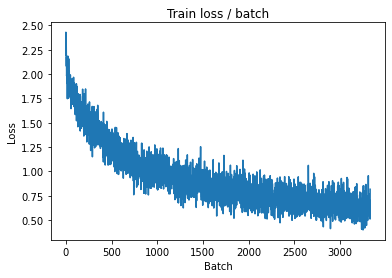


===============> Total time 16s	Avg loss 0.6259	Avg Prec@1 78.60 %	Avg Prec@5 98.59 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.5888 (0.5888)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6105	Avg Prec@1 79.06 %	Avg Prec@5 98.62 %



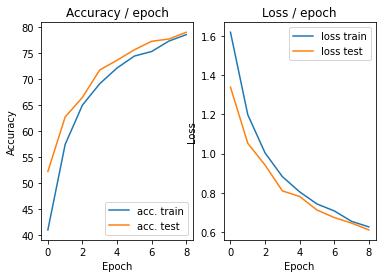

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.6037 (0.6037)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)


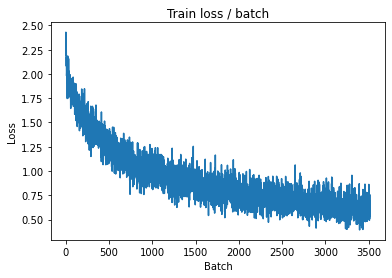

[TRAIN Batch 200/391]	Time 0.070s (0.043s)	Loss 0.5542 (0.5840)	Prec@1  79.7 ( 79.9)	Prec@5 100.0 ( 98.9)


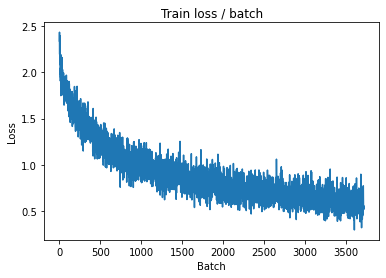


===============> Total time 16s	Avg loss 0.5928	Avg Prec@1 79.52 %	Avg Prec@5 98.78 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.6291 (0.6291)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6039	Avg Prec@1 79.07 %	Avg Prec@5 98.83 %



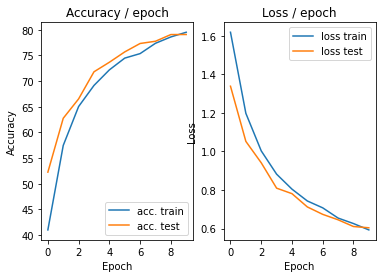

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.5431 (0.5431)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)


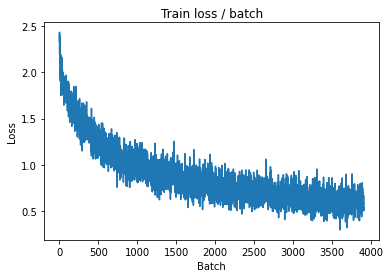

[TRAIN Batch 200/391]	Time 0.045s (0.043s)	Loss 0.6340 (0.5723)	Prec@1  78.9 ( 80.2)	Prec@5  99.2 ( 98.9)


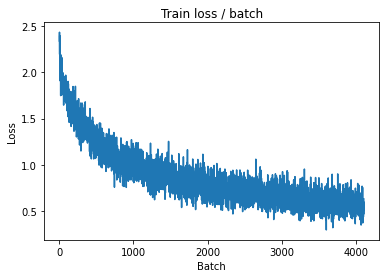


===============> Total time 16s	Avg loss 0.5719	Avg Prec@1 80.21 %	Avg Prec@5 98.91 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.5660 (0.5660)	Prec@1  82.8 ( 82.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5933	Avg Prec@1 79.99 %	Avg Prec@5 98.67 %



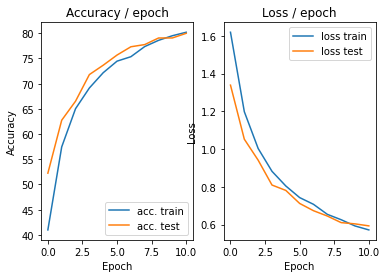

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.6230 (0.6230)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


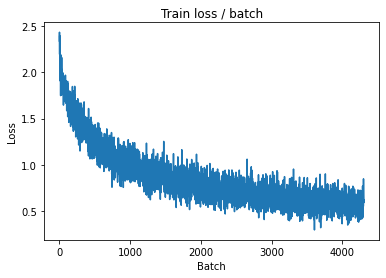

[TRAIN Batch 200/391]	Time 0.057s (0.043s)	Loss 0.5474 (0.5347)	Prec@1  80.5 ( 81.6)	Prec@5 100.0 ( 99.1)


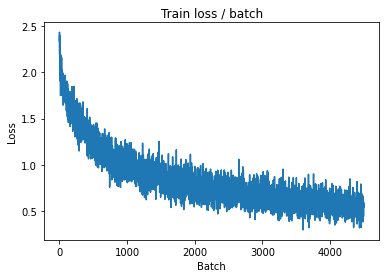


===============> Total time 16s	Avg loss 0.5388	Avg Prec@1 81.42 %	Avg Prec@5 99.09 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.5112 (0.5112)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5623	Avg Prec@1 80.70 %	Avg Prec@5 98.93 %



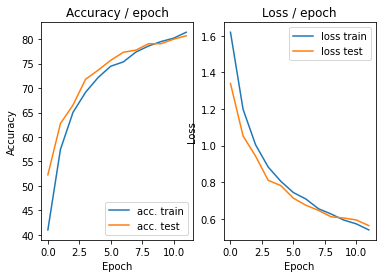

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.5207 (0.5207)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)


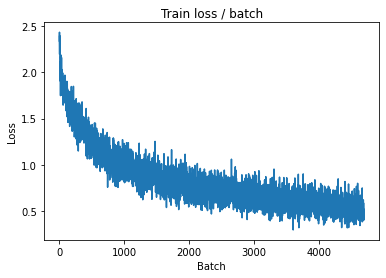

[TRAIN Batch 200/391]	Time 0.030s (0.042s)	Loss 0.6641 (0.5232)	Prec@1  73.4 ( 81.9)	Prec@5 100.0 ( 99.0)


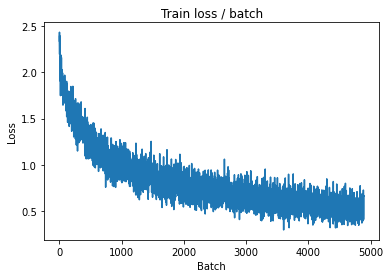


===============> Total time 16s	Avg loss 0.5218	Avg Prec@1 81.90 %	Avg Prec@5 99.05 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 0.4879 (0.4879)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5538	Avg Prec@1 81.41 %	Avg Prec@5 98.90 %



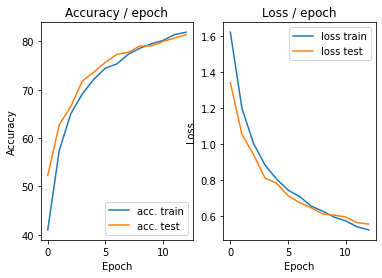

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.5013 (0.5013)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


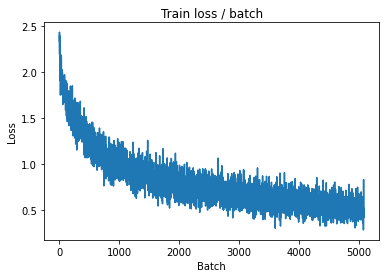

[TRAIN Batch 200/391]	Time 0.070s (0.043s)	Loss 0.4511 (0.4995)	Prec@1  85.9 ( 82.8)	Prec@5 100.0 ( 99.1)


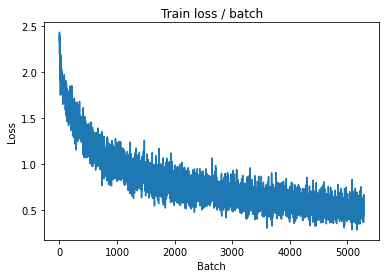


===============> Total time 16s	Avg loss 0.4986	Avg Prec@1 82.93 %	Avg Prec@5 99.12 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.5573 (0.5573)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5640	Avg Prec@1 81.18 %	Avg Prec@5 98.91 %



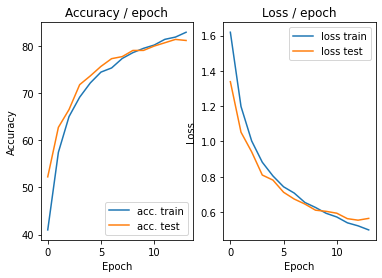

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.5325 (0.5325)	Prec@1  81.2 ( 81.2)	Prec@5  96.9 ( 96.9)


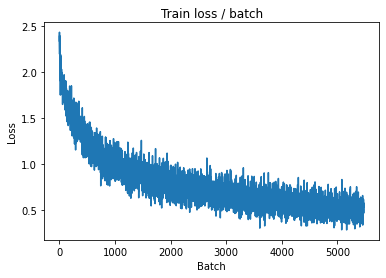

[TRAIN Batch 200/391]	Time 0.071s (0.043s)	Loss 0.5086 (0.4807)	Prec@1  82.8 ( 83.3)	Prec@5 100.0 ( 99.1)


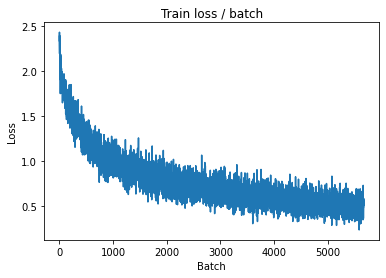


===============> Total time 16s	Avg loss 0.4800	Avg Prec@1 83.38 %	Avg Prec@5 99.17 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.4741 (0.4741)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5495	Avg Prec@1 81.42 %	Avg Prec@5 99.00 %



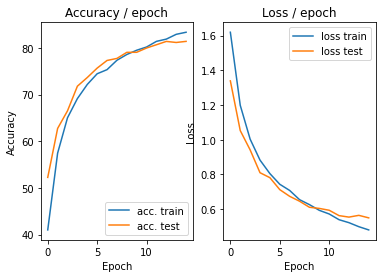

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.211s (0.211s)	Loss 0.3619 (0.3619)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


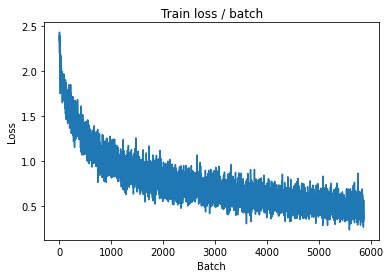

[TRAIN Batch 200/391]	Time 0.017s (0.042s)	Loss 0.5501 (0.4633)	Prec@1  83.6 ( 83.9)	Prec@5  99.2 ( 99.3)


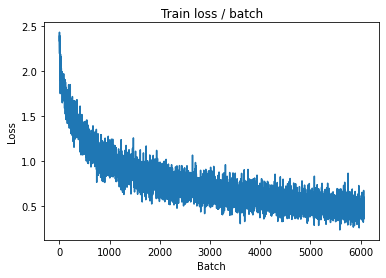


===============> Total time 16s	Avg loss 0.4644	Avg Prec@1 83.81 %	Avg Prec@5 99.28 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.5593 (0.5593)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5512	Avg Prec@1 81.84 %	Avg Prec@5 99.01 %



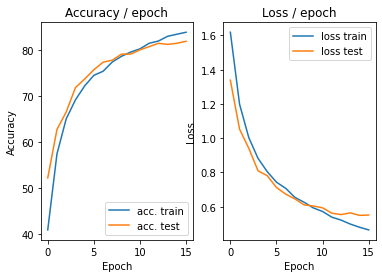

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 0.5628 (0.5628)	Prec@1  79.7 ( 79.7)	Prec@5  99.2 ( 99.2)


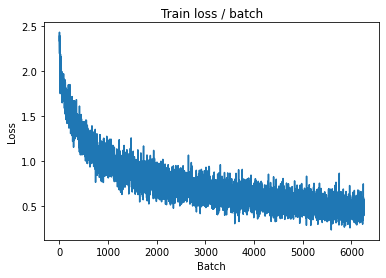

[TRAIN Batch 200/391]	Time 0.041s (0.042s)	Loss 0.4712 (0.4460)	Prec@1  84.4 ( 84.6)	Prec@5  98.4 ( 99.3)


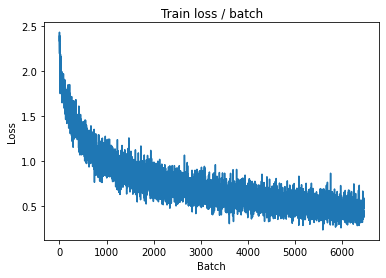


===============> Total time 16s	Avg loss 0.4486	Avg Prec@1 84.38 %	Avg Prec@5 99.33 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.4032 (0.4032)	Prec@1  90.6 ( 90.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5219	Avg Prec@1 82.34 %	Avg Prec@5 98.94 %



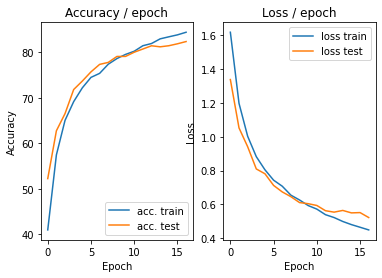

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.4420 (0.4420)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


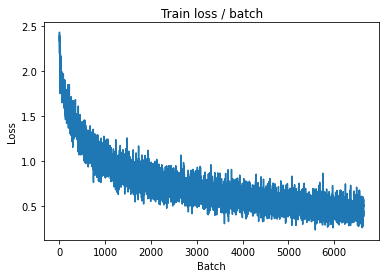

[TRAIN Batch 200/391]	Time 0.019s (0.043s)	Loss 0.4361 (0.4332)	Prec@1  83.6 ( 85.0)	Prec@5  99.2 ( 99.3)


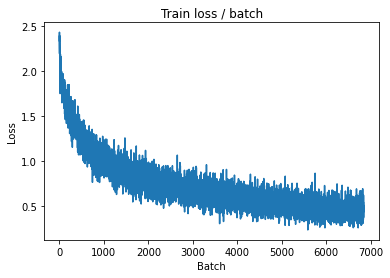


===============> Total time 16s	Avg loss 0.4338	Avg Prec@1 84.92 %	Avg Prec@5 99.35 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.4274 (0.4274)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5255	Avg Prec@1 82.53 %	Avg Prec@5 99.08 %



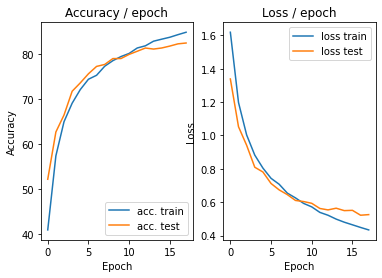

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 0.4791 (0.4791)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)


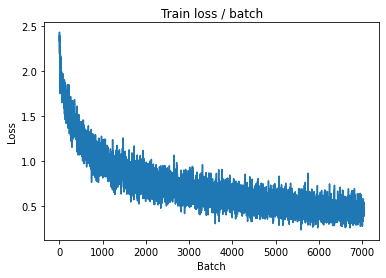

[TRAIN Batch 200/391]	Time 0.015s (0.042s)	Loss 0.3973 (0.4130)	Prec@1  89.8 ( 85.6)	Prec@5  99.2 ( 99.5)


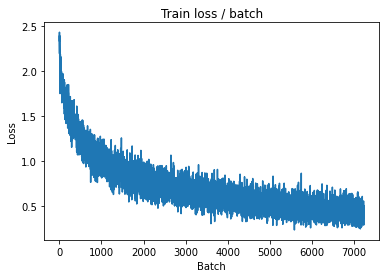

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.5023 (0.5023)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5131	Avg Prec@1 82.77 %	Avg Prec@5 98.98 %



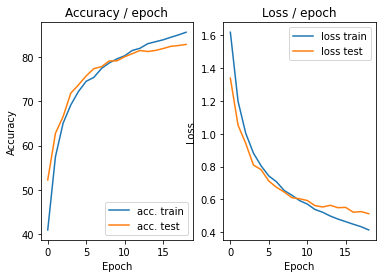

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.2726 (0.2726)	Prec@1  92.2 ( 92.2)	Prec@5 100.0 (100.0)


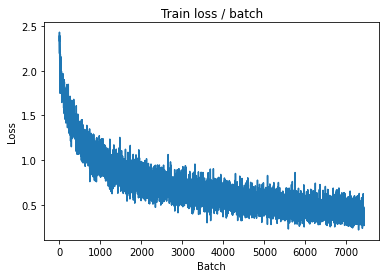

[TRAIN Batch 200/391]	Time 0.056s (0.043s)	Loss 0.3467 (0.3869)	Prec@1  85.2 ( 86.6)	Prec@5  98.4 ( 99.5)


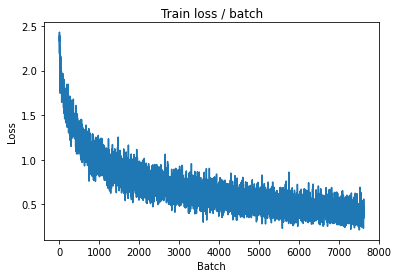


===============> Total time 16s	Avg loss 0.4023	Avg Prec@1 86.05 %	Avg Prec@5 99.47 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.4375 (0.4375)	Prec@1  85.9 ( 85.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5221	Avg Prec@1 82.79 %	Avg Prec@5 99.08 %



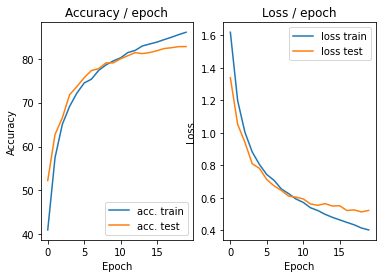

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.3269 (0.3269)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)


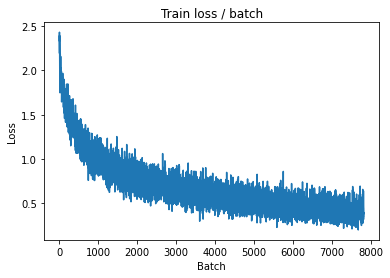

[TRAIN Batch 200/391]	Time 0.008s (0.042s)	Loss 0.3501 (0.3900)	Prec@1  89.8 ( 86.5)	Prec@5  99.2 ( 99.6)


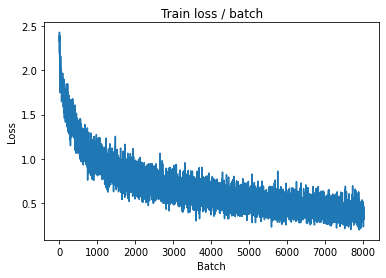


===============> Total time 16s	Avg loss 0.3952	Avg Prec@1 86.30 %	Avg Prec@5 99.47 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.3874 (0.3874)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5129	Avg Prec@1 83.12 %	Avg Prec@5 99.05 %



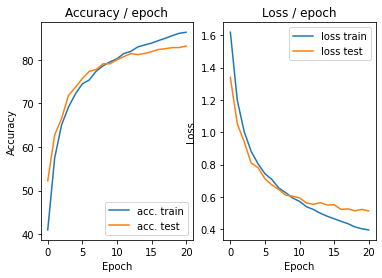

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.3586 (0.3586)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)


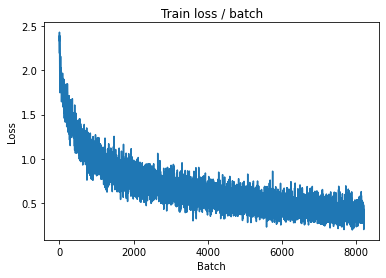

[TRAIN Batch 200/391]	Time 0.069s (0.043s)	Loss 0.1712 (0.3723)	Prec@1  94.5 ( 87.0)	Prec@5 100.0 ( 99.6)


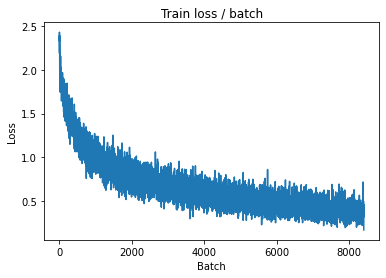


===============> Total time 16s	Avg loss 0.3768	Avg Prec@1 86.80 %	Avg Prec@5 99.54 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.4294 (0.4294)	Prec@1  87.5 ( 87.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.4991	Avg Prec@1 84.05 %	Avg Prec@5 99.15 %



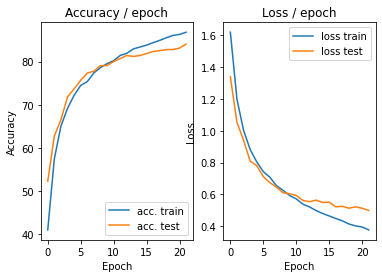

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.3186 (0.3186)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)


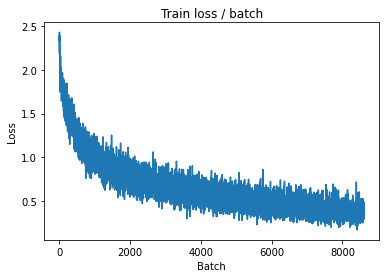

[TRAIN Batch 200/391]	Time 0.051s (0.042s)	Loss 0.4146 (0.3663)	Prec@1  80.5 ( 87.1)	Prec@5  99.2 ( 99.6)


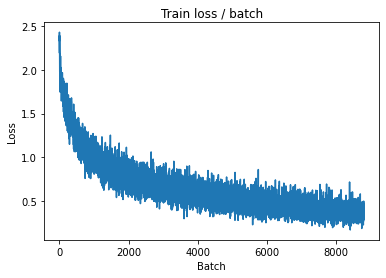


===============> Total time 16s	Avg loss 0.3687	Avg Prec@1 87.01 %	Avg Prec@5 99.56 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.4251 (0.4251)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4997	Avg Prec@1 83.70 %	Avg Prec@5 99.08 %



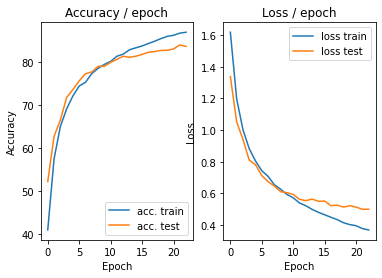

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.2033 (0.2033)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


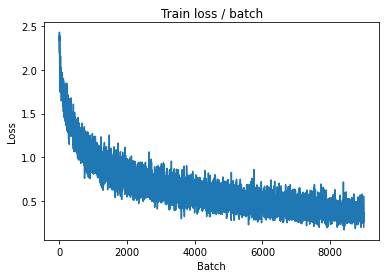

[TRAIN Batch 200/391]	Time 0.050s (0.042s)	Loss 0.3620 (0.3464)	Prec@1  86.7 ( 87.8)	Prec@5 100.0 ( 99.6)


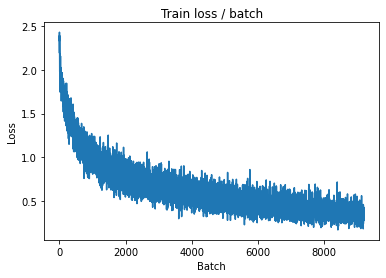


===============> Total time 16s	Avg loss 0.3556	Avg Prec@1 87.49 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.4682 (0.4682)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4996	Avg Prec@1 84.12 %	Avg Prec@5 99.09 %



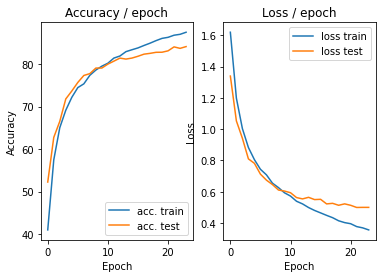

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.182s (0.182s)	Loss 0.4258 (0.4258)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


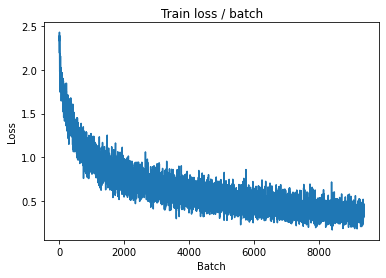

[TRAIN Batch 200/391]	Time 0.017s (0.042s)	Loss 0.5102 (0.3442)	Prec@1  82.8 ( 87.8)	Prec@5 100.0 ( 99.7)


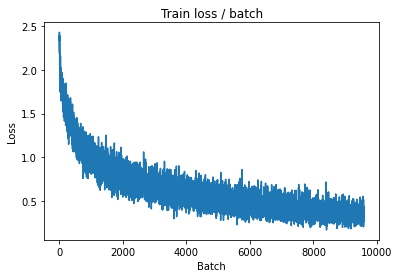


===============> Total time 16s	Avg loss 0.3470	Avg Prec@1 87.72 %	Avg Prec@5 99.65 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.4656 (0.4656)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4947	Avg Prec@1 84.06 %	Avg Prec@5 99.18 %



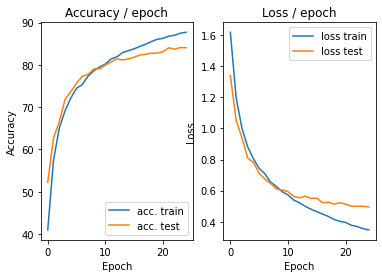

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.4254 (0.4254)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


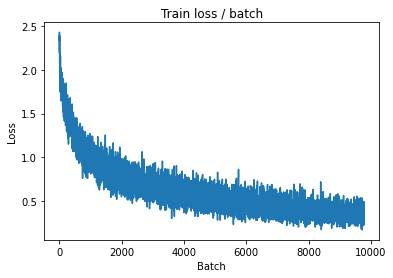

[TRAIN Batch 200/391]	Time 0.015s (0.043s)	Loss 0.3426 (0.3338)	Prec@1  85.9 ( 88.1)	Prec@5 100.0 ( 99.7)


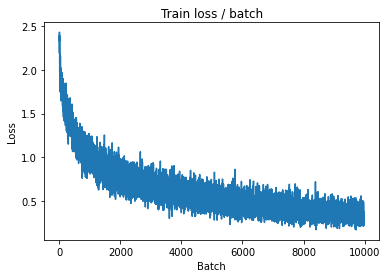


===============> Total time 16s	Avg loss 0.3369	Avg Prec@1 88.10 %	Avg Prec@5 99.66 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.3821 (0.3821)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4983	Avg Prec@1 84.19 %	Avg Prec@5 99.10 %



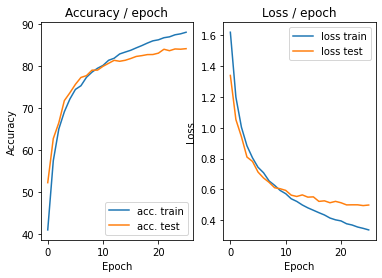

In [ ]:
mainbatch(128, 0.1, cuda=True)

On augmente le nombre d'epochs afin que le modéle converge

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 2.3745 (2.3745)	Prec@1   5.5 (  5.5)	Prec@5  46.9 ( 46.9)


<Figure size 432x288 with 0 Axes>

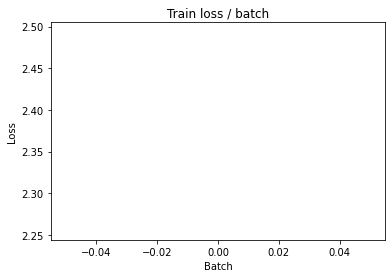

[TRAIN Batch 200/391]	Time 0.017s (0.042s)	Loss 1.6733 (1.7949)	Prec@1  40.6 ( 33.8)	Prec@5  87.5 ( 85.7)


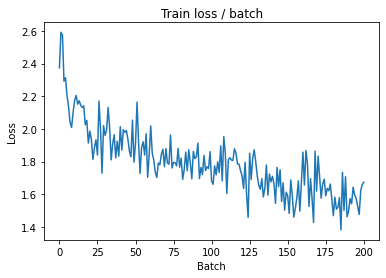


===============> Total time 16s	Avg loss 1.6158	Avg Prec@1 41.06 %	Avg Prec@5 89.17 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.4393 (1.4393)	Prec@1  48.4 ( 48.4)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.4167	Avg Prec@1 50.18 %	Avg Prec@5 92.00 %



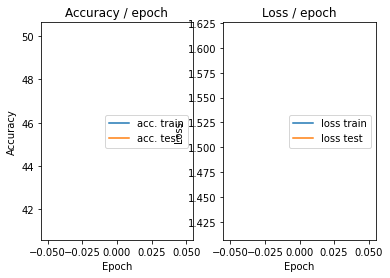

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.189s (0.189s)	Loss 1.4070 (1.4070)	Prec@1  52.3 ( 52.3)	Prec@5  93.0 ( 93.0)


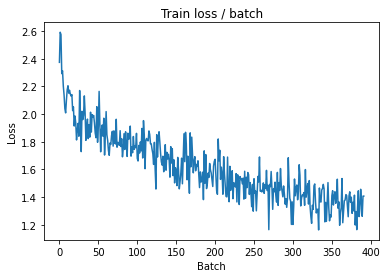

[TRAIN Batch 200/391]	Time 0.018s (0.042s)	Loss 1.1777 (1.2518)	Prec@1  53.9 ( 55.6)	Prec@5  95.3 ( 94.5)


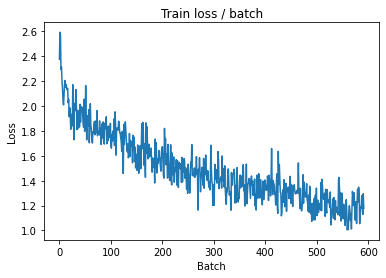


===============> Total time 16s	Avg loss 1.1973	Avg Prec@1 57.54 %	Avg Prec@5 94.92 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 1.0807 (1.0807)	Prec@1  60.9 ( 60.9)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1432	Avg Prec@1 59.43 %	Avg Prec@5 95.42 %



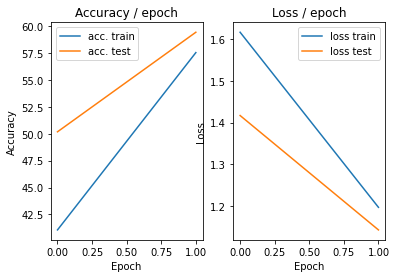

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 1.0012 (1.0012)	Prec@1  68.0 ( 68.0)	Prec@5  95.3 ( 95.3)


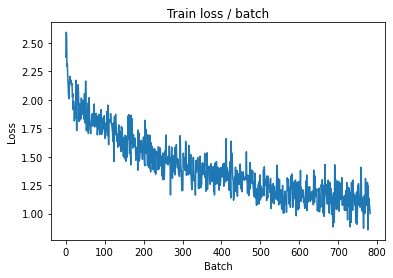

[TRAIN Batch 200/391]	Time 0.017s (0.043s)	Loss 1.0622 (1.0384)	Prec@1  60.9 ( 63.9)	Prec@5  95.3 ( 96.2)


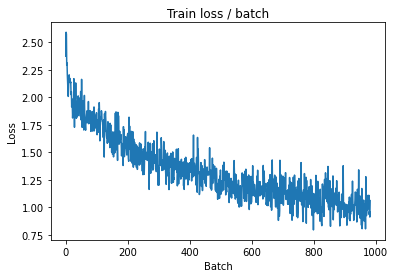


===============> Total time 16s	Avg loss 1.0008	Avg Prec@1 65.11 %	Avg Prec@5 96.47 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 0.9779 (0.9779)	Prec@1  66.4 ( 66.4)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.9608	Avg Prec@1 66.12 %	Avg Prec@5 96.93 %



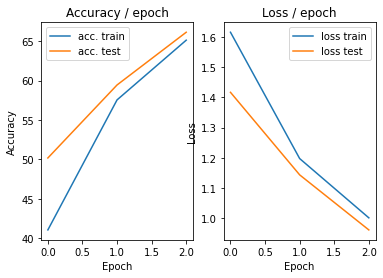

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.9888 (0.9888)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)


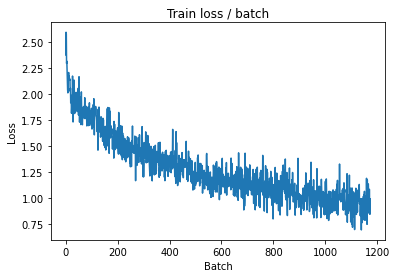

[TRAIN Batch 200/391]	Time 0.070s (0.043s)	Loss 0.8328 (0.9096)	Prec@1  69.5 ( 68.3)	Prec@5  96.9 ( 97.2)


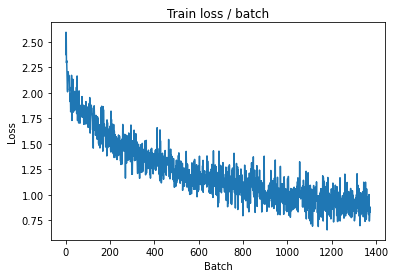


===============> Total time 16s	Avg loss 0.9033	Avg Prec@1 68.78 %	Avg Prec@5 97.16 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.8002 (0.8002)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.8274	Avg Prec@1 71.30 %	Avg Prec@5 97.72 %



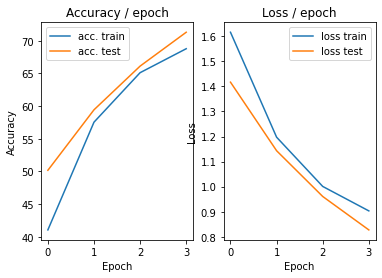

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.7403 (0.7403)	Prec@1  75.8 ( 75.8)	Prec@5  96.9 ( 96.9)


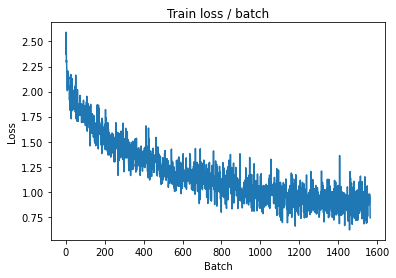

[TRAIN Batch 200/391]	Time 0.066s (0.043s)	Loss 0.9448 (0.8100)	Prec@1  67.2 ( 72.3)	Prec@5  96.1 ( 97.8)


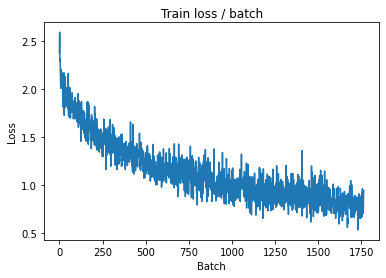


===============> Total time 16s	Avg loss 0.8082	Avg Prec@1 72.31 %	Avg Prec@5 97.70 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.6807 (0.6807)	Prec@1  80.5 ( 80.5)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7667	Avg Prec@1 74.15 %	Avg Prec@5 97.85 %



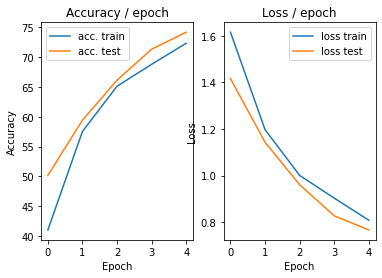

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.9167 (0.9167)	Prec@1  69.5 ( 69.5)	Prec@5  97.7 ( 97.7)


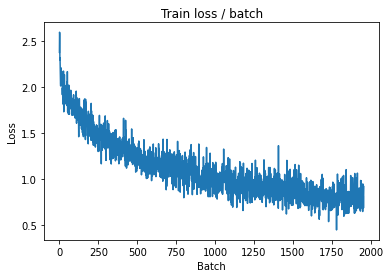

[TRAIN Batch 200/391]	Time 0.058s (0.044s)	Loss 0.6893 (0.7584)	Prec@1  75.0 ( 74.2)	Prec@5  97.7 ( 98.0)


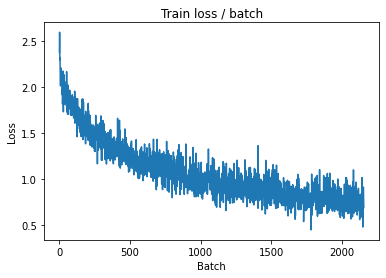


===============> Total time 16s	Avg loss 0.7506	Avg Prec@1 74.14 %	Avg Prec@5 98.03 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.6827 (0.6827)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7019	Avg Prec@1 76.48 %	Avg Prec@5 98.31 %



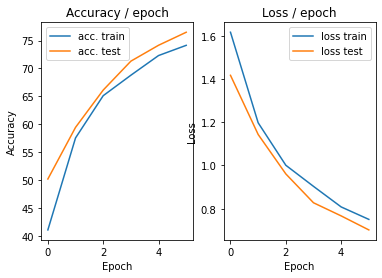

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.215s (0.215s)	Loss 0.5500 (0.5500)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)


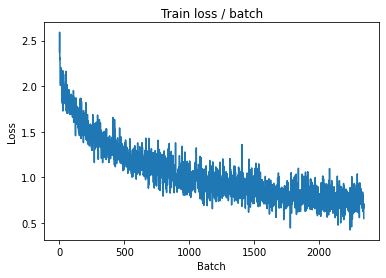

[TRAIN Batch 200/391]	Time 0.015s (0.043s)	Loss 0.7026 (0.7125)	Prec@1  76.6 ( 75.5)	Prec@5 100.0 ( 98.3)


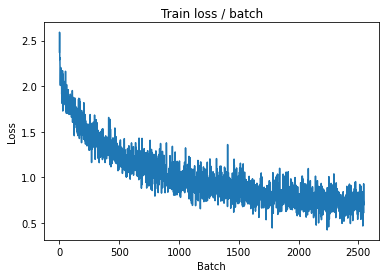


===============> Total time 16s	Avg loss 0.7052	Avg Prec@1 75.64 %	Avg Prec@5 98.31 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.6657 (0.6657)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7326	Avg Prec@1 75.61 %	Avg Prec@5 98.38 %



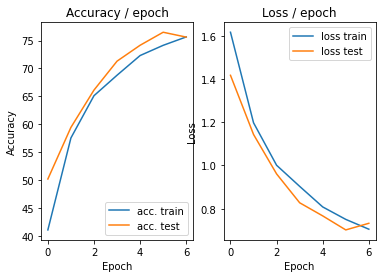

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.5905 (0.5905)	Prec@1  81.2 ( 81.2)	Prec@5  96.9 ( 96.9)


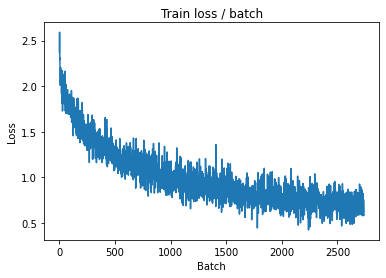

[TRAIN Batch 200/391]	Time 0.016s (0.043s)	Loss 0.7841 (0.6613)	Prec@1  72.7 ( 77.3)	Prec@5  98.4 ( 98.5)


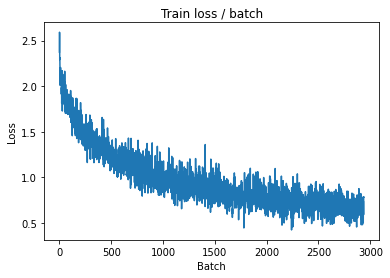


===============> Total time 16s	Avg loss 0.6648	Avg Prec@1 77.14 %	Avg Prec@5 98.48 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.6942 (0.6942)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.7431	Avg Prec@1 74.80 %	Avg Prec@5 98.12 %



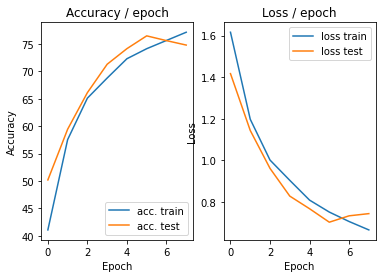

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.4929 (0.4929)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


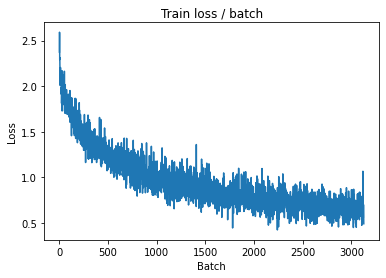

[TRAIN Batch 200/391]	Time 0.022s (0.043s)	Loss 0.7394 (0.6394)	Prec@1  71.9 ( 77.9)	Prec@5  98.4 ( 98.6)


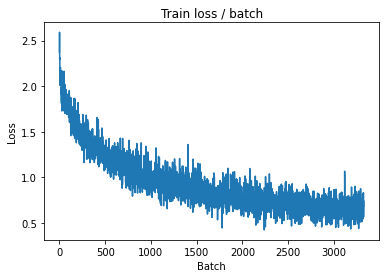


===============> Total time 16s	Avg loss 0.6348	Avg Prec@1 78.02 %	Avg Prec@5 98.66 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.5913 (0.5913)	Prec@1  82.8 ( 82.8)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6340	Avg Prec@1 78.81 %	Avg Prec@5 98.62 %



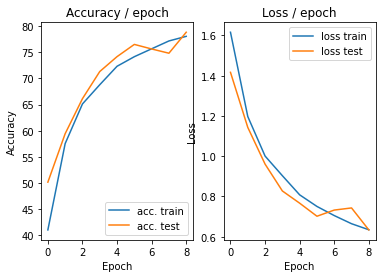

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.218s (0.218s)	Loss 0.5565 (0.5565)	Prec@1  75.0 ( 75.0)	Prec@5  97.7 ( 97.7)


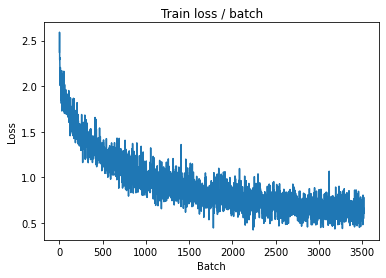

[TRAIN Batch 200/391]	Time 0.017s (0.043s)	Loss 0.5970 (0.5899)	Prec@1  81.2 ( 79.6)	Prec@5 100.0 ( 98.8)


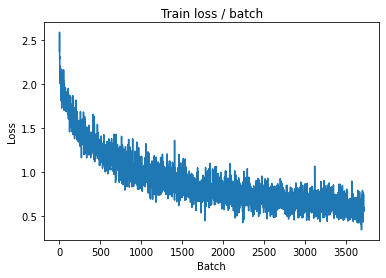


===============> Total time 16s	Avg loss 0.5926	Avg Prec@1 79.49 %	Avg Prec@5 98.82 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.5356 (0.5356)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5934	Avg Prec@1 80.39 %	Avg Prec@5 98.87 %



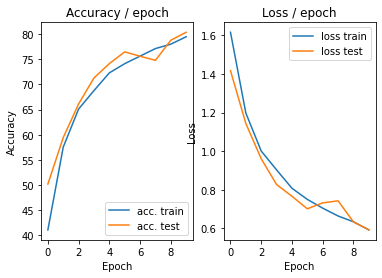

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.4466 (0.4466)	Prec@1  85.9 ( 85.9)	Prec@5  97.7 ( 97.7)


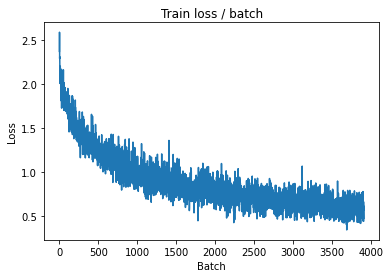

[TRAIN Batch 200/391]	Time 0.075s (0.043s)	Loss 0.5469 (0.5640)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 98.9)


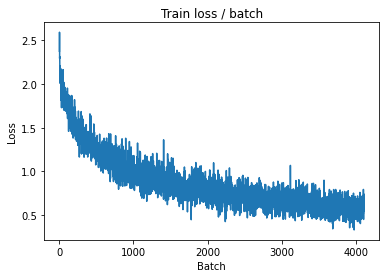


===============> Total time 16s	Avg loss 0.5732	Avg Prec@1 80.26 %	Avg Prec@5 98.86 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.5469 (0.5469)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6151	Avg Prec@1 79.24 %	Avg Prec@5 98.56 %



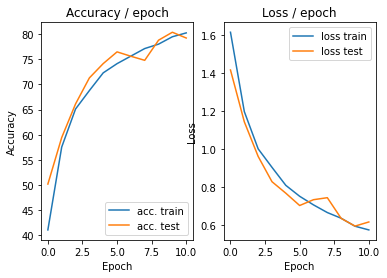

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.4925 (0.4925)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


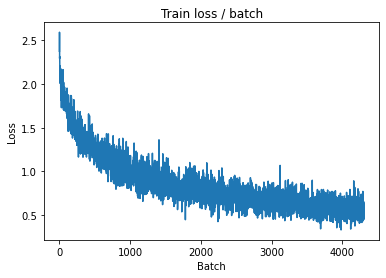

[TRAIN Batch 200/391]	Time 0.036s (0.043s)	Loss 0.4330 (0.5382)	Prec@1  86.7 ( 81.3)	Prec@5 100.0 ( 99.0)


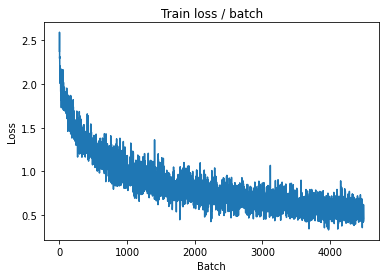


===============> Total time 16s	Avg loss 0.5439	Avg Prec@1 81.11 %	Avg Prec@5 99.02 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.5224 (0.5224)	Prec@1  87.5 ( 87.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5647	Avg Prec@1 80.99 %	Avg Prec@5 98.85 %



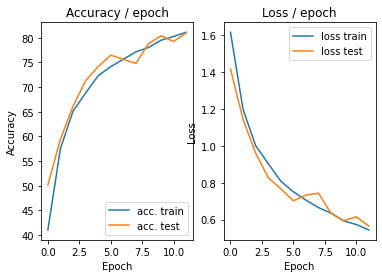

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.3803 (0.3803)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


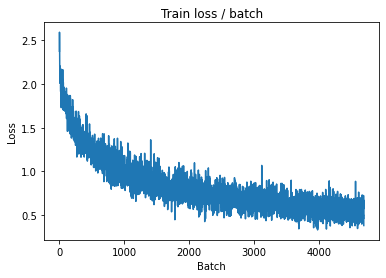

[TRAIN Batch 200/391]	Time 0.017s (0.043s)	Loss 0.5843 (0.5202)	Prec@1  75.8 ( 81.9)	Prec@5  99.2 ( 99.1)


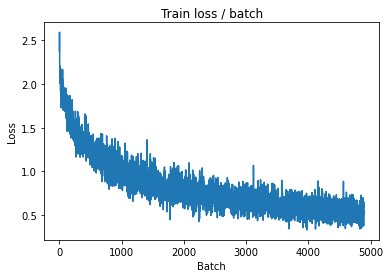


===============> Total time 16s	Avg loss 0.5215	Avg Prec@1 81.91 %	Avg Prec@5 99.10 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.4710 (0.4710)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5606	Avg Prec@1 81.03 %	Avg Prec@5 98.87 %



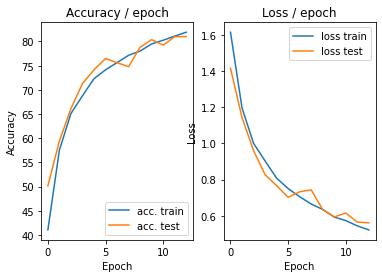

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.5467 (0.5467)	Prec@1  82.8 ( 82.8)	Prec@5  99.2 ( 99.2)


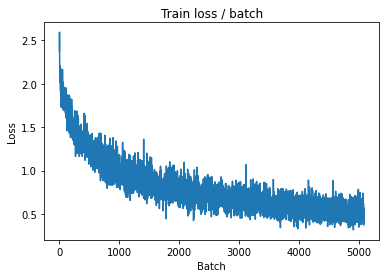

[TRAIN Batch 200/391]	Time 0.023s (0.043s)	Loss 0.5964 (0.4993)	Prec@1  81.2 ( 82.6)	Prec@5  97.7 ( 99.2)


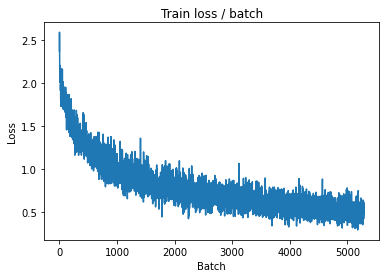


===============> Total time 16s	Avg loss 0.5007	Avg Prec@1 82.54 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.4975 (0.4975)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5830	Avg Prec@1 80.81 %	Avg Prec@5 98.78 %



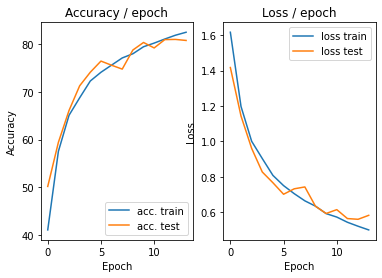

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.3889 (0.3889)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


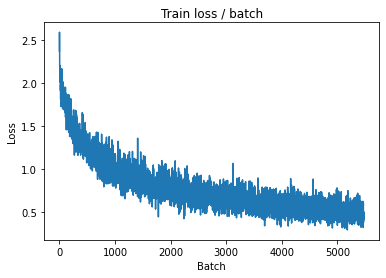

[TRAIN Batch 200/391]	Time 0.065s (0.043s)	Loss 0.3398 (0.4756)	Prec@1  91.4 ( 83.5)	Prec@5  99.2 ( 99.2)


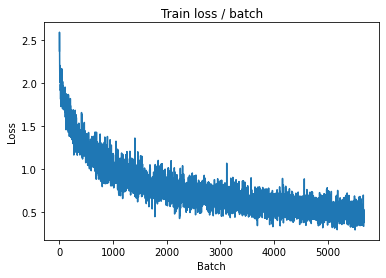


===============> Total time 16s	Avg loss 0.4792	Avg Prec@1 83.32 %	Avg Prec@5 99.21 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.4339 (0.4339)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5561	Avg Prec@1 81.31 %	Avg Prec@5 98.99 %



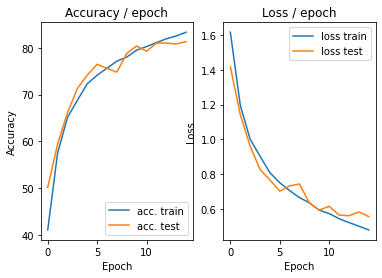

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.4589 (0.4589)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


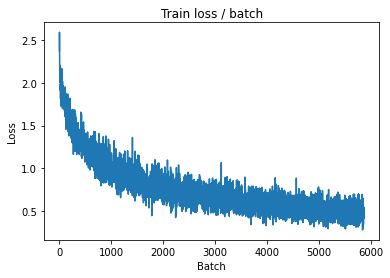

[TRAIN Batch 200/391]	Time 0.047s (0.043s)	Loss 0.5173 (0.4639)	Prec@1  81.2 ( 83.7)	Prec@5 100.0 ( 99.3)


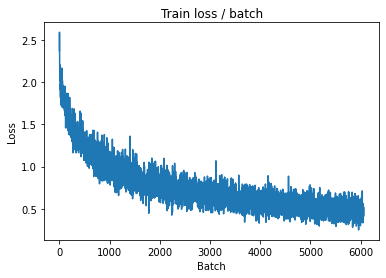


===============> Total time 16s	Avg loss 0.4672	Avg Prec@1 83.60 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.5235 (0.5235)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5421	Avg Prec@1 81.67 %	Avg Prec@5 98.95 %



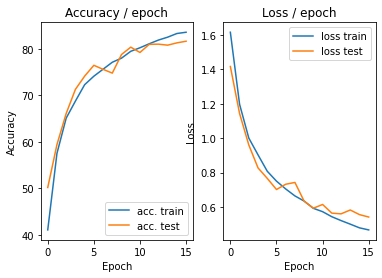

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.4021 (0.4021)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


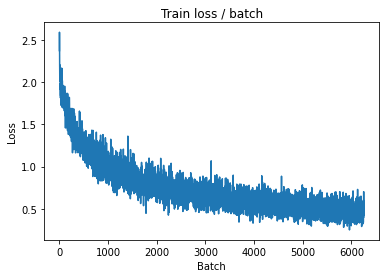

[TRAIN Batch 200/391]	Time 0.070s (0.043s)	Loss 0.4138 (0.4459)	Prec@1  82.0 ( 84.6)	Prec@5 100.0 ( 99.4)


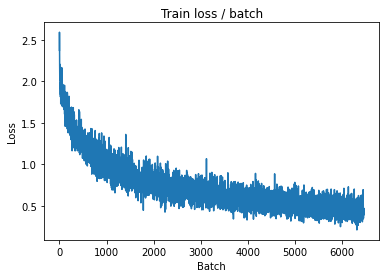


===============> Total time 16s	Avg loss 0.4520	Avg Prec@1 84.27 %	Avg Prec@5 99.32 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.4397 (0.4397)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5315	Avg Prec@1 82.26 %	Avg Prec@5 99.11 %



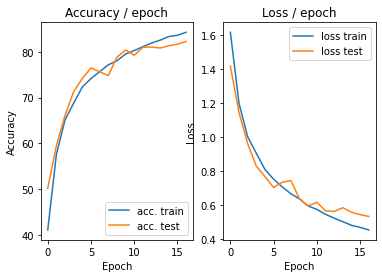

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.4911 (0.4911)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


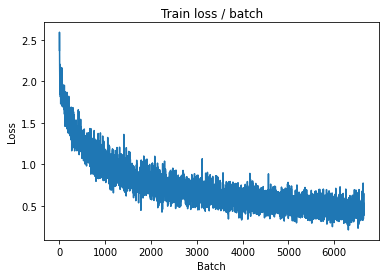

[TRAIN Batch 200/391]	Time 0.017s (0.043s)	Loss 0.4718 (0.4310)	Prec@1  85.9 ( 85.2)	Prec@5 100.0 ( 99.4)


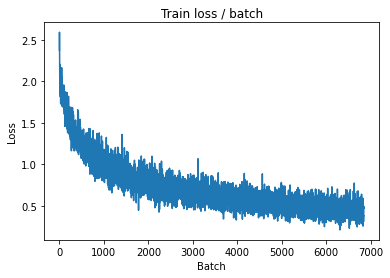


===============> Total time 16s	Avg loss 0.4335	Avg Prec@1 85.01 %	Avg Prec@5 99.38 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.4045 (0.4045)	Prec@1  89.1 ( 89.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5158	Avg Prec@1 82.30 %	Avg Prec@5 99.14 %



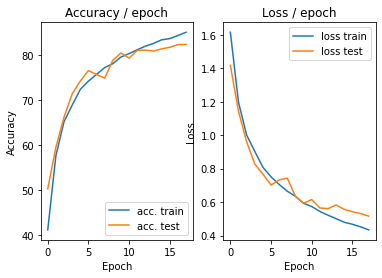

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 0.5660 (0.5660)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)


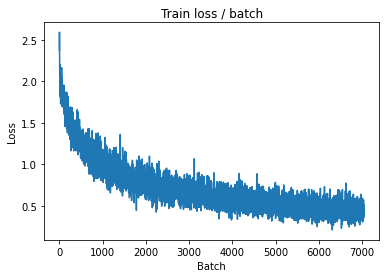

[TRAIN Batch 200/391]	Time 0.079s (0.044s)	Loss 0.3970 (0.4044)	Prec@1  85.2 ( 85.9)	Prec@5  99.2 ( 99.5)


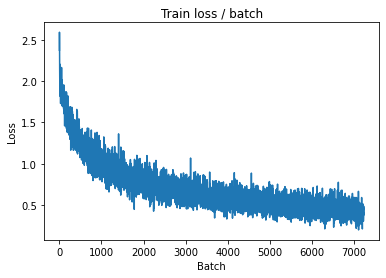


===============> Total time 17s	Avg loss 0.4163	Avg Prec@1 85.54 %	Avg Prec@5 99.44 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.4747 (0.4747)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5211	Avg Prec@1 82.47 %	Avg Prec@5 99.13 %



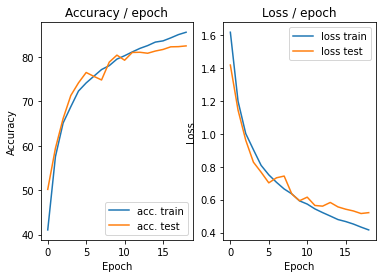

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.3376 (0.3376)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)


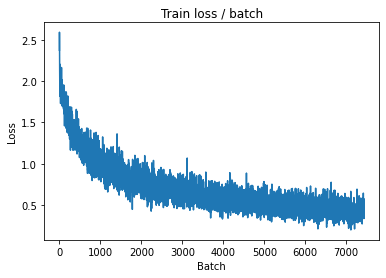

[TRAIN Batch 200/391]	Time 0.048s (0.044s)	Loss 0.3621 (0.4028)	Prec@1  87.5 ( 86.0)	Prec@5 100.0 ( 99.4)


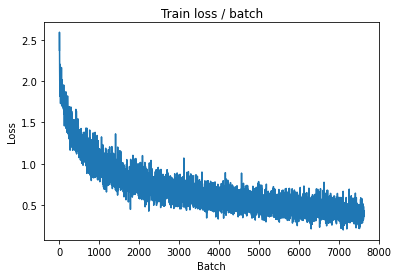


===============> Total time 17s	Avg loss 0.4061	Avg Prec@1 85.76 %	Avg Prec@5 99.48 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 0.3968 (0.3968)	Prec@1  89.1 ( 89.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5410	Avg Prec@1 81.86 %	Avg Prec@5 99.11 %



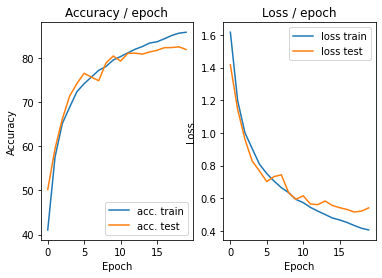

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.215s (0.215s)	Loss 0.4358 (0.4358)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)


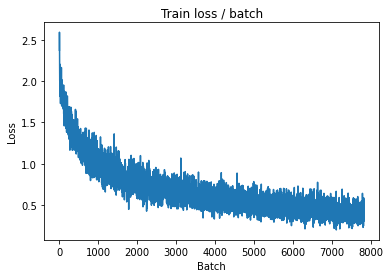

[TRAIN Batch 200/391]	Time 0.024s (0.044s)	Loss 0.3503 (0.3895)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.5)


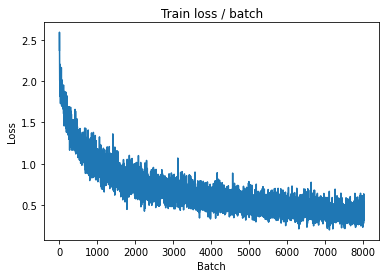


===============> Total time 17s	Avg loss 0.3937	Avg Prec@1 86.48 %	Avg Prec@5 99.50 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.4303 (0.4303)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5200	Avg Prec@1 82.83 %	Avg Prec@5 99.21 %



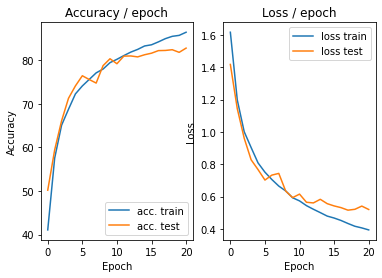

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 0.2700 (0.2700)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


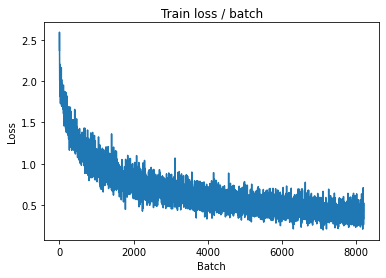

[TRAIN Batch 200/391]	Time 0.018s (0.044s)	Loss 0.4142 (0.3792)	Prec@1  85.9 ( 86.9)	Prec@5  99.2 ( 99.6)


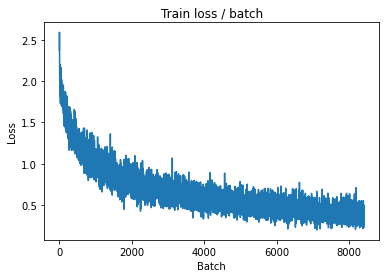


===============> Total time 16s	Avg loss 0.3845	Avg Prec@1 86.62 %	Avg Prec@5 99.57 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.4581 (0.4581)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5141	Avg Prec@1 83.23 %	Avg Prec@5 99.18 %



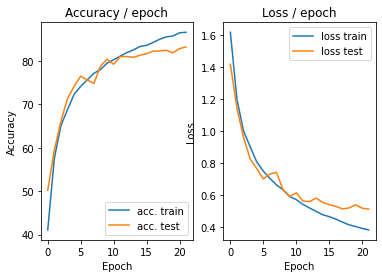

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.4066 (0.4066)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


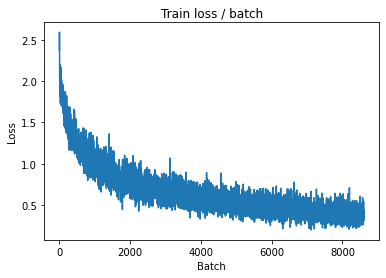

[TRAIN Batch 200/391]	Time 0.066s (0.043s)	Loss 0.4550 (0.3696)	Prec@1  82.8 ( 87.0)	Prec@5  98.4 ( 99.6)


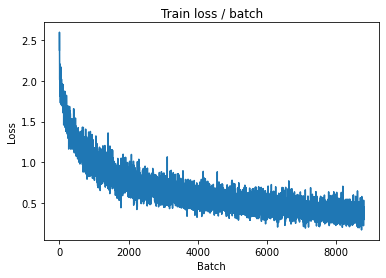


===============> Total time 16s	Avg loss 0.3716	Avg Prec@1 86.91 %	Avg Prec@5 99.59 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 0.4219 (0.4219)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5063	Avg Prec@1 83.40 %	Avg Prec@5 99.09 %



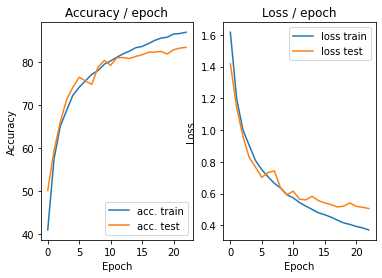

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 0.4047 (0.4047)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


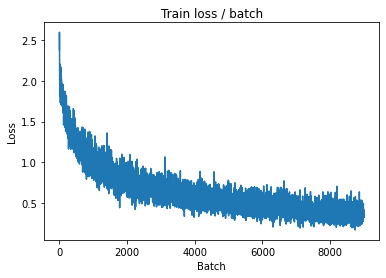

[TRAIN Batch 200/391]	Time 0.076s (0.044s)	Loss 0.3082 (0.3601)	Prec@1  89.1 ( 87.4)	Prec@5  99.2 ( 99.6)


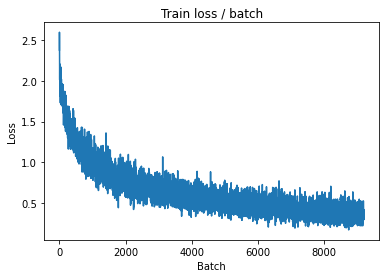


===============> Total time 17s	Avg loss 0.3607	Avg Prec@1 87.45 %	Avg Prec@5 99.60 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 0.4275 (0.4275)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5046	Avg Prec@1 83.60 %	Avg Prec@5 99.15 %



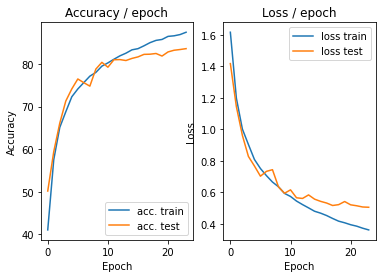

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.4342 (0.4342)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)


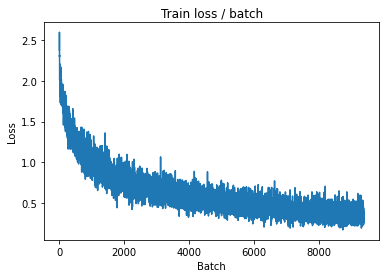

[TRAIN Batch 200/391]	Time 0.065s (0.044s)	Loss 0.2963 (0.3469)	Prec@1  85.9 ( 87.7)	Prec@5 100.0 ( 99.7)


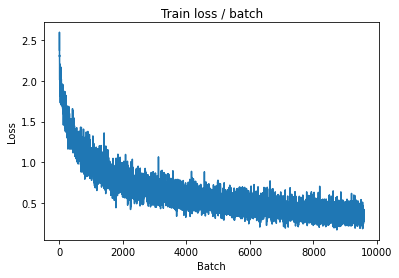


===============> Total time 16s	Avg loss 0.3485	Avg Prec@1 87.68 %	Avg Prec@5 99.65 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.4433 (0.4433)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5110	Avg Prec@1 83.30 %	Avg Prec@5 99.28 %



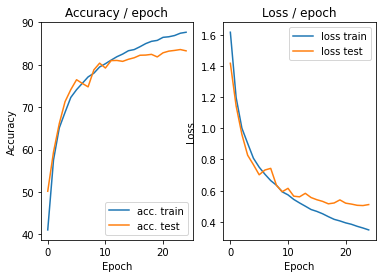

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 0.2785 (0.2785)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


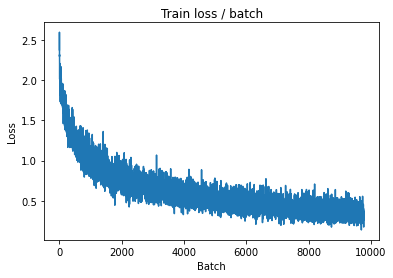

[TRAIN Batch 200/391]	Time 0.065s (0.044s)	Loss 0.4120 (0.3405)	Prec@1  85.2 ( 88.1)	Prec@5  99.2 ( 99.7)


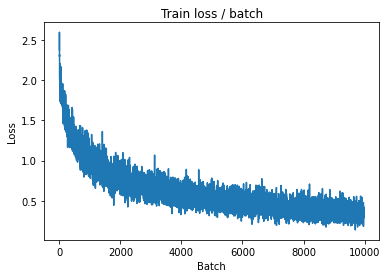


===============> Total time 16s	Avg loss 0.3399	Avg Prec@1 88.05 %	Avg Prec@5 99.64 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.3679 (0.3679)	Prec@1  92.2 ( 92.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4968	Avg Prec@1 84.22 %	Avg Prec@5 99.15 %



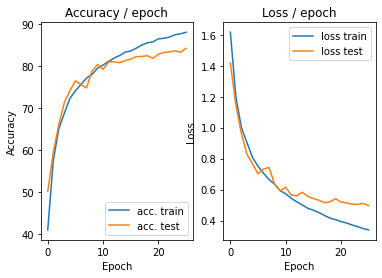

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.2019 (0.2019)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


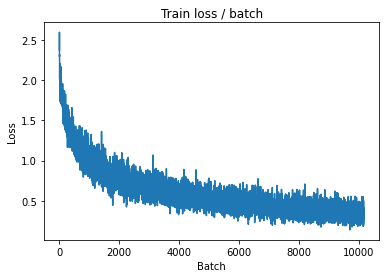

[TRAIN Batch 200/391]	Time 0.062s (0.044s)	Loss 0.2630 (0.3239)	Prec@1  90.6 ( 88.2)	Prec@5  99.2 ( 99.7)


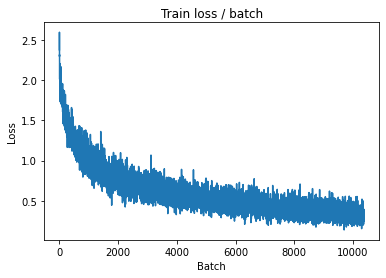


===============> Total time 16s	Avg loss 0.3278	Avg Prec@1 88.26 %	Avg Prec@5 99.69 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 0.4121 (0.4121)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5016	Avg Prec@1 84.01 %	Avg Prec@5 99.17 %



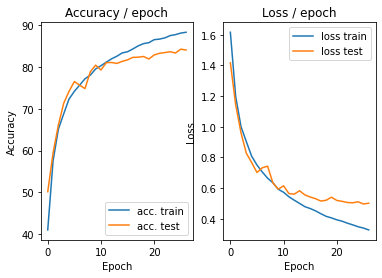

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.3134 (0.3134)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


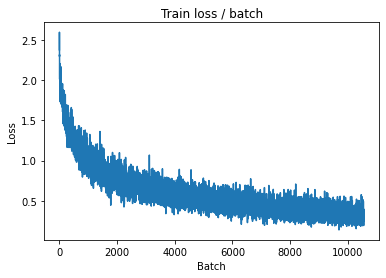

[TRAIN Batch 200/391]	Time 0.018s (0.044s)	Loss 0.3650 (0.3112)	Prec@1  89.1 ( 89.0)	Prec@5 100.0 ( 99.8)


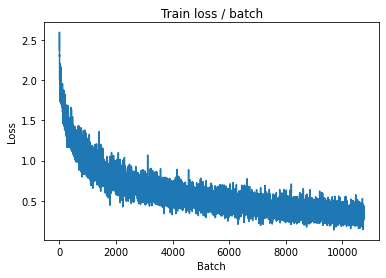


===============> Total time 16s	Avg loss 0.3207	Avg Prec@1 88.75 %	Avg Prec@5 99.70 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.4387 (0.4387)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5211	Avg Prec@1 83.63 %	Avg Prec@5 99.13 %



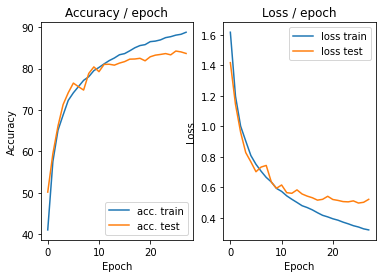

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.3306 (0.3306)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


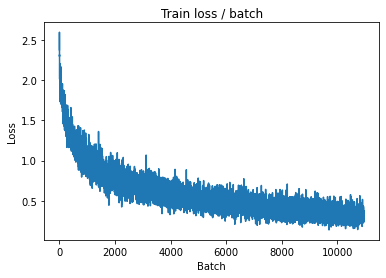

[TRAIN Batch 200/391]	Time 0.021s (0.044s)	Loss 0.3035 (0.3119)	Prec@1  88.3 ( 89.1)	Prec@5 100.0 ( 99.7)


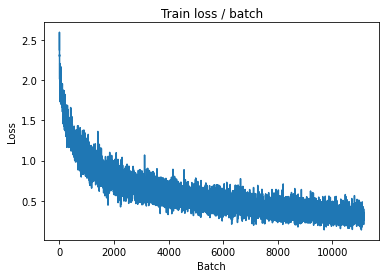


===============> Total time 16s	Avg loss 0.3145	Avg Prec@1 88.99 %	Avg Prec@5 99.74 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.3856 (0.3856)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4969	Avg Prec@1 84.23 %	Avg Prec@5 99.27 %



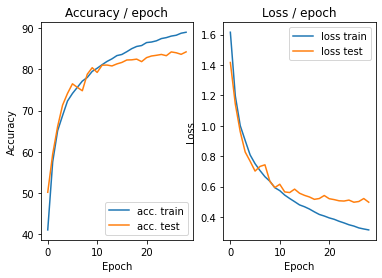

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 0.3067 (0.3067)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)


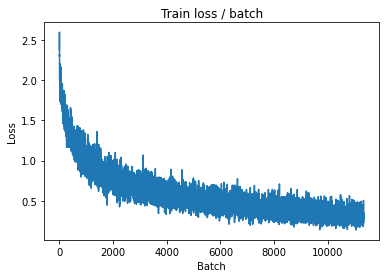

[TRAIN Batch 200/391]	Time 0.064s (0.043s)	Loss 0.3396 (0.3052)	Prec@1  88.3 ( 89.3)	Prec@5  99.2 ( 99.7)


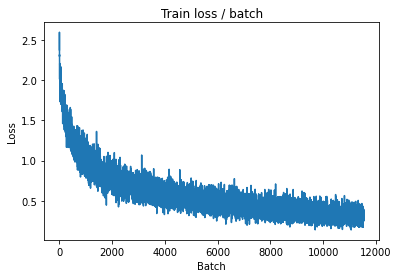


===============> Total time 16s	Avg loss 0.3060	Avg Prec@1 89.34 %	Avg Prec@5 99.72 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.3809 (0.3809)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5073	Avg Prec@1 84.10 %	Avg Prec@5 99.27 %



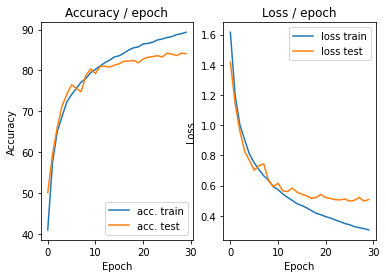

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.210s (0.210s)	Loss 0.3577 (0.3577)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)


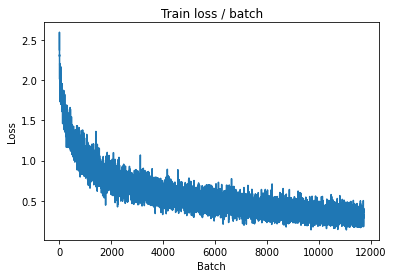

[TRAIN Batch 200/391]	Time 0.064s (0.044s)	Loss 0.2191 (0.2974)	Prec@1  91.4 ( 89.4)	Prec@5 100.0 ( 99.8)


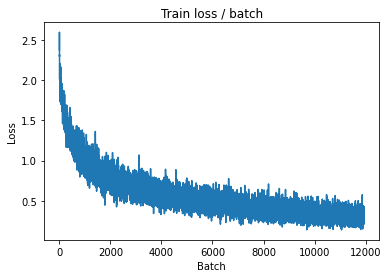


===============> Total time 16s	Avg loss 0.3021	Avg Prec@1 89.20 %	Avg Prec@5 99.77 %

[EVAL Batch 000/079]	Time 0.173s (0.173s)	Loss 0.3536 (0.3536)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4991	Avg Prec@1 84.18 %	Avg Prec@5 99.28 %



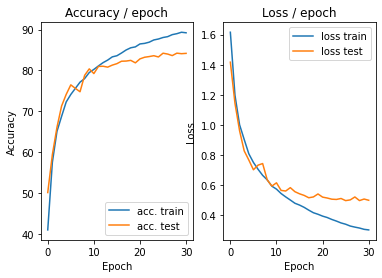

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 0.2699 (0.2699)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)


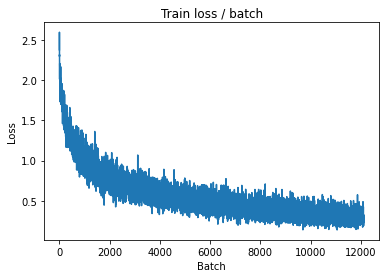

[TRAIN Batch 200/391]	Time 0.076s (0.043s)	Loss 0.2190 (0.2847)	Prec@1  89.8 ( 89.9)	Prec@5 100.0 ( 99.8)


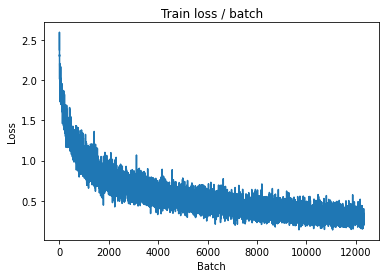


===============> Total time 16s	Avg loss 0.2861	Avg Prec@1 89.84 %	Avg Prec@5 99.76 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.3895 (0.3895)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5014	Avg Prec@1 84.55 %	Avg Prec@5 99.22 %



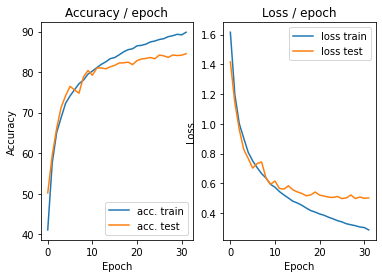

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.3889 (0.3889)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


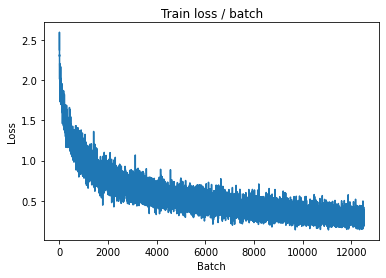

[TRAIN Batch 200/391]	Time 0.022s (0.043s)	Loss 0.3724 (0.2828)	Prec@1  85.9 ( 90.2)	Prec@5 100.0 ( 99.8)


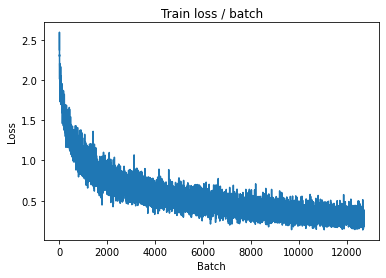


===============> Total time 16s	Avg loss 0.2847	Avg Prec@1 90.10 %	Avg Prec@5 99.77 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.3990 (0.3990)	Prec@1  92.2 ( 92.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4991	Avg Prec@1 84.59 %	Avg Prec@5 99.17 %



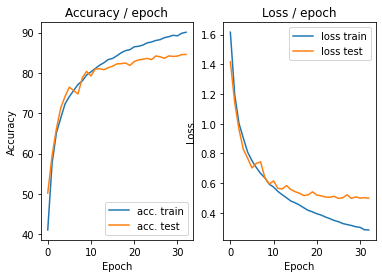

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.219s (0.219s)	Loss 0.2249 (0.2249)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


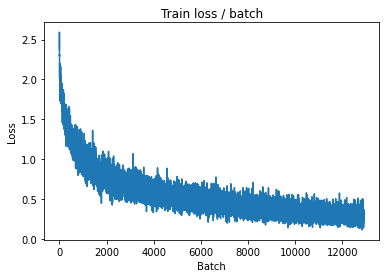

[TRAIN Batch 200/391]	Time 0.062s (0.044s)	Loss 0.4116 (0.2756)	Prec@1  84.4 ( 90.5)	Prec@5 100.0 ( 99.8)


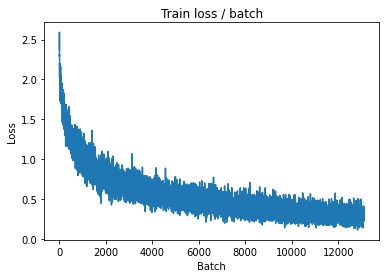


===============> Total time 16s	Avg loss 0.2780	Avg Prec@1 90.25 %	Avg Prec@5 99.79 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.3683 (0.3683)	Prec@1  92.2 ( 92.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4920	Avg Prec@1 84.77 %	Avg Prec@5 99.19 %



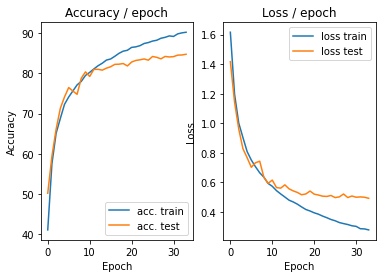

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.2475 (0.2475)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


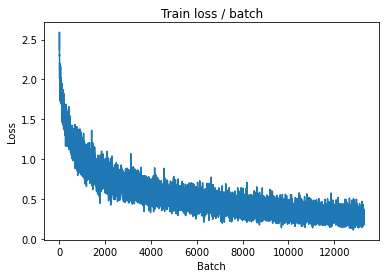

[TRAIN Batch 200/391]	Time 0.018s (0.044s)	Loss 0.3279 (0.2667)	Prec@1  87.5 ( 90.6)	Prec@5  99.2 ( 99.8)


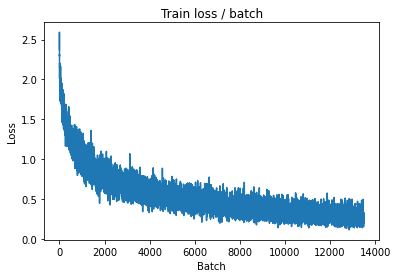


===============> Total time 16s	Avg loss 0.2713	Avg Prec@1 90.41 %	Avg Prec@5 99.79 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.3778 (0.3778)	Prec@1  91.4 ( 91.4)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.4906	Avg Prec@1 84.39 %	Avg Prec@5 99.25 %



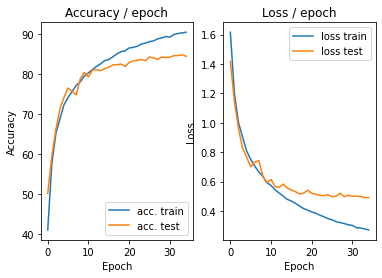

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 0.2358 (0.2358)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)


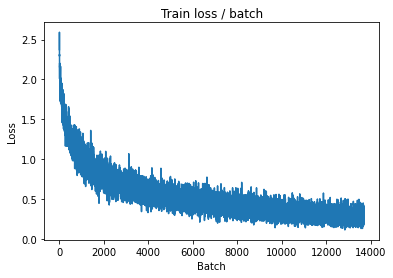

[TRAIN Batch 200/391]	Time 0.020s (0.043s)	Loss 0.2535 (0.2612)	Prec@1  89.1 ( 90.7)	Prec@5 100.0 ( 99.8)


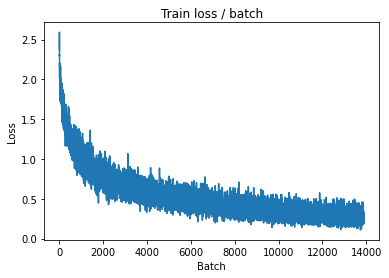


===============> Total time 16s	Avg loss 0.2664	Avg Prec@1 90.51 %	Avg Prec@5 99.84 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.4007 (0.4007)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4974	Avg Prec@1 84.79 %	Avg Prec@5 99.18 %



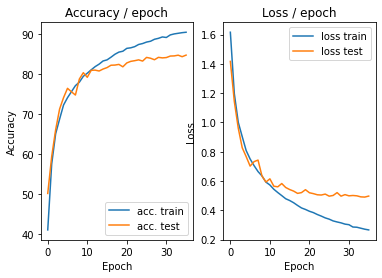

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.2948 (0.2948)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


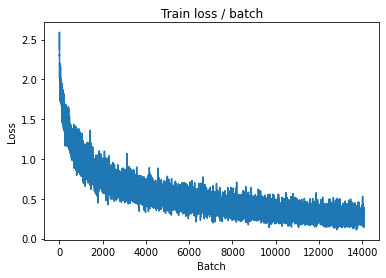

[TRAIN Batch 200/391]	Time 0.071s (0.043s)	Loss 0.2406 (0.2600)	Prec@1  90.6 ( 90.7)	Prec@5 100.0 ( 99.8)


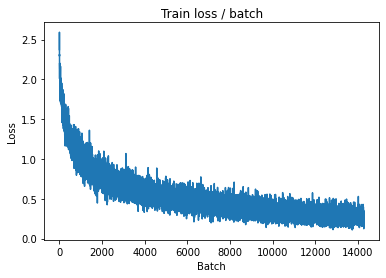


===============> Total time 16s	Avg loss 0.2667	Avg Prec@1 90.59 %	Avg Prec@5 99.78 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.3623 (0.3623)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4761	Avg Prec@1 84.84 %	Avg Prec@5 99.25 %



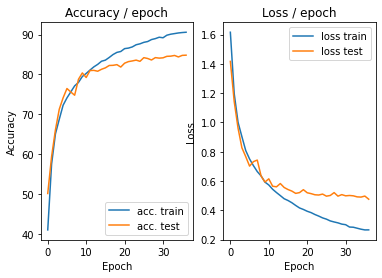

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.3975 (0.3975)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


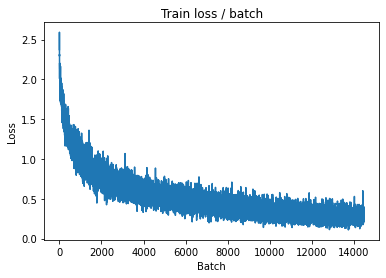

[TRAIN Batch 200/391]	Time 0.026s (0.043s)	Loss 0.3217 (0.2497)	Prec@1  88.3 ( 91.1)	Prec@5 100.0 ( 99.8)


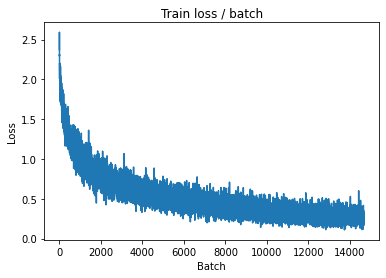


===============> Total time 16s	Avg loss 0.2534	Avg Prec@1 90.95 %	Avg Prec@5 99.85 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.3629 (0.3629)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4881	Avg Prec@1 84.99 %	Avg Prec@5 99.23 %



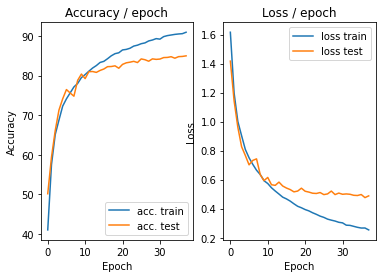

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 0.2392 (0.2392)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


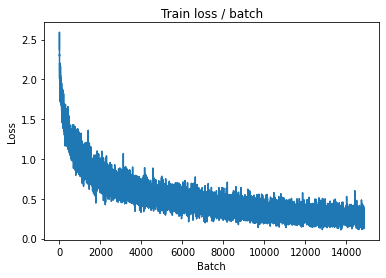

[TRAIN Batch 200/391]	Time 0.016s (0.044s)	Loss 0.2210 (0.2505)	Prec@1  92.2 ( 91.2)	Prec@5 100.0 ( 99.8)


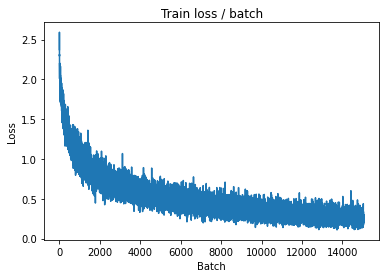


===============> Total time 17s	Avg loss 0.2508	Avg Prec@1 91.15 %	Avg Prec@5 99.82 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.3763 (0.3763)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4919	Avg Prec@1 84.64 %	Avg Prec@5 99.25 %



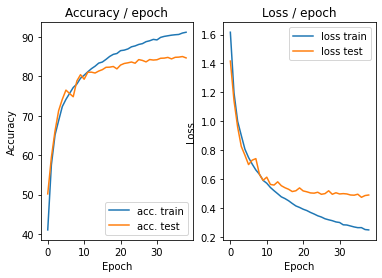

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 0.2750 (0.2750)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


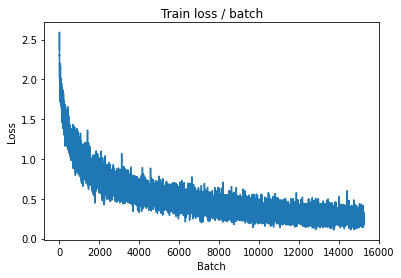

[TRAIN Batch 200/391]	Time 0.022s (0.043s)	Loss 0.1169 (0.2457)	Prec@1  96.1 ( 91.4)	Prec@5 100.0 ( 99.9)


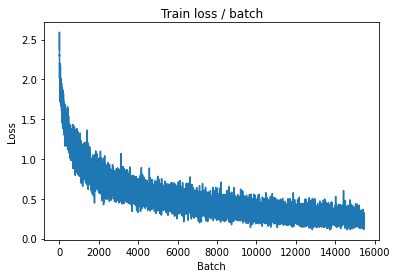


===============> Total time 16s	Avg loss 0.2468	Avg Prec@1 91.36 %	Avg Prec@5 99.85 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.3915 (0.3915)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5017	Avg Prec@1 84.66 %	Avg Prec@5 99.28 %



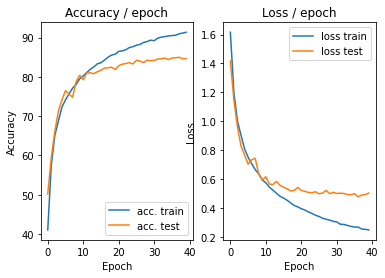

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.2326 (0.2326)	Prec@1  91.4 ( 91.4)	Prec@5 100.0 (100.0)


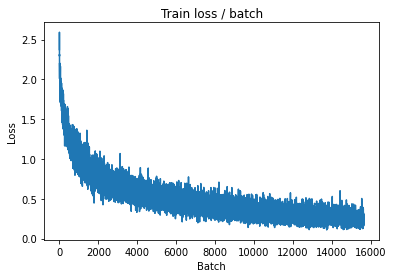

[TRAIN Batch 200/391]	Time 0.016s (0.043s)	Loss 0.2425 (0.2372)	Prec@1  89.1 ( 91.6)	Prec@5 100.0 ( 99.8)


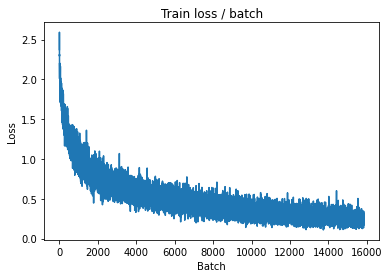


===============> Total time 16s	Avg loss 0.2388	Avg Prec@1 91.47 %	Avg Prec@5 99.83 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.3957 (0.3957)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4999	Avg Prec@1 85.01 %	Avg Prec@5 99.28 %



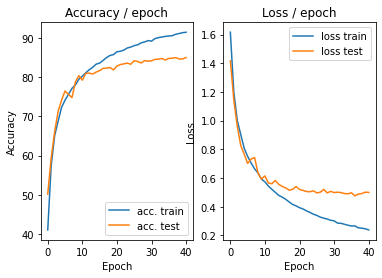

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.2598 (0.2598)	Prec@1  90.6 ( 90.6)	Prec@5 100.0 (100.0)


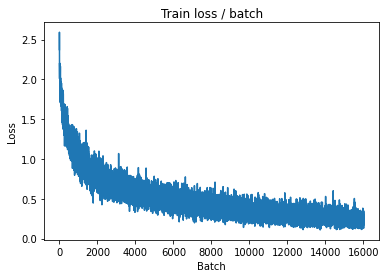

[TRAIN Batch 200/391]	Time 0.037s (0.043s)	Loss 0.2089 (0.2392)	Prec@1  93.0 ( 91.5)	Prec@5 100.0 ( 99.8)


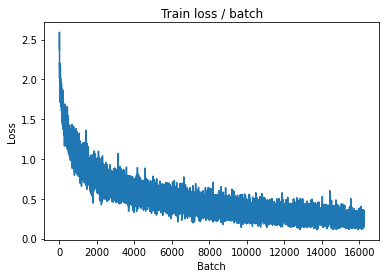


===============> Total time 16s	Avg loss 0.2371	Avg Prec@1 91.61 %	Avg Prec@5 99.86 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.3597 (0.3597)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4951	Avg Prec@1 85.22 %	Avg Prec@5 99.27 %



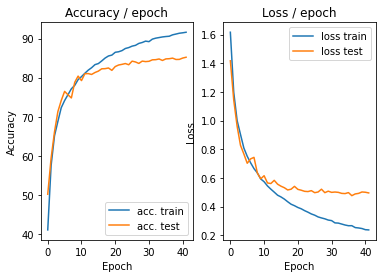

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.1549 (0.1549)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


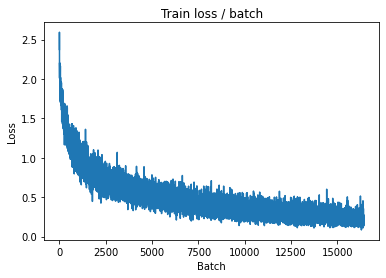

[TRAIN Batch 200/391]	Time 0.069s (0.043s)	Loss 0.2854 (0.2349)	Prec@1  86.7 ( 91.6)	Prec@5 100.0 ( 99.9)


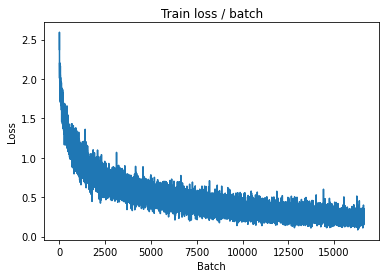


===============> Total time 16s	Avg loss 0.2332	Avg Prec@1 91.73 %	Avg Prec@5 99.84 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.4008 (0.4008)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4842	Avg Prec@1 85.33 %	Avg Prec@5 99.23 %



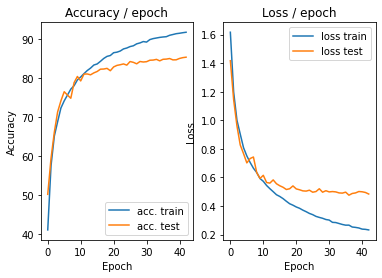

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.1843 (0.1843)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


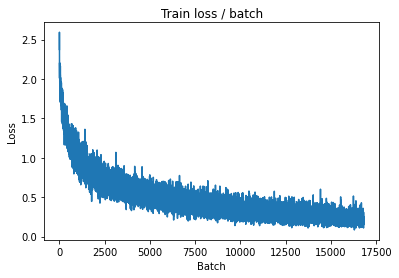

[TRAIN Batch 200/391]	Time 0.059s (0.043s)	Loss 0.1427 (0.2314)	Prec@1  93.8 ( 91.9)	Prec@5 100.0 ( 99.9)


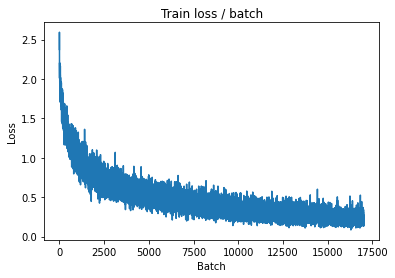


===============> Total time 16s	Avg loss 0.2294	Avg Prec@1 91.86 %	Avg Prec@5 99.87 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.3944 (0.3944)	Prec@1  93.0 ( 93.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4901	Avg Prec@1 85.24 %	Avg Prec@5 99.29 %



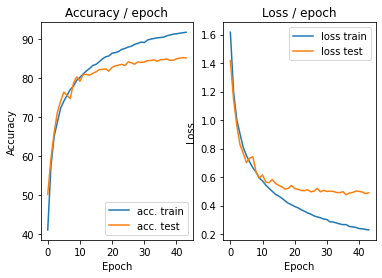

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.2646 (0.2646)	Prec@1  88.3 ( 88.3)	Prec@5  98.4 ( 98.4)


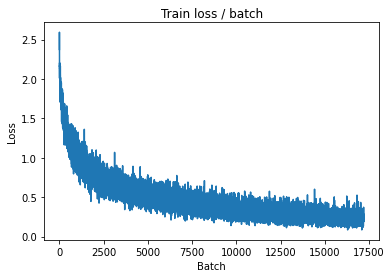

[TRAIN Batch 200/391]	Time 0.073s (0.043s)	Loss 0.1744 (0.2210)	Prec@1  92.2 ( 92.1)	Prec@5 100.0 ( 99.9)


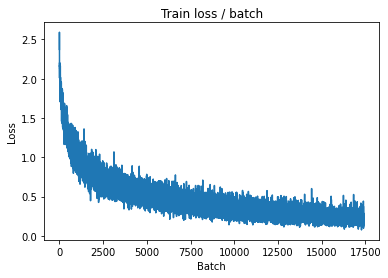


===============> Total time 16s	Avg loss 0.2245	Avg Prec@1 92.01 %	Avg Prec@5 99.87 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.4122 (0.4122)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4967	Avg Prec@1 85.21 %	Avg Prec@5 99.32 %



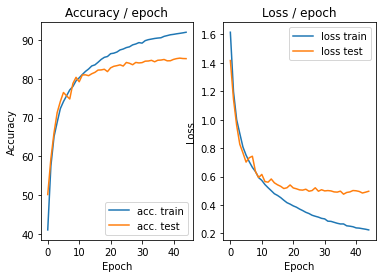

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 0.1925 (0.1925)	Prec@1  93.0 ( 93.0)	Prec@5  99.2 ( 99.2)


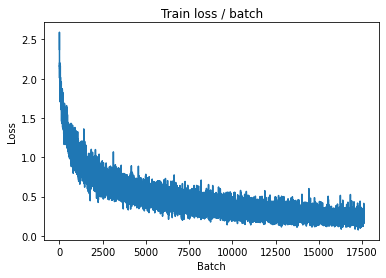

[TRAIN Batch 200/391]	Time 0.045s (0.043s)	Loss 0.1762 (0.2205)	Prec@1  93.0 ( 92.2)	Prec@5 100.0 ( 99.9)


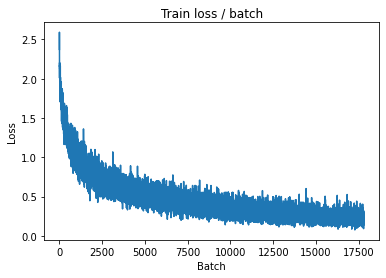


===============> Total time 16s	Avg loss 0.2185	Avg Prec@1 92.25 %	Avg Prec@5 99.89 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.4113 (0.4113)	Prec@1  91.4 ( 91.4)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5000	Avg Prec@1 85.17 %	Avg Prec@5 99.27 %



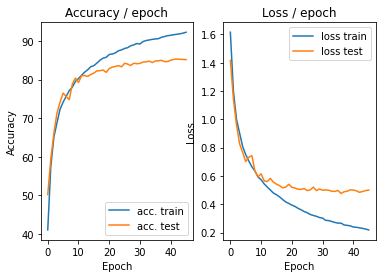

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.197s (0.197s)	Loss 0.3323 (0.3323)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


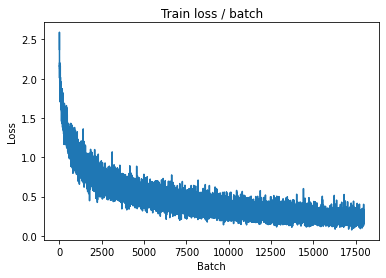

[TRAIN Batch 200/391]	Time 0.023s (0.043s)	Loss 0.1133 (0.2220)	Prec@1  96.1 ( 92.2)	Prec@5 100.0 ( 99.8)


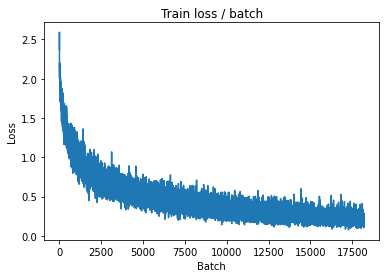


===============> Total time 17s	Avg loss 0.2186	Avg Prec@1 92.21 %	Avg Prec@5 99.88 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.3527 (0.3527)	Prec@1  93.0 ( 93.0)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4918	Avg Prec@1 85.43 %	Avg Prec@5 99.25 %



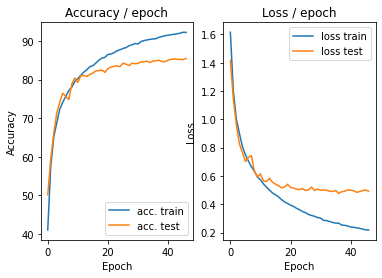

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 0.2101 (0.2101)	Prec@1  92.2 ( 92.2)	Prec@5  99.2 ( 99.2)


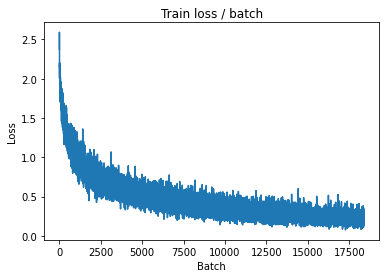

[TRAIN Batch 200/391]	Time 0.056s (0.043s)	Loss 0.2114 (0.2134)	Prec@1  89.1 ( 92.3)	Prec@5 100.0 ( 99.9)


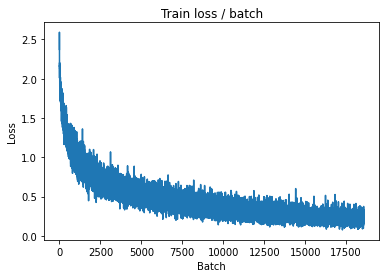


===============> Total time 16s	Avg loss 0.2141	Avg Prec@1 92.35 %	Avg Prec@5 99.88 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.3615 (0.3615)	Prec@1  90.6 ( 90.6)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4953	Avg Prec@1 85.21 %	Avg Prec@5 99.26 %



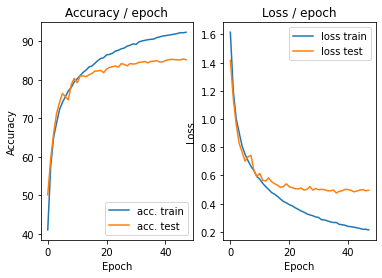

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.1846 (0.1846)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


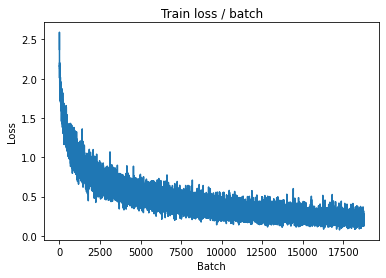

[TRAIN Batch 200/391]	Time 0.026s (0.043s)	Loss 0.2213 (0.2135)	Prec@1  89.8 ( 92.4)	Prec@5 100.0 ( 99.9)


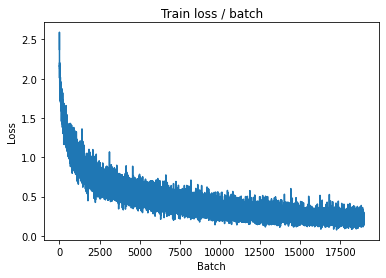


===============> Total time 16s	Avg loss 0.2088	Avg Prec@1 92.58 %	Avg Prec@5 99.90 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.4200 (0.4200)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.5024	Avg Prec@1 85.44 %	Avg Prec@5 99.30 %



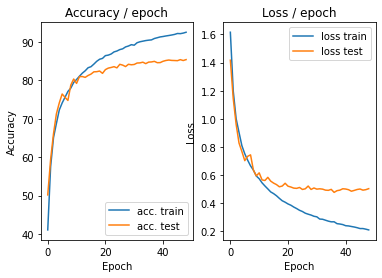

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.202s (0.202s)	Loss 0.1917 (0.1917)	Prec@1  93.8 ( 93.8)	Prec@5 100.0 (100.0)


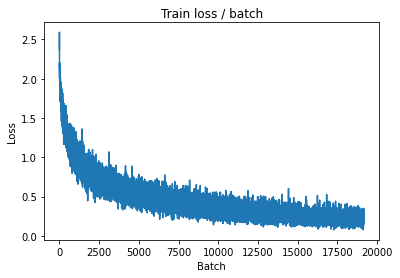

[TRAIN Batch 200/391]	Time 0.028s (0.044s)	Loss 0.2535 (0.2023)	Prec@1  93.8 ( 92.8)	Prec@5 100.0 ( 99.9)


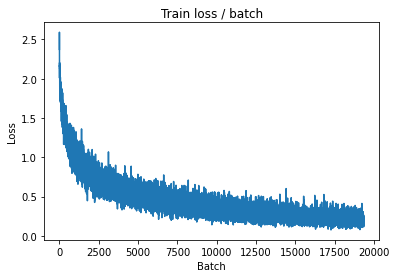


===============> Total time 16s	Avg loss 0.2068	Avg Prec@1 92.66 %	Avg Prec@5 99.88 %

[EVAL Batch 000/079]	Time 0.164s (0.164s)	Loss 0.3766 (0.3766)	Prec@1  92.2 ( 92.2)	Prec@5  99.2 ( 99.2)

===============> Total time 2s	Avg loss 0.4981	Avg Prec@1 85.32 %	Avg Prec@5 99.30 %



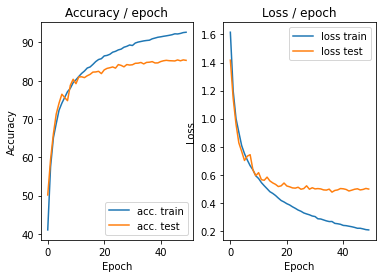

In [5]:
mainbatch(128, 0.1, 50,cuda=True)